# ClusterMap stitching

In [1]:
import sys
import os, copy
import numpy as np
import pandas as pd
import tifffile as tif
import matplotlib.pyplot as plt
from scipy.spatial import distance
from tqdm.notebook import tqdm, trange
import anndata as ad
from starmap.sequencing import *
from skimage.measure import regionprops
from skimage.color import label2rgb
from skimage.filters import median, gaussian, threshold_otsu
from skimage.morphology import disk, binary_dilation
import tifffile

In [2]:
# Load genes.csv
def load_genes(base_path):
    genes2seqs = {}
    seqs2genes = {}
    with open(os.path.join(base_path, "genes.csv"), encoding='utf-8-sig') as f:
        for l in f:
            fields = l.rstrip().split(",")
            curr_seg = "".join([str(s+1) for s in encode_SOLID(fields[1][::-1])])
            curr_seg = curr_seg[5:] + curr_seg[:4]
            # print(curr_seg)
            genes2seqs[fields[0]] = curr_seg
            seqs2genes[genes2seqs[fields[0]]] = fields[0]
            
    return genes2seqs, seqs2genes

def closest_node(node, nodes):
    closest_index = distance.cdist([node], nodes).argmin()
    return nodes[closest_index], closest_index


## Create blank tile

In [10]:
import numpy as np
from tifffile import imwrite
import os

x, y, z = [2048, 2048, 35]
output_dir = 'Z:/jiahao/Github/RIBOmap/segmentation-stitching/'

# Create blank tile
blank_3d = np.zeros((z, x, y), dtype=np.uint8)
blank_2d = np.zeros((x, y), dtype=np.uint8)

# Save blank tile to output directory
imwrite(os.path.join(output_dir, 'blank.tif'), blank_2d)

## Create round1 merged rotated max

### RIBOmap

In [31]:
import os
import argparse
import numpy as np
from tifffile import imread, imwrite
from tqdm.notebook import tqdm
from skimage.transform import rotate
from skimage.util import img_as_ubyte

data_dir = 'Z:/Data/Processed/2021-11-23-Hu-MouseBrainRIBOmap/'
tiles = sorted([d for d in os.listdir(os.path.join(data_dir, 'round1')) if "Position" in d])
# tiles = tiles[3:4]

round1_merged_rotated_max_path = os.path.join(data_dir, 'output/max_cluster/round1_merged_rotated_max')
if not os.path.exists(round1_merged_rotated_max_path):
    os.mkdir(round1_merged_rotated_max_path)
    
dapi_rotated_max_path = os.path.join(data_dir, 'output/max_cluster/dapi_rotated_max')
if not os.path.exists(dapi_rotated_max_path):
    os.mkdir(dapi_rotated_max_path)
    
# load the images 
for t in tqdm(tiles):
    
    # round1 merged
    round1_merged_path = os.path.join(data_dir, 'output/max_cluster/round1_merged', f'{t}.tif')
    round1_merged = imread(round1_merged_path)
    round1_merged_rotated_max = rotate(round1_merged.max(axis=0), -90)
    round1_merged_rotated_max = img_as_ubyte(round1_merged_rotated_max)
    imwrite(os.path.join(round1_merged_rotated_max_path, f'{t}.tif'), round1_merged_rotated_max)
    
    # dapi 
    dapi_path = os.path.join(data_dir, 'round1', t, '*_ch04.tif')
    dapi = imread(dapi_path)
    dapi_max = rotate(dapi.max(axis=0), -90)
    dapi_max = img_as_ubyte(dapi_max)
    imwrite(os.path.join(dapi_rotated_max_path, f'{t}.tif'), dapi_max)

  0%|          | 0/1004 [00:00<?, ?it/s]

### RIBOmap - split channel

In [22]:
import os
import argparse
import numpy as np
import pandas as pd
from tifffile import imread, imwrite
from tqdm.notebook import tqdm
from skimage.transform import rotate
from skimage.util import img_as_ubyte

data_dir = 'Z:/Data/Processed/2021-11-23-Hu-MouseBrainRIBOmap/'

coords_df4 = pd.read_csv('Z:/jiahao/Github/RIBOmap/segmentation-stitching/RIBOmap/results/tuned_coords.csv', index_col=0)
coords_df4 = coords_df4.loc[coords_df4['tile'] != 0, :]

col_min = 20000
row_min = 45000
col_max = 45000
row_max = 69000

corrds_logical = (coords_df4['column'].isin(range(col_min, col_max))) & (coords_df4['row'].isin(range(row_min, row_max)))
scoords_df = coords_df4.loc[corrds_logical, :]

tiles = sorted([f"Position{d}" for d in scoords_df['tile']])
# tiles = tiles[3:4]

# load the images 
for i in range(5): 
    # print(i)
    if i < 4:
        current_output_path = os.path.join(data_dir, f'output/max_cluster/round1_ch0{i}_rotated_max')
        if not os.path.exists(current_output_path):
            os.mkdir(current_output_path)

        for j, t in enumerate(tqdm(tiles)):

            # round1
            current_input_path = os.path.join(data_dir, 'round1', t)
            current_img_file = [f for f in os.listdir(current_input_path) if f'ch0{i}' in f][0]
            current_img = imread(os.path.join(current_input_path, current_img_file))
            current_img_rotated_max = rotate(current_img.max(axis=0), -90)
            current_img_rotated_max = img_as_ubyte(current_img_rotated_max)
            imwrite(os.path.join(current_output_path, f'tile_{j}.tif'), current_img_rotated_max)

  0%|          | 0/182 [00:00<?, ?it/s]

  0%|          | 0/182 [00:00<?, ?it/s]

  0%|          | 0/182 [00:00<?, ?it/s]

  0%|          | 0/182 [00:00<?, ?it/s]

### STARmap

In [ ]:
import os
import argparse
import numpy as np
from tifffile import imread, imwrite
from tqdm.notebook import tqdm
from skimage.transform import rotate
from skimage.util import img_as_ubyte

data_dir = 'Z:/Data/Processed/2021-11-23-Hu-MouseBrainSTARmap/'
tiles = sorted([d for d in os.listdir(os.path.join(data_dir, 'round1')) if "Position" in d])
# tiles = tiles[3:4]

round1_merged_rotated_max_path = os.path.join(data_dir, 'output/max_cluster/round1_merged_rotated_max')
if not os.path.exists(round1_merged_rotated_max_path):
    os.mkdir(round1_merged_rotated_max_path)
    
dapi_rotated_max_path = os.path.join(data_dir, 'output/max_cluster/dapi_rotated_max')
if not os.path.exists(dapi_rotated_max_path):
    os.mkdir(dapi_rotated_max_path)
    
# load the images 
for t in tqdm(tiles):
    
    # round1 merged
    round1_merged_path = os.path.join(data_dir, 'output/max_cluster/round1_merged', f'{t}.tif')
    round1_merged = imread(round1_merged_path)
    round1_merged_rotated_max = rotate(round1_merged.max(axis=0), -90)
    round1_merged_rotated_max = img_as_ubyte(round1_merged_rotated_max)
    imwrite(os.path.join(round1_merged_rotated_max_path, f'{t}.tif'), round1_merged_rotated_max)
    
    # dapi 
    dapi_path = os.path.join(data_dir, 'round1', t, '*_ch04.tif')
    dapi = imread(dapi_path)
    dapi_max = rotate(dapi.max(axis=0), -90)
    dapi_max = img_as_ubyte(dapi_max)
    imwrite(os.path.join(dapi_rotated_max_path, f'{t}.tif'), dapi_max)

  0%|          | 0/972 [00:00<?, ?it/s]

## IO

In [3]:
############################## SET FILE I/O ##############################

### extract the coords information
subdir = 'RIBOmap'
img_c, img_r = [2048, 2048]

data_dir = f'Z:/Data/Processed/2021-11-23-Hu-MouseBrain{subdir}'
stitch_dir = 'Z:/jiahao/Github/RIBOmap/segmentation-stitching/'
clustermap_dir = os.path.join(data_dir, 'output/clustermap/')

orderlist = os.path.join(stitch_dir, subdir, 'orderlist.csv') # list of integers denoting tiles and their positions sequentially
inputpath = os.path.join(stitch_dir, subdir, 'round1_merged') # directory containing tile pointers and TileConfiguration outputs
dapipath = os.path.join(stitch_dir, subdir, 'dapi') # directory dapi
readspath = os.path.join(stitch_dir, 'output', 'segmentation') # segmentation folder containing tile subdirectories and clustermap results within each subdir
outputpath = os.path.join(stitch_dir, subdir, 'results')

if not os.path.exists(outputpath):
    os.mkdir(outputpath)

## Generate coord file

In [4]:
############################## READ IN TILE COORDINATES ##############################

coords_file = os.path.join(inputpath, 'TileConfiguration.registered.txt')
coords_file2 = os.path.join(inputpath, 'TileConfiguration.txt')
print("Reading in coordinates...")

## precise coords
f = open(coords_file)
line = f.readline()
list = []
while line:
    if line.startswith('Position'):
        a = np.array(line.replace('Position','').replace('.tif; ; (',',').replace(', ',',').replace(')\n','').split(','))
        a = (a.astype(float)+0.5).astype(int).tolist()
        list.append(a)
    line = f.readline()
coords_df = np.array(list)
f.close

## relative coords
f = open(coords_file2)
line = f.readline()
list = []
while line:
    if line.startswith('Position'):
        a = np.array(line.replace('Position','').replace('.tif; ; (',',').replace(', ',',').replace(')\n','').split(','))
        a = (a.astype(float)+0.5).astype(int).tolist()
        a[1:3] = (np.divide(a[1:3],int(img_c*0.9+0.5)) + 0.5).astype(int).tolist()
        list.append(a)
    line = f.readline()
coords_df_v2 = np.array(list)
f.close

## order list
order_df = pd.read_csv(orderlist, header = None)
order_df.index = range(1,order_df.shape[0]+1)
order_df.columns = ['tile']

print("Combining read configurations...")
### combine two datasets
coords_df2 = pd.DataFrame(coords_df, columns=['index','column','row'], index = coords_df[:,0])
coords_df2.drop(columns=coords_df2.columns[0], axis=1, inplace=True)
coords_df2_v2 = pd.DataFrame(coords_df_v2, columns=['index','column_count','row_count'], index = coords_df_v2[:,0])
coords_df2_v2.drop(columns=coords_df2_v2.columns[0], axis=1, inplace=True)
coords_df2['column_count'] = coords_df2_v2.loc[coords_df2.index,'column_count']
coords_df2['row_count'] = coords_df2_v2.loc[coords_df2.index,'row_count']

## rearrange the index and add tile information
coords_df3 = coords_df2.loc[range(1,coords_df2.shape[0] + 1),:]
coords_df3['tile'] = order_df['tile']

## save
coords_df3.to_csv(os.path.join(outputpath,'coords.csv'))

print("Tuning coordinates...")
## find origin and tuning the coords
coords_df3_without_blank = coords_df3.loc[coords_df3['tile'] > 0,:]

min_column, min_row = [np.min(coords_df3_without_blank['column']), np.min(coords_df3_without_blank['row'])]
max_column, max_row = [np.max(coords_df3_without_blank['column']), np.max(coords_df3_without_blank['row'])]
shape_column, shape_row = [max_column - min_column + img_c, max_row - min_row + img_r]

coords_df4 = copy.deepcopy(coords_df3)
coords_df4['column'] = coords_df4['column'] - min_column
coords_df4['row'] = coords_df4['row'] - min_row

# save
# coords_df4.to_csv(os.path.join(outputpath,'tuned_coords.csv'))

Reading in coordinates...
Combining read configurations...
Tuning coordinates...


## Stitch clustermap

In [ ]:
order = 575
tilenum = 394

# Get remain_reads.csv for each tile
dfpath = os.path.join(clustermap_dir, f"Position{tilenum:03}")

remain_reads_t = pd.read_csv(os.path.join(clustermap_dir, f"Position{tilenum:03}", 'spots.csv'))
remain_reads_t['gene'] = remain_reads_t['gene'] - 1
remain_reads_t['spot_location_1'] = remain_reads_t['spot_location_1'] - 1
remain_reads_t['spot_location_2'] = remain_reads_t['spot_location_2'] - 1
remain_reads_t['spot_location_3'] = remain_reads_t['spot_location_3'] - 1

# rotate
temp1 = remain_reads_t['spot_location_1'].values.copy()
temp2 = remain_reads_t['spot_location_2'].values.copy()

remain_reads_t['spot_location_1'] = 2048 - temp2
remain_reads_t['spot_location_2'] = temp1

### read genes.csv
genes2seqs, seqs2genes = load_genes(data_dir)

### read genelist from clustermap
gene_list = pd.read_csv(os.path.join(clustermap_dir, f"Position{tilenum:03}", 'genelist.csv'), header=None)
gene_list.columns = ['barcode']
gene_list['barcode'] = gene_list['barcode'].astype(str)
gene_list['gene'] = gene_list['barcode'].map(seqs2genes)

### map genes 
nums2genes = dict(zip(gene_list.index.to_list(), gene_list.gene.to_list()))
remain_reads_t['gene'] = remain_reads_t['gene'].map(nums2genes)

### remove noise spots
remain_reads_t = remain_reads_t.loc[remain_reads_t['clustermap'] != -1, :]

# Label with coordinates/tilenum and barcode
# remain_reads_t['gridc_gridr_tilenum'] = str(t_grid_c)+","+str(t_grid_r)+","+str(tilenum)

## add cell barcode
remain_reads_t['cell_barcode'] =  remain_reads_t['clustermap'].values
remain_reads_t = remain_reads_t.drop(columns=['clustermap'])

# get cell center info
label_img = np.zeros([img_c, img_r, 35], dtype=np.uint16)
label_img[remain_reads_t['spot_location_2'].values, remain_reads_t['spot_location_1'].values, remain_reads_t['spot_location_3'].values] = remain_reads_t['cell_barcode'].values + 1

cell_barcode = []
region_centroid = []
for i, region in enumerate(tqdm(regionprops(label_img))):
    cell_barcode.append(region.label - 1)
    region_centroid.append(region.centroid)

region_centroid = np.array(region_centroid)
cell_center_t = pd.DataFrame({'cell_barcode': cell_barcode, 'column': region_centroid[:, 1], 'row': region_centroid[:, 0], 'z': region_centroid[:, 2]})
cell_center_t = cell_center_t.astype(int)
print(cell_center_t['cell_barcode'].nunique())

## filter cell center based on the dapi mask
current_dapi_path = os.path.join(dapipath, f"Position{order:03}.tif")
current_dapi = tif.imread(current_dapi_path)
# current_dapi = median(current_dapi, disk(5))
current_dapi = gaussian(current_dapi, sigma=5)
current_threshold = threshold_otsu(current_dapi)
current_dapi_mask = current_dapi > current_threshold
current_dapi_mask = binary_dilation(current_dapi_mask, disk(30))

fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(current_dapi_mask)
plt.scatter(cell_center_t.loc[:,'column'], cell_center_t.loc[:,'row'], s=3, c='red', alpha = 0.7)
plt.show()

current_good_cells = current_dapi_mask[cell_center_t.loc[:,'row'], cell_center_t.loc[:,'column']]
cell_center_t = cell_center_t.loc[current_good_cells, :]
remain_reads_t = remain_reads_t.loc[remain_reads_t['cell_barcode'].isin(cell_center_t['cell_barcode']), :]

# remap cell barcode
cell_barcode_dict = {}
for i, k in enumerate(cell_center_t['cell_barcode'].unique()):
    cell_barcode_dict[k] = i
cell_center_t['cell_barcode'] = cell_center_t['cell_barcode'].map(cell_barcode_dict)
remain_reads_t['cell_barcode'] = remain_reads_t['cell_barcode'].map(cell_barcode_dict)

print(cell_center_t['cell_barcode'].nunique())

fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(current_dapi_mask)
plt.scatter(cell_center_t.loc[:,'column'], cell_center_t.loc[:,'row'], s=3, c='red', alpha = 0.7)
plt.show()

In [23]:
############################## STITCH TOGETHER TILE COORDINATES ##############################

print("Adjusting cell center and read coordinates by tile position...")
alignment_thresh = 0.1
cell_barcode_min = 0
middle_edge = 0

# generate empty dataframe
remain_reads = pd.DataFrame({'spot_location_1':[],'spot_location_2':[],'spot_location_3':[],'gene':[],'cell_barcode':[],'gridc_gridr_tilenum':[]})
cell_center = pd.DataFrame({'cell_barcode':[], 'column':[], 'row':[], 'gridc_gridr_tilenum':[]})

# get grid 
grid_c, grid_r = (np.max(coords_df4.loc[:,['column_count','row_count']]) + 1).tolist()
print(grid_c, grid_r)

for t_grid_c in trange(0, grid_c):
# for t_grid_c in trange(0, 2): # test

    median_col_coord = np.median(coords_df4[(coords_df4.column_count == t_grid_c) & (coords_df4.tile != 0)]['column'])
    
    for t_grid_r in trange(0, grid_r):
    # for t_grid_r in trange(23, 25): # test
    
        median_row_coord = np.median(coords_df4[(coords_df4.row_count == t_grid_r) & (coords_df4.tile != 0)]['row'])
        print('\t[t_grid_c, t_grid_r]: ',str(t_grid_c),' ',str(t_grid_r))
        order = t_grid_c * grid_r + t_grid_r + 1

        tilenum = coords_df4['tile'][order]

        # skip the tile if the tilenum == 0, blank tile
        if tilenum == 0:
            print("\tBlank tile")
            continue

        # get upper left coordinates
        upper_left = coords_df4.loc[order, ['column', 'row']]
        upper_left_new = copy.deepcopy(upper_left)

        # check that tile is appproximately aligned where expected -- otherwise throw out
        if upper_left[0] >= (1+alignment_thresh)*median_col_coord and upper_left[0] <= (1-alignment_thresh)*median_col_coord:
            if upper_left[1] >= (1+alignment_thresh)*median_row_coord and upper_left[1] <= (1-alignment_thresh)*median_col_coord:
                print("f\tTile is aligned too far away from its expected position.")
                print("f\tTile coord: [{upper_left[0]}, {upper_left[1]}]. Median coord: [{median_col_coord}, {median_row_coord}]")
                continue

        # judgment
        t_grid_c_previous = t_grid_c - 1
        t_grid_r_previous = t_grid_r - 1

        # condition1: if left one is not blank, then calculate middle overlap
        if t_grid_c_previous >= 0: # if a left tile exists
            order_t = t_grid_c_previous * grid_r + t_grid_r + 1 # order of left tile
            if coords_df4.loc[order_t,'tile'] != 0: # if it's not blank, calculate new middle edge. Otherwise, use old middle edge
                middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap

                if middle_edge >= 0: 
                    upper_left_new[0] = middle_edge + upper_left[0]

        # condition2: if upper one is empty or blank
        if t_grid_r_previous >= 0:
            order_t = t_grid_c * grid_r + t_grid_r_previous + 1
            if coords_df4.loc[order_t,'tile'] != 0:
                middle_edge = np.int((coords_df4.loc[order_t,'row'] + img_c - upper_left[1])/2 + 0.5)

                if middle_edge >= 0: 
                    upper_left_new[1] = middle_edge + upper_left[1]

        ### stitch
        # Get remain_reads.csv for each tile
        dfpath = os.path.join(clustermap_dir, f"Position{tilenum:03}")
        if not os.path.exists(os.path.join(dfpath, 'spots.csv')):
            print('\tNo reads file for this tile')
            continue

        remain_reads_t = pd.read_csv(os.path.join(clustermap_dir, f"Position{tilenum:03}", 'spots.csv'))
        remain_reads_t['gene'] = remain_reads_t['gene'] - 1
        remain_reads_t['spot_location_1'] = remain_reads_t['spot_location_1'] - 1
        remain_reads_t['spot_location_2'] = remain_reads_t['spot_location_2'] - 1
        remain_reads_t['spot_location_3'] = remain_reads_t['spot_location_3'] - 1

        # rotate
        temp1 = remain_reads_t['spot_location_1'].values.copy()
        temp2 = remain_reads_t['spot_location_2'].values.copy()

        remain_reads_t['spot_location_1'] = 2048 - temp2
        remain_reads_t['spot_location_2'] = temp1

        ### read genes.csv
        genes2seqs, seqs2genes = load_genes(data_dir)

        ### read genelist from clustermap
        gene_list = pd.read_csv(os.path.join(clustermap_dir, f"Position{tilenum:03}", 'genelist.csv'), header=None)
        gene_list.columns = ['barcode']
        gene_list['barcode'] = gene_list['barcode'].astype(str)
        gene_list['gene'] = gene_list['barcode'].map(seqs2genes)

        ### map genes 
        nums2genes = dict(zip(gene_list.index.to_list(), gene_list.gene.to_list()))
        remain_reads_t['gene'] = remain_reads_t['gene'].map(nums2genes)

        ### remove noise spots
        remain_reads_t = remain_reads_t.loc[remain_reads_t['clustermap'] != -1, :]

        # skip current tile if no reads left
        if remain_reads_t.shape[0] == 0:
            print("\tNo reads found in remain_reads.csv for this tile")
            continue

        # Label with coordinates/tilenum and barcode
        remain_reads_t['gridc_gridr_tilenum'] = str(t_grid_c)+","+str(t_grid_r)+","+str(tilenum)

        # remap cell barcode
        remain_reads_t['cell_barcode'] =  remain_reads_t['clustermap'].values
        remain_reads_t = remain_reads_t.drop(columns=['clustermap'])

        # get cell center info
        label_img = np.zeros([img_c, img_r, 35], dtype=np.uint16)
        label_img[remain_reads_t['spot_location_2'].values, remain_reads_t['spot_location_1'].values, remain_reads_t['spot_location_3'].values] = remain_reads_t['cell_barcode'].values + 1

        cell_barcode = []
        region_centroid = []
        for i, region in enumerate(tqdm(regionprops(label_img))):
            cell_barcode.append(region.label - 1)
            region_centroid.append(region.centroid)

        region_centroid = np.array(region_centroid)
        cell_center_t = pd.DataFrame({'cell_barcode': cell_barcode, 'column': region_centroid[:, 1], 'row': region_centroid[:, 0], 'z': region_centroid[:, 2]})
        cell_center_t = cell_center_t.astype(int)

        ## filter cell center based on the dapi mask
        current_dapi_path = os.path.join(dapipath, f"Position{order:03}.tif")
        current_dapi = tif.imread(current_dapi_path)
        # current_dapi = median(current_dapi, disk(5))
        current_dapi = gaussian(current_dapi, sigma=5)
        current_threshold = threshold_otsu(current_dapi)
        current_dapi_mask = current_dapi > current_threshold
        current_dapi_mask = binary_dilation(current_dapi_mask, disk(30))

        current_good_cells = current_dapi_mask[cell_center_t.loc[:,'row'], cell_center_t.loc[:,'column']]
        cell_center_t = cell_center_t.loc[current_good_cells, :]
        remain_reads_t = remain_reads_t.loc[remain_reads_t['cell_barcode'].isin(cell_center_t['cell_barcode']), :]

        # remap cell barcode
        cell_barcode_dict = {}
        for i, k in enumerate(cell_center_t['cell_barcode'].unique()):
            cell_barcode_dict[k] = i
        cell_center_t['cell_barcode'] = cell_center_t['cell_barcode'].map(cell_barcode_dict)
        remain_reads_t['cell_barcode'] = remain_reads_t['cell_barcode'].map(cell_barcode_dict)

        # change cell barcode
        remain_reads_t['cell_barcode'] = remain_reads_t['cell_barcode'] + cell_barcode_min
        cell_center_t['cell_barcode'] = cell_center_t['cell_barcode'] + cell_barcode_min

        # modify cell center
        cell_center_t['gridc_gridr_tilenum'] = str(t_grid_c)+","+str(t_grid_r)+","+str(tilenum)

        ### stitch
        # Adjust spot_location_1 (column)
        remain_reads_t['spot_location_1'] = remain_reads_t['spot_location_1'] + upper_left[0]
        cell_center_t['column'] = cell_center_t['column']  + upper_left[0]

        # Adjust spot_location_2 (row)
        remain_reads_t['spot_location_2'] = remain_reads_t['spot_location_2'] + upper_left[1]
        cell_center_t['row'] = cell_center_t['row']  + upper_left[1]

        # print(f"\ttile: Position{tilenum:03}")
        # print(f"\tInitial remain_reads: {len(remain_reads_t)}")
        # print(f"\tInitial cell centers: {len(cell_center_t)}")

        ## keep the cells within upper_left_new for `remain_reads`, `cell_center`
        cell_center = cell_center.loc[(cell_center['column'] <= upper_left_new[0])|(cell_center['row'] <= upper_left_new[1]) | (cell_center['row'] >= upper_left_new[1]+img_r),:] 
        remain_reads = remain_reads.loc[remain_reads['cell_barcode'].isin(cell_center['cell_barcode']),:]

        ## keep the cells beyond upper_left_new for `remain_reads_t`, `cell_center_t`
        cell_center_t = cell_center_t.loc[(cell_center_t['column'] > upper_left_new[0])&(cell_center_t['row'] > upper_left_new[1]),:]
        remain_reads_t = remain_reads_t.loc[remain_reads_t['cell_barcode'].isin(cell_center_t['cell_barcode']),:]
        # print(f"\tReads beyond upper_left_new: {len(remain_reads_t)}")
        # print(f"\tCell centers beyond upper_left_new: {len(cell_center_t)}")

        ## append
        cell_center = pd.concat((cell_center, cell_center_t), axis=0)
        print(f"\tNew total number of cell centers: {len(cell_center)}")
        remain_reads = pd.concat((remain_reads, remain_reads_t), axis=0)
        print(f"\tNew total number of reads: {len(remain_reads)}")

        # Update minimum cell barcode
        if cell_center_t.shape[0] > 0:
            cell_barcode_min = np.max(cell_center_t['cell_barcode']) + 1

Adjusting cell center and read coordinates by tile position...
33 42


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  0   0
	Blank tile
	[t_grid_c, t_grid_r]:  0   1
	Blank tile
	[t_grid_c, t_grid_r]:  0   2
	Blank tile
	[t_grid_c, t_grid_r]:  0   3
	Blank tile
	[t_grid_c, t_grid_r]:  0   4
	Blank tile
	[t_grid_c, t_grid_r]:  0   5
	Blank tile
	[t_grid_c, t_grid_r]:  0   6
	Blank tile
	[t_grid_c, t_grid_r]:  0   7
	Blank tile
	[t_grid_c, t_grid_r]:  0   8
	Blank tile
	[t_grid_c, t_grid_r]:  0   9
	Blank tile
	[t_grid_c, t_grid_r]:  0   10
	Blank tile
	[t_grid_c, t_grid_r]:  0   11
	Blank tile
	[t_grid_c, t_grid_r]:  0   12
	Blank tile
	[t_grid_c, t_grid_r]:  0   13
	Blank tile
	[t_grid_c, t_grid_r]:  0   14


  0%|          | 0/8 [00:00<?, ?it/s]

	New total number of cell centers: 8
	New total number of reads: 935
	[t_grid_c, t_grid_r]:  0   15


  0%|          | 0/28 [00:00<?, ?it/s]

	New total number of cell centers: 34
	New total number of reads: 4532
	[t_grid_c, t_grid_r]:  0   16


  0%|          | 0/11 [00:00<?, ?it/s]

	New total number of cell centers: 43
	New total number of reads: 5696
	[t_grid_c, t_grid_r]:  0   17


  0%|          | 0/12 [00:00<?, ?it/s]

	New total number of cell centers: 55
	New total number of reads: 6696
	[t_grid_c, t_grid_r]:  0   18


  0%|          | 0/44 [00:00<?, ?it/s]

	New total number of cell centers: 98
	New total number of reads: 14955
	[t_grid_c, t_grid_r]:  0   19


  0%|          | 0/19 [00:00<?, ?it/s]

	New total number of cell centers: 113
	New total number of reads: 18503
	[t_grid_c, t_grid_r]:  0   20


  0%|          | 0/40 [00:00<?, ?it/s]

	New total number of cell centers: 151
	New total number of reads: 26324
	[t_grid_c, t_grid_r]:  0   21


  0%|          | 0/49 [00:00<?, ?it/s]

	New total number of cell centers: 191
	New total number of reads: 32813
	[t_grid_c, t_grid_r]:  0   22


  0%|          | 0/34 [00:00<?, ?it/s]

	New total number of cell centers: 221
	New total number of reads: 42027
	[t_grid_c, t_grid_r]:  0   23


  0%|          | 0/33 [00:00<?, ?it/s]

	New total number of cell centers: 251
	New total number of reads: 50411
	[t_grid_c, t_grid_r]:  0   24


  0%|          | 0/46 [00:00<?, ?it/s]

	New total number of cell centers: 292
	New total number of reads: 60187
	[t_grid_c, t_grid_r]:  0   25


  0%|          | 0/37 [00:00<?, ?it/s]

	New total number of cell centers: 323
	New total number of reads: 66921
	[t_grid_c, t_grid_r]:  0   26


  0%|          | 0/9 [00:00<?, ?it/s]

	New total number of cell centers: 325
	New total number of reads: 66900
	[t_grid_c, t_grid_r]:  0   27
	No reads file for this tile
	[t_grid_c, t_grid_r]:  0   28
	No reads file for this tile
	[t_grid_c, t_grid_r]:  0   29
	Blank tile
	[t_grid_c, t_grid_r]:  0   30
	Blank tile
	[t_grid_c, t_grid_r]:  0   31
	Blank tile
	[t_grid_c, t_grid_r]:  0   32
	Blank tile
	[t_grid_c, t_grid_r]:  0   33
	Blank tile
	[t_grid_c, t_grid_r]:  0   34
	Blank tile
	[t_grid_c, t_grid_r]:  0   35
	Blank tile
	[t_grid_c, t_grid_r]:  0   36
	Blank tile
	[t_grid_c, t_grid_r]:  0   37
	Blank tile
	[t_grid_c, t_grid_r]:  0   38
	Blank tile
	[t_grid_c, t_grid_r]:  0   39
	Blank tile
	[t_grid_c, t_grid_r]:  0   40
	Blank tile
	[t_grid_c, t_grid_r]:  0   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  1   0
	Blank tile
	[t_grid_c, t_grid_r]:  1   1
	Blank tile
	[t_grid_c, t_grid_r]:  1   2
	Blank tile
	[t_grid_c, t_grid_r]:  1   3
	Blank tile
	[t_grid_c, t_grid_r]:  1   4
	Blank tile
	[t_grid_c, t_grid_r]:  1   5
	Blank tile
	[t_grid_c, t_grid_r]:  1   6
	Blank tile
	[t_grid_c, t_grid_r]:  1   7
	Blank tile
	[t_grid_c, t_grid_r]:  1   8
	Blank tile
	[t_grid_c, t_grid_r]:  1   9
	Blank tile
	[t_grid_c, t_grid_r]:  1   10
	Blank tile
	[t_grid_c, t_grid_r]:  1   11
	Blank tile
	[t_grid_c, t_grid_r]:  1   12
	Blank tile
	[t_grid_c, t_grid_r]:  1   13


  0%|          | 0/21 [00:00<?, ?it/s]

	New total number of cell centers: 345
	New total number of reads: 73729
	[t_grid_c, t_grid_r]:  1   14


  0%|          | 0/29 [00:00<?, ?it/s]

	New total number of cell centers: 369
	New total number of reads: 83873
	[t_grid_c, t_grid_r]:  1   15


  0%|          | 0/70 [00:00<?, ?it/s]

	New total number of cell centers: 423
	New total number of reads: 98877
	[t_grid_c, t_grid_r]:  1   16


  0%|          | 0/61 [00:00<?, ?it/s]

	New total number of cell centers: 469
	New total number of reads: 119767
	[t_grid_c, t_grid_r]:  1   17


  0%|          | 0/80 [00:00<?, ?it/s]

	New total number of cell centers: 528
	New total number of reads: 140694
	[t_grid_c, t_grid_r]:  1   18


  0%|          | 0/72 [00:00<?, ?it/s]

	New total number of cell centers: 583
	New total number of reads: 164162
	[t_grid_c, t_grid_r]:  1   19


  0%|          | 0/77 [00:00<?, ?it/s]

	New total number of cell centers: 646
	New total number of reads: 192521
	[t_grid_c, t_grid_r]:  1   20


  0%|          | 0/102 [00:00<?, ?it/s]

	New total number of cell centers: 733
	New total number of reads: 209480
	[t_grid_c, t_grid_r]:  1   21


  0%|          | 0/86 [00:00<?, ?it/s]

	New total number of cell centers: 802
	New total number of reads: 223594
	[t_grid_c, t_grid_r]:  1   22


  0%|          | 0/78 [00:00<?, ?it/s]

	New total number of cell centers: 867
	New total number of reads: 245656
	[t_grid_c, t_grid_r]:  1   23


  0%|          | 0/81 [00:00<?, ?it/s]

	New total number of cell centers: 934
	New total number of reads: 273123
	[t_grid_c, t_grid_r]:  1   24


  0%|          | 0/93 [00:00<?, ?it/s]

	New total number of cell centers: 1016
	New total number of reads: 296733
	[t_grid_c, t_grid_r]:  1   25


  0%|          | 0/58 [00:00<?, ?it/s]

	New total number of cell centers: 1051
	New total number of reads: 316133
	[t_grid_c, t_grid_r]:  1   26


  0%|          | 0/42 [00:00<?, ?it/s]

	New total number of cell centers: 1082
	New total number of reads: 331214
	[t_grid_c, t_grid_r]:  1   27


  0%|          | 0/41 [00:00<?, ?it/s]

	New total number of cell centers: 1119
	New total number of reads: 341821
	[t_grid_c, t_grid_r]:  1   28


  0%|          | 0/17 [00:00<?, ?it/s]

	New total number of cell centers: 1131
	New total number of reads: 345575
	[t_grid_c, t_grid_r]:  1   29


  0%|          | 0/2 [00:00<?, ?it/s]

	New total number of cell centers: 1132
	New total number of reads: 345646
	[t_grid_c, t_grid_r]:  1   30
	Blank tile
	[t_grid_c, t_grid_r]:  1   31
	Blank tile
	[t_grid_c, t_grid_r]:  1   32
	Blank tile
	[t_grid_c, t_grid_r]:  1   33
	Blank tile
	[t_grid_c, t_grid_r]:  1   34
	Blank tile
	[t_grid_c, t_grid_r]:  1   35
	Blank tile
	[t_grid_c, t_grid_r]:  1   36
	Blank tile
	[t_grid_c, t_grid_r]:  1   37
	Blank tile
	[t_grid_c, t_grid_r]:  1   38
	Blank tile
	[t_grid_c, t_grid_r]:  1   39
	Blank tile
	[t_grid_c, t_grid_r]:  1   40
	Blank tile
	[t_grid_c, t_grid_r]:  1   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  2   0
	Blank tile
	[t_grid_c, t_grid_r]:  2   1
	Blank tile
	[t_grid_c, t_grid_r]:  2   2
	Blank tile
	[t_grid_c, t_grid_r]:  2   3
	Blank tile
	[t_grid_c, t_grid_r]:  2   4
	Blank tile
	[t_grid_c, t_grid_r]:  2   5
	Blank tile
	[t_grid_c, t_grid_r]:  2   6
	Blank tile
	[t_grid_c, t_grid_r]:  2   7
	Blank tile
	[t_grid_c, t_grid_r]:  2   8
	Blank tile
	[t_grid_c, t_grid_r]:  2   9
	Blank tile
	[t_grid_c, t_grid_r]:  2   10
	Blank tile
	[t_grid_c, t_grid_r]:  2   11
	Blank tile
	[t_grid_c, t_grid_r]:  2   12


  0%|          | 0/28 [00:00<?, ?it/s]

	New total number of cell centers: 1157
	New total number of reads: 355476
	[t_grid_c, t_grid_r]:  2   13


  0%|          | 0/69 [00:00<?, ?it/s]

	New total number of cell centers: 1218
	New total number of reads: 383919
	[t_grid_c, t_grid_r]:  2   14


  0%|          | 0/96 [00:00<?, ?it/s]

	New total number of cell centers: 1299
	New total number of reads: 415606
	[t_grid_c, t_grid_r]:  2   15


  0%|          | 0/91 [00:00<?, ?it/s]

	New total number of cell centers: 1368
	New total number of reads: 448370
	[t_grid_c, t_grid_r]:  2   16


  0%|          | 0/97 [00:00<?, ?it/s]

	New total number of cell centers: 1436
	New total number of reads: 478235
	[t_grid_c, t_grid_r]:  2   17


  0%|          | 0/113 [00:00<?, ?it/s]

	New total number of cell centers: 1524
	New total number of reads: 510993
	[t_grid_c, t_grid_r]:  2   18


  0%|          | 0/101 [00:00<?, ?it/s]

	New total number of cell centers: 1600
	New total number of reads: 541488
	[t_grid_c, t_grid_r]:  2   19


  0%|          | 0/102 [00:00<?, ?it/s]

	New total number of cell centers: 1679
	New total number of reads: 573046
	[t_grid_c, t_grid_r]:  2   20


  0%|          | 0/100 [00:00<?, ?it/s]

	New total number of cell centers: 1761
	New total number of reads: 587952
	[t_grid_c, t_grid_r]:  2   21


  0%|          | 0/105 [00:00<?, ?it/s]

	New total number of cell centers: 1843
	New total number of reads: 606688
	[t_grid_c, t_grid_r]:  2   22


  0%|          | 0/113 [00:00<?, ?it/s]

	New total number of cell centers: 1931
	New total number of reads: 637403
	[t_grid_c, t_grid_r]:  2   23


  0%|          | 0/105 [00:00<?, ?it/s]

	New total number of cell centers: 2007
	New total number of reads: 674050
	[t_grid_c, t_grid_r]:  2   24


  0%|          | 0/92 [00:00<?, ?it/s]

	New total number of cell centers: 2077
	New total number of reads: 702779
	[t_grid_c, t_grid_r]:  2   25


  0%|          | 0/121 [00:00<?, ?it/s]

	New total number of cell centers: 2173
	New total number of reads: 738446
	[t_grid_c, t_grid_r]:  2   26


  0%|          | 0/108 [00:00<?, ?it/s]

	New total number of cell centers: 2260
	New total number of reads: 776241
	[t_grid_c, t_grid_r]:  2   27


  0%|          | 0/94 [00:00<?, ?it/s]

	New total number of cell centers: 2334
	New total number of reads: 809378
	[t_grid_c, t_grid_r]:  2   28


  0%|          | 0/68 [00:00<?, ?it/s]

	New total number of cell centers: 2389
	New total number of reads: 831659
	[t_grid_c, t_grid_r]:  2   29


  0%|          | 0/34 [00:00<?, ?it/s]

	New total number of cell centers: 2418
	New total number of reads: 844616
	[t_grid_c, t_grid_r]:  2   30


  0%|          | 0/19 [00:00<?, ?it/s]

	New total number of cell centers: 2433
	New total number of reads: 849166
	[t_grid_c, t_grid_r]:  2   31
	Blank tile
	[t_grid_c, t_grid_r]:  2   32
	Blank tile
	[t_grid_c, t_grid_r]:  2   33
	Blank tile
	[t_grid_c, t_grid_r]:  2   34
	Blank tile
	[t_grid_c, t_grid_r]:  2   35
	Blank tile
	[t_grid_c, t_grid_r]:  2   36
	Blank tile
	[t_grid_c, t_grid_r]:  2   37
	Blank tile
	[t_grid_c, t_grid_r]:  2   38
	Blank tile
	[t_grid_c, t_grid_r]:  2   39
	Blank tile
	[t_grid_c, t_grid_r]:  2   40
	Blank tile
	[t_grid_c, t_grid_r]:  2   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  3   0
	Blank tile
	[t_grid_c, t_grid_r]:  3   1
	Blank tile
	[t_grid_c, t_grid_r]:  3   2
	Blank tile
	[t_grid_c, t_grid_r]:  3   3
	Blank tile
	[t_grid_c, t_grid_r]:  3   4
	Blank tile
	[t_grid_c, t_grid_r]:  3   5
	Blank tile
	[t_grid_c, t_grid_r]:  3   6
	Blank tile
	[t_grid_c, t_grid_r]:  3   7
	Blank tile
	[t_grid_c, t_grid_r]:  3   8
	Blank tile
	[t_grid_c, t_grid_r]:  3   9
	Blank tile
	[t_grid_c, t_grid_r]:  3   10


  0%|          | 0/5 [00:00<?, ?it/s]

	New total number of cell centers: 2437
	New total number of reads: 849234
	[t_grid_c, t_grid_r]:  3   11


  0%|          | 0/22 [00:00<?, ?it/s]

	New total number of cell centers: 2455
	New total number of reads: 857842
	[t_grid_c, t_grid_r]:  3   12


  0%|          | 0/82 [00:00<?, ?it/s]

	New total number of cell centers: 2528
	New total number of reads: 889025
	[t_grid_c, t_grid_r]:  3   13


  0%|          | 0/93 [00:00<?, ?it/s]

	New total number of cell centers: 2594
	New total number of reads: 920174
	[t_grid_c, t_grid_r]:  3   14


  0%|          | 0/101 [00:00<?, ?it/s]

	New total number of cell centers: 2672
	New total number of reads: 947777
	[t_grid_c, t_grid_r]:  3   15


  0%|          | 0/81 [00:00<?, ?it/s]

	New total number of cell centers: 2723
	New total number of reads: 974195
	[t_grid_c, t_grid_r]:  3   16


  0%|          | 0/75 [00:00<?, ?it/s]

	New total number of cell centers: 2774
	New total number of reads: 1002342
	[t_grid_c, t_grid_r]:  3   17


  0%|          | 0/74 [00:00<?, ?it/s]

	New total number of cell centers: 2828
	New total number of reads: 1023237
	[t_grid_c, t_grid_r]:  3   18


  0%|          | 0/76 [00:00<?, ?it/s]

	New total number of cell centers: 2882
	New total number of reads: 1055907
	[t_grid_c, t_grid_r]:  3   19


  0%|          | 0/79 [00:00<?, ?it/s]

	New total number of cell centers: 2939
	New total number of reads: 1091161
	[t_grid_c, t_grid_r]:  3   20


  0%|          | 0/80 [00:00<?, ?it/s]

	New total number of cell centers: 2998
	New total number of reads: 1104505
	[t_grid_c, t_grid_r]:  3   21


  0%|          | 0/84 [00:00<?, ?it/s]

	New total number of cell centers: 3060
	New total number of reads: 1118939
	[t_grid_c, t_grid_r]:  3   22


  0%|          | 0/97 [00:00<?, ?it/s]

	New total number of cell centers: 3139
	New total number of reads: 1150082
	[t_grid_c, t_grid_r]:  3   23


  0%|          | 0/111 [00:00<?, ?it/s]

	New total number of cell centers: 3222
	New total number of reads: 1182854
	[t_grid_c, t_grid_r]:  3   24


  0%|          | 0/110 [00:00<?, ?it/s]

	New total number of cell centers: 3314
	New total number of reads: 1214094
	[t_grid_c, t_grid_r]:  3   25


  0%|          | 0/135 [00:00<?, ?it/s]

	New total number of cell centers: 3420
	New total number of reads: 1247105
	[t_grid_c, t_grid_r]:  3   26


  0%|          | 0/114 [00:00<?, ?it/s]

	New total number of cell centers: 3503
	New total number of reads: 1282078
	[t_grid_c, t_grid_r]:  3   27


  0%|          | 0/103 [00:00<?, ?it/s]

	New total number of cell centers: 3583
	New total number of reads: 1324471
	[t_grid_c, t_grid_r]:  3   28


  0%|          | 0/101 [00:00<?, ?it/s]

	New total number of cell centers: 3660
	New total number of reads: 1360876
	[t_grid_c, t_grid_r]:  3   29


  0%|          | 0/90 [00:00<?, ?it/s]

	New total number of cell centers: 3728
	New total number of reads: 1390557
	[t_grid_c, t_grid_r]:  3   30


  0%|          | 0/53 [00:00<?, ?it/s]

	New total number of cell centers: 3769
	New total number of reads: 1407904
	[t_grid_c, t_grid_r]:  3   31


  0%|          | 0/19 [00:00<?, ?it/s]

	New total number of cell centers: 3785
	New total number of reads: 1413209
	[t_grid_c, t_grid_r]:  3   32
	Blank tile
	[t_grid_c, t_grid_r]:  3   33
	Blank tile
	[t_grid_c, t_grid_r]:  3   34
	Blank tile
	[t_grid_c, t_grid_r]:  3   35
	Blank tile
	[t_grid_c, t_grid_r]:  3   36
	Blank tile
	[t_grid_c, t_grid_r]:  3   37
	Blank tile
	[t_grid_c, t_grid_r]:  3   38
	Blank tile
	[t_grid_c, t_grid_r]:  3   39
	Blank tile
	[t_grid_c, t_grid_r]:  3   40
	Blank tile
	[t_grid_c, t_grid_r]:  3   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  4   0
	Blank tile
	[t_grid_c, t_grid_r]:  4   1
	Blank tile
	[t_grid_c, t_grid_r]:  4   2
	Blank tile
	[t_grid_c, t_grid_r]:  4   3
	Blank tile
	[t_grid_c, t_grid_r]:  4   4
	Blank tile
	[t_grid_c, t_grid_r]:  4   5
	Blank tile
	[t_grid_c, t_grid_r]:  4   6
	Blank tile
	[t_grid_c, t_grid_r]:  4   7
	Blank tile
	[t_grid_c, t_grid_r]:  4   8
	Blank tile
	[t_grid_c, t_grid_r]:  4   9


  0%|          | 0/3 [00:00<?, ?it/s]

	New total number of cell centers: 3788
	New total number of reads: 1413247
	[t_grid_c, t_grid_r]:  4   10


  0%|          | 0/23 [00:00<?, ?it/s]

	New total number of cell centers: 3809
	New total number of reads: 1421047
	[t_grid_c, t_grid_r]:  4   11


  0%|          | 0/72 [00:00<?, ?it/s]

	New total number of cell centers: 3867
	New total number of reads: 1448735
	[t_grid_c, t_grid_r]:  4   12


  0%|          | 0/86 [00:00<?, ?it/s]

	New total number of cell centers: 3929
	New total number of reads: 1474898
	[t_grid_c, t_grid_r]:  4   13


  0%|          | 0/75 [00:00<?, ?it/s]

	New total number of cell centers: 3983
	New total number of reads: 1500330
	[t_grid_c, t_grid_r]:  4   14


  0%|          | 0/56 [00:00<?, ?it/s]

	New total number of cell centers: 4022
	New total number of reads: 1525212
	[t_grid_c, t_grid_r]:  4   15


  0%|          | 0/65 [00:00<?, ?it/s]

	New total number of cell centers: 4072
	New total number of reads: 1555138
	[t_grid_c, t_grid_r]:  4   16


  0%|          | 0/93 [00:00<?, ?it/s]

	New total number of cell centers: 4146
	New total number of reads: 1589113
	[t_grid_c, t_grid_r]:  4   17


  0%|          | 0/82 [00:00<?, ?it/s]

	New total number of cell centers: 4208
	New total number of reads: 1616513
	[t_grid_c, t_grid_r]:  4   18


  0%|          | 0/84 [00:00<?, ?it/s]

	New total number of cell centers: 4273
	New total number of reads: 1644296
	[t_grid_c, t_grid_r]:  4   19


  0%|          | 0/81 [00:00<?, ?it/s]

	New total number of cell centers: 4330
	New total number of reads: 1673563
	[t_grid_c, t_grid_r]:  4   20


  0%|          | 0/61 [00:00<?, ?it/s]

	New total number of cell centers: 4372
	New total number of reads: 1689820
	[t_grid_c, t_grid_r]:  4   21


  0%|          | 0/75 [00:00<?, ?it/s]

	New total number of cell centers: 4433
	New total number of reads: 1702294
	[t_grid_c, t_grid_r]:  4   22


  0%|          | 0/88 [00:00<?, ?it/s]

	New total number of cell centers: 4498
	New total number of reads: 1728472
	[t_grid_c, t_grid_r]:  4   23


  0%|          | 0/74 [00:00<?, ?it/s]

	New total number of cell centers: 4549
	New total number of reads: 1751482
	[t_grid_c, t_grid_r]:  4   24


  0%|          | 0/91 [00:00<?, ?it/s]

	New total number of cell centers: 4622
	New total number of reads: 1779085
	[t_grid_c, t_grid_r]:  4   25


  0%|          | 0/98 [00:00<?, ?it/s]

	New total number of cell centers: 4689
	New total number of reads: 1806936
	[t_grid_c, t_grid_r]:  4   26


  0%|          | 0/127 [00:00<?, ?it/s]

	New total number of cell centers: 4790
	New total number of reads: 1842710
	[t_grid_c, t_grid_r]:  4   27


  0%|          | 0/135 [00:00<?, ?it/s]

	New total number of cell centers: 4894
	New total number of reads: 1882247
	[t_grid_c, t_grid_r]:  4   28


  0%|          | 0/136 [00:00<?, ?it/s]

	New total number of cell centers: 4999
	New total number of reads: 1917241
	[t_grid_c, t_grid_r]:  4   29


  0%|          | 0/111 [00:00<?, ?it/s]

	New total number of cell centers: 5080
	New total number of reads: 1951706
	[t_grid_c, t_grid_r]:  4   30


  0%|          | 0/94 [00:00<?, ?it/s]

	New total number of cell centers: 5154
	New total number of reads: 1983960
	[t_grid_c, t_grid_r]:  4   31


  0%|          | 0/72 [00:00<?, ?it/s]

	New total number of cell centers: 5207
	New total number of reads: 2005034
	[t_grid_c, t_grid_r]:  4   32


  0%|          | 0/34 [00:00<?, ?it/s]

	New total number of cell centers: 5235
	New total number of reads: 2014921
	[t_grid_c, t_grid_r]:  4   33
	Blank tile
	[t_grid_c, t_grid_r]:  4   34
	Blank tile
	[t_grid_c, t_grid_r]:  4   35
	Blank tile
	[t_grid_c, t_grid_r]:  4   36
	Blank tile
	[t_grid_c, t_grid_r]:  4   37
	Blank tile
	[t_grid_c, t_grid_r]:  4   38
	Blank tile
	[t_grid_c, t_grid_r]:  4   39
	Blank tile
	[t_grid_c, t_grid_r]:  4   40
	Blank tile
	[t_grid_c, t_grid_r]:  4   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  5   0
	Blank tile
	[t_grid_c, t_grid_r]:  5   1
	Blank tile
	[t_grid_c, t_grid_r]:  5   2
	Blank tile
	[t_grid_c, t_grid_r]:  5   3
	Blank tile
	[t_grid_c, t_grid_r]:  5   4
	Blank tile
	[t_grid_c, t_grid_r]:  5   5
	Blank tile
	[t_grid_c, t_grid_r]:  5   6
	Blank tile
	[t_grid_c, t_grid_r]:  5   7
	Blank tile
	[t_grid_c, t_grid_r]:  5   8


  0%|          | 0/16 [00:00<?, ?it/s]

	New total number of cell centers: 5250
	New total number of reads: 2015660
	[t_grid_c, t_grid_r]:  5   9


  0%|          | 0/36 [00:00<?, ?it/s]

	New total number of cell centers: 5281
	New total number of reads: 2028443
	[t_grid_c, t_grid_r]:  5   10


  0%|          | 0/59 [00:00<?, ?it/s]

	New total number of cell centers: 5326
	New total number of reads: 2044337
	[t_grid_c, t_grid_r]:  5   11


  0%|          | 0/68 [00:00<?, ?it/s]

	New total number of cell centers: 5377
	New total number of reads: 2070276
	[t_grid_c, t_grid_r]:  5   12


  0%|          | 0/55 [00:00<?, ?it/s]

	New total number of cell centers: 5412
	New total number of reads: 2091492
	[t_grid_c, t_grid_r]:  5   13


  0%|          | 0/67 [00:00<?, ?it/s]

	New total number of cell centers: 5459
	New total number of reads: 2116778
	[t_grid_c, t_grid_r]:  5   14


  0%|          | 0/66 [00:00<?, ?it/s]

	New total number of cell centers: 5507
	New total number of reads: 2140168
	[t_grid_c, t_grid_r]:  5   15


  0%|          | 0/86 [00:00<?, ?it/s]

	New total number of cell centers: 5567
	New total number of reads: 2169072
	[t_grid_c, t_grid_r]:  5   16


  0%|          | 0/102 [00:00<?, ?it/s]

	New total number of cell centers: 5640
	New total number of reads: 2197759
	[t_grid_c, t_grid_r]:  5   17


  0%|          | 0/122 [00:00<?, ?it/s]

	New total number of cell centers: 5736
	New total number of reads: 2233206
	[t_grid_c, t_grid_r]:  5   18


  0%|          | 0/129 [00:00<?, ?it/s]

	New total number of cell centers: 5842
	New total number of reads: 2261704
	[t_grid_c, t_grid_r]:  5   19


  0%|          | 0/117 [00:00<?, ?it/s]

	New total number of cell centers: 5938
	New total number of reads: 2294173
	[t_grid_c, t_grid_r]:  5   20


  0%|          | 0/102 [00:00<?, ?it/s]

	New total number of cell centers: 6019
	New total number of reads: 2320425
	[t_grid_c, t_grid_r]:  5   21


  0%|          | 0/101 [00:00<?, ?it/s]

	New total number of cell centers: 6101
	New total number of reads: 2339061
	[t_grid_c, t_grid_r]:  5   22


  0%|          | 0/98 [00:00<?, ?it/s]

	New total number of cell centers: 6173
	New total number of reads: 2364586
	[t_grid_c, t_grid_r]:  5   23


  0%|          | 0/83 [00:00<?, ?it/s]

	New total number of cell centers: 6239
	New total number of reads: 2395787
	[t_grid_c, t_grid_r]:  5   24


  0%|          | 0/96 [00:00<?, ?it/s]

	New total number of cell centers: 6310
	New total number of reads: 2422728
	[t_grid_c, t_grid_r]:  5   25


  0%|          | 0/79 [00:00<?, ?it/s]

	New total number of cell centers: 6362
	New total number of reads: 2446058
	[t_grid_c, t_grid_r]:  5   26


  0%|          | 0/82 [00:00<?, ?it/s]

	New total number of cell centers: 6425
	New total number of reads: 2473181
	[t_grid_c, t_grid_r]:  5   27


  0%|          | 0/78 [00:00<?, ?it/s]

	New total number of cell centers: 6479
	New total number of reads: 2499479
	[t_grid_c, t_grid_r]:  5   28


  0%|          | 0/116 [00:00<?, ?it/s]

	New total number of cell centers: 6567
	New total number of reads: 2538013
	[t_grid_c, t_grid_r]:  5   29


  0%|          | 0/148 [00:00<?, ?it/s]

	New total number of cell centers: 6688
	New total number of reads: 2577576
	[t_grid_c, t_grid_r]:  5   30


  0%|          | 0/151 [00:00<?, ?it/s]

	New total number of cell centers: 6798
	New total number of reads: 2609479
	[t_grid_c, t_grid_r]:  5   31


  0%|          | 0/119 [00:00<?, ?it/s]

	New total number of cell centers: 6888
	New total number of reads: 2640850
	[t_grid_c, t_grid_r]:  5   32


  0%|          | 0/74 [00:00<?, ?it/s]

	New total number of cell centers: 6943
	New total number of reads: 2670446
	[t_grid_c, t_grid_r]:  5   33


  0%|          | 0/37 [00:00<?, ?it/s]

	New total number of cell centers: 6971
	New total number of reads: 2685342
	[t_grid_c, t_grid_r]:  5   34
	Blank tile
	[t_grid_c, t_grid_r]:  5   35
	Blank tile
	[t_grid_c, t_grid_r]:  5   36
	Blank tile
	[t_grid_c, t_grid_r]:  5   37
	Blank tile
	[t_grid_c, t_grid_r]:  5   38
	Blank tile
	[t_grid_c, t_grid_r]:  5   39
	Blank tile
	[t_grid_c, t_grid_r]:  5   40
	Blank tile
	[t_grid_c, t_grid_r]:  5   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  6   0
	Blank tile
	[t_grid_c, t_grid_r]:  6   1
	Blank tile
	[t_grid_c, t_grid_r]:  6   2
	Blank tile
	[t_grid_c, t_grid_r]:  6   3
	Blank tile
	[t_grid_c, t_grid_r]:  6   4
	Blank tile
	[t_grid_c, t_grid_r]:  6   5
	Blank tile
	[t_grid_c, t_grid_r]:  6   6
	Blank tile
	[t_grid_c, t_grid_r]:  6   7


  0%|          | 0/23 [00:00<?, ?it/s]

	New total number of cell centers: 6992
	New total number of reads: 2687010
	[t_grid_c, t_grid_r]:  6   8


  0%|          | 0/48 [00:00<?, ?it/s]

	New total number of cell centers: 7032
	New total number of reads: 2698439
	[t_grid_c, t_grid_r]:  6   9


  0%|          | 0/106 [00:00<?, ?it/s]

	New total number of cell centers: 7112
	New total number of reads: 2728539
	[t_grid_c, t_grid_r]:  6   10


  0%|          | 0/49 [00:00<?, ?it/s]

	New total number of cell centers: 7144
	New total number of reads: 2745079
	[t_grid_c, t_grid_r]:  6   11


  0%|          | 0/40 [00:00<?, ?it/s]

	New total number of cell centers: 7168
	New total number of reads: 2757983
	[t_grid_c, t_grid_r]:  6   12


  0%|          | 0/58 [00:00<?, ?it/s]

	New total number of cell centers: 7209
	New total number of reads: 2778337
	[t_grid_c, t_grid_r]:  6   13


  0%|          | 0/79 [00:00<?, ?it/s]

	New total number of cell centers: 7270
	New total number of reads: 2808164
	[t_grid_c, t_grid_r]:  6   14


  0%|          | 0/88 [00:00<?, ?it/s]

	New total number of cell centers: 7338
	New total number of reads: 2841700
	[t_grid_c, t_grid_r]:  6   15


  0%|          | 0/105 [00:00<?, ?it/s]

	New total number of cell centers: 7418
	New total number of reads: 2874787
	[t_grid_c, t_grid_r]:  6   16


  0%|          | 0/127 [00:00<?, ?it/s]

	New total number of cell centers: 7517
	New total number of reads: 2910522
	[t_grid_c, t_grid_r]:  6   17


  0%|          | 0/96 [00:00<?, ?it/s]

	New total number of cell centers: 7582
	New total number of reads: 2947836
	[t_grid_c, t_grid_r]:  6   18


  0%|          | 0/97 [00:00<?, ?it/s]

	New total number of cell centers: 7655
	New total number of reads: 2981994
	[t_grid_c, t_grid_r]:  6   19


  0%|          | 0/46 [00:00<?, ?it/s]

	New total number of cell centers: 7682
	New total number of reads: 2981017
	[t_grid_c, t_grid_r]:  6   20


  0%|          | 0/98 [00:00<?, ?it/s]

	New total number of cell centers: 7760
	New total number of reads: 3009003
	[t_grid_c, t_grid_r]:  6   21


  0%|          | 0/107 [00:00<?, ?it/s]

	New total number of cell centers: 7843
	New total number of reads: 3029334
	[t_grid_c, t_grid_r]:  6   22


  0%|          | 0/99 [00:00<?, ?it/s]

	New total number of cell centers: 7917
	New total number of reads: 3062338
	[t_grid_c, t_grid_r]:  6   23


  0%|          | 0/132 [00:00<?, ?it/s]

	New total number of cell centers: 8027
	New total number of reads: 3097419
	[t_grid_c, t_grid_r]:  6   24


  0%|          | 0/118 [00:00<?, ?it/s]

	New total number of cell centers: 8120
	New total number of reads: 3134405
	[t_grid_c, t_grid_r]:  6   25


  0%|          | 0/118 [00:00<?, ?it/s]

	New total number of cell centers: 8213
	New total number of reads: 3172742
	[t_grid_c, t_grid_r]:  6   26


  0%|          | 0/99 [00:00<?, ?it/s]

	New total number of cell centers: 8284
	New total number of reads: 3207225
	[t_grid_c, t_grid_r]:  6   27


  0%|          | 0/69 [00:00<?, ?it/s]

	New total number of cell centers: 8333
	New total number of reads: 3240797
	[t_grid_c, t_grid_r]:  6   28


  0%|          | 0/72 [00:00<?, ?it/s]

	New total number of cell centers: 8392
	New total number of reads: 3273704
	[t_grid_c, t_grid_r]:  6   29


  0%|          | 0/103 [00:00<?, ?it/s]

	New total number of cell centers: 8462
	New total number of reads: 3298860
	[t_grid_c, t_grid_r]:  6   30


  0%|          | 0/142 [00:00<?, ?it/s]

	New total number of cell centers: 8570
	New total number of reads: 3337383
	[t_grid_c, t_grid_r]:  6   31


  0%|          | 0/134 [00:00<?, ?it/s]

	New total number of cell centers: 8676
	New total number of reads: 3378028
	[t_grid_c, t_grid_r]:  6   32


  0%|          | 0/117 [00:00<?, ?it/s]

	New total number of cell centers: 8765
	New total number of reads: 3414901
	[t_grid_c, t_grid_r]:  6   33


  0%|          | 0/93 [00:00<?, ?it/s]

	New total number of cell centers: 8835
	New total number of reads: 3448948
	[t_grid_c, t_grid_r]:  6   34


  0%|          | 0/51 [00:00<?, ?it/s]

	New total number of cell centers: 8878
	New total number of reads: 3465315
	[t_grid_c, t_grid_r]:  6   35
	Blank tile
	[t_grid_c, t_grid_r]:  6   36
	Blank tile
	[t_grid_c, t_grid_r]:  6   37
	Blank tile
	[t_grid_c, t_grid_r]:  6   38
	Blank tile
	[t_grid_c, t_grid_r]:  6   39
	Blank tile
	[t_grid_c, t_grid_r]:  6   40
	Blank tile
	[t_grid_c, t_grid_r]:  6   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  7   0
	Blank tile
	[t_grid_c, t_grid_r]:  7   1
	Blank tile
	[t_grid_c, t_grid_r]:  7   2
	Blank tile
	[t_grid_c, t_grid_r]:  7   3
	Blank tile
	[t_grid_c, t_grid_r]:  7   4
	Blank tile
	[t_grid_c, t_grid_r]:  7   5
	Blank tile
	[t_grid_c, t_grid_r]:  7   6


  0%|          | 0/44 [00:00<?, ?it/s]

	New total number of cell centers: 8918
	New total number of reads: 3475269
	[t_grid_c, t_grid_r]:  7   7


  0%|          | 0/67 [00:00<?, ?it/s]

	New total number of cell centers: 8977
	New total number of reads: 3497239
	[t_grid_c, t_grid_r]:  7   8


  0%|          | 0/113 [00:00<?, ?it/s]

	New total number of cell centers: 9071
	New total number of reads: 3529438
	[t_grid_c, t_grid_r]:  7   9


  0%|          | 0/53 [00:00<?, ?it/s]

	New total number of cell centers: 9107
	New total number of reads: 3547642
	[t_grid_c, t_grid_r]:  7   10


  0%|          | 0/62 [00:00<?, ?it/s]

	New total number of cell centers: 9151
	New total number of reads: 3565050
	[t_grid_c, t_grid_r]:  7   11


  0%|          | 0/61 [00:00<?, ?it/s]

	New total number of cell centers: 9195
	New total number of reads: 3582819
	[t_grid_c, t_grid_r]:  7   12


  0%|          | 0/63 [00:00<?, ?it/s]

	New total number of cell centers: 9245
	New total number of reads: 3608087
	[t_grid_c, t_grid_r]:  7   13


  0%|          | 0/80 [00:00<?, ?it/s]

	New total number of cell centers: 9304
	New total number of reads: 3633253
	[t_grid_c, t_grid_r]:  7   14


  0%|          | 0/118 [00:00<?, ?it/s]

	New total number of cell centers: 9398
	New total number of reads: 3660648
	[t_grid_c, t_grid_r]:  7   15


  0%|          | 0/91 [00:00<?, ?it/s]

	New total number of cell centers: 9465
	New total number of reads: 3686266
	[t_grid_c, t_grid_r]:  7   16


  0%|          | 0/95 [00:00<?, ?it/s]

	New total number of cell centers: 9535
	New total number of reads: 3711359
	[t_grid_c, t_grid_r]:  7   17


  0%|          | 0/100 [00:00<?, ?it/s]

	New total number of cell centers: 9614
	New total number of reads: 3736435
	[t_grid_c, t_grid_r]:  7   18


  0%|          | 0/78 [00:00<?, ?it/s]

	New total number of cell centers: 9664
	New total number of reads: 3756400
	[t_grid_c, t_grid_r]:  7   19


  0%|          | 0/92 [00:00<?, ?it/s]

	New total number of cell centers: 9730
	New total number of reads: 3776060
	[t_grid_c, t_grid_r]:  7   20


  0%|          | 0/131 [00:00<?, ?it/s]

	New total number of cell centers: 9838
	New total number of reads: 3803725
	[t_grid_c, t_grid_r]:  7   21


  0%|          | 0/111 [00:00<?, ?it/s]

	New total number of cell centers: 9919
	New total number of reads: 3824175
	[t_grid_c, t_grid_r]:  7   22


  0%|          | 0/81 [00:00<?, ?it/s]

	New total number of cell centers: 9984
	New total number of reads: 3853078
	[t_grid_c, t_grid_r]:  7   23


  0%|          | 0/107 [00:00<?, ?it/s]

	New total number of cell centers: 10067
	New total number of reads: 3884868
	[t_grid_c, t_grid_r]:  7   24


  0%|          | 0/92 [00:00<?, ?it/s]

	New total number of cell centers: 10139
	New total number of reads: 3916903
	[t_grid_c, t_grid_r]:  7   25


  0%|          | 0/110 [00:00<?, ?it/s]

	New total number of cell centers: 10228
	New total number of reads: 3953723
	[t_grid_c, t_grid_r]:  7   26


  0%|          | 0/124 [00:00<?, ?it/s]

	New total number of cell centers: 10319
	New total number of reads: 3986241
	[t_grid_c, t_grid_r]:  7   27


  0%|          | 0/131 [00:00<?, ?it/s]

	New total number of cell centers: 10427
	New total number of reads: 4025198
	[t_grid_c, t_grid_r]:  7   28


  0%|          | 0/104 [00:00<?, ?it/s]

	New total number of cell centers: 10504
	New total number of reads: 4058455
	[t_grid_c, t_grid_r]:  7   29


  0%|          | 0/82 [00:00<?, ?it/s]

	New total number of cell centers: 10562
	New total number of reads: 4086134
	[t_grid_c, t_grid_r]:  7   30


  0%|          | 0/90 [00:00<?, ?it/s]

	New total number of cell centers: 10621
	New total number of reads: 4111640
	[t_grid_c, t_grid_r]:  7   31


  0%|          | 0/126 [00:00<?, ?it/s]

	New total number of cell centers: 10725
	New total number of reads: 4150930
	[t_grid_c, t_grid_r]:  7   32


  0%|          | 0/160 [00:00<?, ?it/s]

	New total number of cell centers: 10856
	New total number of reads: 4191141
	[t_grid_c, t_grid_r]:  7   33


  0%|          | 0/109 [00:00<?, ?it/s]

	New total number of cell centers: 10940
	New total number of reads: 4229209
	[t_grid_c, t_grid_r]:  7   34


  0%|          | 0/94 [00:00<?, ?it/s]

	New total number of cell centers: 11016
	New total number of reads: 4252401
	[t_grid_c, t_grid_r]:  7   35


  0%|          | 0/33 [00:00<?, ?it/s]

	New total number of cell centers: 11044
	New total number of reads: 4267616
	[t_grid_c, t_grid_r]:  7   36
	Blank tile
	[t_grid_c, t_grid_r]:  7   37
	Blank tile
	[t_grid_c, t_grid_r]:  7   38
	Blank tile
	[t_grid_c, t_grid_r]:  7   39
	Blank tile
	[t_grid_c, t_grid_r]:  7   40
	Blank tile
	[t_grid_c, t_grid_r]:  7   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  8   0
	Blank tile
	[t_grid_c, t_grid_r]:  8   1
	Blank tile
	[t_grid_c, t_grid_r]:  8   2
	Blank tile
	[t_grid_c, t_grid_r]:  8   3
	Blank tile
	[t_grid_c, t_grid_r]:  8   4


  0%|          | 0/35 [00:00<?, ?it/s]

	New total number of cell centers: 11079
	New total number of reads: 4274814
	[t_grid_c, t_grid_r]:  8   5


  0%|          | 0/38 [00:00<?, ?it/s]

	New total number of cell centers: 11112
	New total number of reads: 4281775
	[t_grid_c, t_grid_r]:  8   6


  0%|          | 0/106 [00:00<?, ?it/s]

	New total number of cell centers: 11205
	New total number of reads: 4312638
	[t_grid_c, t_grid_r]:  8   7


  0%|          | 0/133 [00:00<?, ?it/s]

	New total number of cell centers: 11310
	New total number of reads: 4350271
	[t_grid_c, t_grid_r]:  8   8


  0%|          | 0/64 [00:00<?, ?it/s]

	New total number of cell centers: 11361
	New total number of reads: 4370045
	[t_grid_c, t_grid_r]:  8   9


  0%|          | 0/38 [00:00<?, ?it/s]

	New total number of cell centers: 11384
	New total number of reads: 4380749
	[t_grid_c, t_grid_r]:  8   10


  0%|          | 0/69 [00:00<?, ?it/s]

	New total number of cell centers: 11438
	New total number of reads: 4402635
	[t_grid_c, t_grid_r]:  8   11


  0%|          | 0/87 [00:00<?, ?it/s]

	New total number of cell centers: 11506
	New total number of reads: 4425843
	[t_grid_c, t_grid_r]:  8   12


  0%|          | 0/109 [00:00<?, ?it/s]

	New total number of cell centers: 11588
	New total number of reads: 4459075
	[t_grid_c, t_grid_r]:  8   13


  0%|          | 0/86 [00:00<?, ?it/s]

	New total number of cell centers: 11647
	New total number of reads: 4486185
	[t_grid_c, t_grid_r]:  8   14


  0%|          | 0/113 [00:00<?, ?it/s]

	New total number of cell centers: 11734
	New total number of reads: 4510625
	[t_grid_c, t_grid_r]:  8   15


  0%|          | 0/91 [00:00<?, ?it/s]

	New total number of cell centers: 11799
	New total number of reads: 4541651
	[t_grid_c, t_grid_r]:  8   16


  0%|          | 0/71 [00:00<?, ?it/s]

	New total number of cell centers: 11851
	New total number of reads: 4563765
	[t_grid_c, t_grid_r]:  8   17


  0%|          | 0/100 [00:00<?, ?it/s]

	New total number of cell centers: 11931
	New total number of reads: 4591475
	[t_grid_c, t_grid_r]:  8   18


  0%|          | 0/89 [00:00<?, ?it/s]

	New total number of cell centers: 12002
	New total number of reads: 4616949
	[t_grid_c, t_grid_r]:  8   19


  0%|          | 0/83 [00:00<?, ?it/s]

	New total number of cell centers: 12066
	New total number of reads: 4638538
	[t_grid_c, t_grid_r]:  8   20


  0%|          | 0/88 [00:00<?, ?it/s]

	New total number of cell centers: 12136
	New total number of reads: 4661314
	[t_grid_c, t_grid_r]:  8   21


  0%|          | 0/88 [00:00<?, ?it/s]

	New total number of cell centers: 12205
	New total number of reads: 4677069
	[t_grid_c, t_grid_r]:  8   22


  0%|          | 0/105 [00:00<?, ?it/s]

	New total number of cell centers: 12285
	New total number of reads: 4691085
	[t_grid_c, t_grid_r]:  8   23


  0%|          | 0/107 [00:00<?, ?it/s]

	New total number of cell centers: 12363
	New total number of reads: 4707280
	[t_grid_c, t_grid_r]:  8   24


  0%|          | 0/90 [00:00<?, ?it/s]

	New total number of cell centers: 12430
	New total number of reads: 4725288
	[t_grid_c, t_grid_r]:  8   25


  0%|          | 0/73 [00:00<?, ?it/s]

	New total number of cell centers: 12486
	New total number of reads: 4750069
	[t_grid_c, t_grid_r]:  8   26


  0%|          | 0/97 [00:00<?, ?it/s]

	New total number of cell centers: 12566
	New total number of reads: 4782013
	[t_grid_c, t_grid_r]:  8   27


  0%|          | 0/119 [00:00<?, ?it/s]

	New total number of cell centers: 12658
	New total number of reads: 4811601
	[t_grid_c, t_grid_r]:  8   28


  0%|          | 0/155 [00:00<?, ?it/s]

	New total number of cell centers: 12778
	New total number of reads: 4846195
	[t_grid_c, t_grid_r]:  8   29


  0%|          | 0/108 [00:00<?, ?it/s]

	New total number of cell centers: 12856
	New total number of reads: 4876688
	[t_grid_c, t_grid_r]:  8   30


  0%|          | 0/86 [00:00<?, ?it/s]

	New total number of cell centers: 12926
	New total number of reads: 4909063
	[t_grid_c, t_grid_r]:  8   31


  0%|          | 0/77 [00:00<?, ?it/s]

	New total number of cell centers: 12980
	New total number of reads: 4936719
	[t_grid_c, t_grid_r]:  8   32


  0%|          | 0/127 [00:00<?, ?it/s]

	New total number of cell centers: 13074
	New total number of reads: 4973032
	[t_grid_c, t_grid_r]:  8   33


  0%|          | 0/157 [00:00<?, ?it/s]

	New total number of cell centers: 13199
	New total number of reads: 5009725
	[t_grid_c, t_grid_r]:  8   34


  0%|          | 0/112 [00:00<?, ?it/s]

	New total number of cell centers: 13283
	New total number of reads: 5041266
	[t_grid_c, t_grid_r]:  8   35


  0%|          | 0/78 [00:00<?, ?it/s]

	New total number of cell centers: 13343
	New total number of reads: 5070333
	[t_grid_c, t_grid_r]:  8   36


  0%|          | 0/38 [00:00<?, ?it/s]

	New total number of cell centers: 13377
	New total number of reads: 5081532
	[t_grid_c, t_grid_r]:  8   37
	Blank tile
	[t_grid_c, t_grid_r]:  8   38
	Blank tile
	[t_grid_c, t_grid_r]:  8   39
	Blank tile
	[t_grid_c, t_grid_r]:  8   40
	Blank tile
	[t_grid_c, t_grid_r]:  8   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  9   0
	Blank tile
	[t_grid_c, t_grid_r]:  9   1
	Blank tile
	[t_grid_c, t_grid_r]:  9   2
	Blank tile
	[t_grid_c, t_grid_r]:  9   3


  0%|          | 0/40 [00:00<?, ?it/s]

	New total number of cell centers: 13417
	New total number of reads: 5090192
	[t_grid_c, t_grid_r]:  9   4


  0%|          | 0/57 [00:00<?, ?it/s]

	New total number of cell centers: 13466
	New total number of reads: 5109459
	[t_grid_c, t_grid_r]:  9   5


  0%|          | 0/123 [00:00<?, ?it/s]

	New total number of cell centers: 13573
	New total number of reads: 5147575
	[t_grid_c, t_grid_r]:  9   6


  0%|          | 0/111 [00:00<?, ?it/s]

	New total number of cell centers: 13644
	New total number of reads: 5171795
	[t_grid_c, t_grid_r]:  9   7


  0%|          | 0/69 [00:00<?, ?it/s]

	New total number of cell centers: 13694
	New total number of reads: 5192301
	[t_grid_c, t_grid_r]:  9   8


  0%|          | 0/44 [00:00<?, ?it/s]

	New total number of cell centers: 13726
	New total number of reads: 5210632
	[t_grid_c, t_grid_r]:  9   9


  0%|          | 0/77 [00:00<?, ?it/s]

	New total number of cell centers: 13796
	New total number of reads: 5237569
	[t_grid_c, t_grid_r]:  9   10


  0%|          | 0/89 [00:00<?, ?it/s]

	New total number of cell centers: 13861
	New total number of reads: 5258950
	[t_grid_c, t_grid_r]:  9   11


  0%|          | 0/75 [00:00<?, ?it/s]

	New total number of cell centers: 13912
	New total number of reads: 5277367
	[t_grid_c, t_grid_r]:  9   12


  0%|          | 0/86 [00:00<?, ?it/s]

	New total number of cell centers: 13975
	New total number of reads: 5299666
	[t_grid_c, t_grid_r]:  9   13


  0%|          | 0/82 [00:00<?, ?it/s]

	New total number of cell centers: 14031
	New total number of reads: 5321956
	[t_grid_c, t_grid_r]:  9   14


  0%|          | 0/86 [00:00<?, ?it/s]

	New total number of cell centers: 14098
	New total number of reads: 5351281
	[t_grid_c, t_grid_r]:  9   15


  0%|          | 0/85 [00:00<?, ?it/s]

	New total number of cell centers: 14168
	New total number of reads: 5375187
	[t_grid_c, t_grid_r]:  9   16


  0%|          | 0/106 [00:00<?, ?it/s]

	New total number of cell centers: 14252
	New total number of reads: 5403365
	[t_grid_c, t_grid_r]:  9   17


  0%|          | 0/109 [00:00<?, ?it/s]

	New total number of cell centers: 14336
	New total number of reads: 5427651
	[t_grid_c, t_grid_r]:  9   18


  0%|          | 0/93 [00:00<?, ?it/s]

	New total number of cell centers: 14407
	New total number of reads: 5456373
	[t_grid_c, t_grid_r]:  9   19


  0%|          | 0/93 [00:00<?, ?it/s]

	New total number of cell centers: 14479
	New total number of reads: 5482169
	[t_grid_c, t_grid_r]:  9   20


  0%|          | 0/88 [00:00<?, ?it/s]

	New total number of cell centers: 14542
	New total number of reads: 5500406
	[t_grid_c, t_grid_r]:  9   21


  0%|          | 0/94 [00:00<?, ?it/s]

	New total number of cell centers: 14612
	New total number of reads: 5520797
	[t_grid_c, t_grid_r]:  9   22


  0%|          | 0/77 [00:00<?, ?it/s]

	New total number of cell centers: 14672
	New total number of reads: 5543425
	[t_grid_c, t_grid_r]:  9   23


  0%|          | 0/92 [00:00<?, ?it/s]

	New total number of cell centers: 14741
	New total number of reads: 5568432
	[t_grid_c, t_grid_r]:  9   24


  0%|          | 0/77 [00:00<?, ?it/s]

	New total number of cell centers: 14803
	New total number of reads: 5579951
	[t_grid_c, t_grid_r]:  9   25


  0%|          | 0/97 [00:00<?, ?it/s]

	New total number of cell centers: 14877
	New total number of reads: 5590678
	[t_grid_c, t_grid_r]:  9   26


  0%|          | 0/84 [00:00<?, ?it/s]

	New total number of cell centers: 14937
	New total number of reads: 5601792
	[t_grid_c, t_grid_r]:  9   27


  0%|          | 0/85 [00:00<?, ?it/s]

	New total number of cell centers: 15001
	New total number of reads: 5623031
	[t_grid_c, t_grid_r]:  9   28


  0%|          | 0/98 [00:00<?, ?it/s]

	New total number of cell centers: 15075
	New total number of reads: 5649445
	[t_grid_c, t_grid_r]:  9   29


  0%|          | 0/124 [00:00<?, ?it/s]

	New total number of cell centers: 15178
	New total number of reads: 5682400
	[t_grid_c, t_grid_r]:  9   30


  0%|          | 0/98 [00:00<?, ?it/s]

	New total number of cell centers: 15253
	New total number of reads: 5711295
	[t_grid_c, t_grid_r]:  9   31


  0%|          | 0/94 [00:00<?, ?it/s]

	New total number of cell centers: 15329
	New total number of reads: 5743639
	[t_grid_c, t_grid_r]:  9   32


  0%|          | 0/95 [00:00<?, ?it/s]

	New total number of cell centers: 15398
	New total number of reads: 5771568
	[t_grid_c, t_grid_r]:  9   33


  0%|          | 0/128 [00:00<?, ?it/s]

	New total number of cell centers: 15496
	New total number of reads: 5801884
	[t_grid_c, t_grid_r]:  9   34


  0%|          | 0/181 [00:00<?, ?it/s]

	New total number of cell centers: 15640
	New total number of reads: 5837076
	[t_grid_c, t_grid_r]:  9   35


  0%|          | 0/119 [00:00<?, ?it/s]

	New total number of cell centers: 15727
	New total number of reads: 5866687
	[t_grid_c, t_grid_r]:  9   36


  0%|          | 0/78 [00:00<?, ?it/s]

	New total number of cell centers: 15788
	New total number of reads: 5889118
	[t_grid_c, t_grid_r]:  9   37


  0%|          | 0/25 [00:00<?, ?it/s]

	New total number of cell centers: 15809
	New total number of reads: 5896234
	[t_grid_c, t_grid_r]:  9   38
	Blank tile
	[t_grid_c, t_grid_r]:  9   39
	Blank tile
	[t_grid_c, t_grid_r]:  9   40
	Blank tile
	[t_grid_c, t_grid_r]:  9   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  10   0
	Blank tile
	[t_grid_c, t_grid_r]:  10   1
	Blank tile
	[t_grid_c, t_grid_r]:  10   2


  0%|          | 0/24 [00:00<?, ?it/s]

	New total number of cell centers: 15829
	New total number of reads: 5902336
	[t_grid_c, t_grid_r]:  10   3


  0%|          | 0/65 [00:00<?, ?it/s]

	New total number of cell centers: 15887
	New total number of reads: 5928066
	[t_grid_c, t_grid_r]:  10   4


  0%|          | 0/141 [00:00<?, ?it/s]

	New total number of cell centers: 16002
	New total number of reads: 5969679
	[t_grid_c, t_grid_r]:  10   5


  0%|          | 0/93 [00:00<?, ?it/s]

	New total number of cell centers: 16063
	New total number of reads: 5996127
	[t_grid_c, t_grid_r]:  10   6


  0%|          | 0/53 [00:00<?, ?it/s]

	New total number of cell centers: 16096
	New total number of reads: 6015985
	[t_grid_c, t_grid_r]:  10   7


  0%|          | 0/54 [00:00<?, ?it/s]

	New total number of cell centers: 16135
	New total number of reads: 6038142
	[t_grid_c, t_grid_r]:  10   8


  0%|          | 0/73 [00:00<?, ?it/s]

	New total number of cell centers: 16193
	New total number of reads: 6062022
	[t_grid_c, t_grid_r]:  10   9


  0%|          | 0/61 [00:00<?, ?it/s]

	New total number of cell centers: 16233
	New total number of reads: 6083572
	[t_grid_c, t_grid_r]:  10   10


  0%|          | 0/86 [00:00<?, ?it/s]

	New total number of cell centers: 16298
	New total number of reads: 6101440
	[t_grid_c, t_grid_r]:  10   11


  0%|          | 0/88 [00:00<?, ?it/s]

	New total number of cell centers: 16374
	New total number of reads: 6126060
	[t_grid_c, t_grid_r]:  10   12


  0%|          | 0/87 [00:00<?, ?it/s]

	New total number of cell centers: 16447
	New total number of reads: 6154336
	[t_grid_c, t_grid_r]:  10   13


  0%|          | 0/98 [00:00<?, ?it/s]

	New total number of cell centers: 16527
	New total number of reads: 6179680
	[t_grid_c, t_grid_r]:  10   14


  0%|          | 0/117 [00:00<?, ?it/s]

	New total number of cell centers: 16622
	New total number of reads: 6206338
	[t_grid_c, t_grid_r]:  10   15


  0%|          | 0/74 [00:00<?, ?it/s]

	New total number of cell centers: 16671
	New total number of reads: 6225134
	[t_grid_c, t_grid_r]:  10   16


  0%|          | 0/104 [00:00<?, ?it/s]

	New total number of cell centers: 16759
	New total number of reads: 6253457
	[t_grid_c, t_grid_r]:  10   17


  0%|          | 0/98 [00:00<?, ?it/s]

	New total number of cell centers: 16840
	New total number of reads: 6279256
	[t_grid_c, t_grid_r]:  10   18


  0%|          | 0/100 [00:00<?, ?it/s]

	New total number of cell centers: 16918
	New total number of reads: 6302684
	[t_grid_c, t_grid_r]:  10   19


  0%|          | 0/94 [00:00<?, ?it/s]

	New total number of cell centers: 16989
	New total number of reads: 6326309
	[t_grid_c, t_grid_r]:  10   20


  0%|          | 0/93 [00:00<?, ?it/s]

	New total number of cell centers: 17062
	New total number of reads: 6343735
	[t_grid_c, t_grid_r]:  10   21


  0%|          | 0/117 [00:00<?, ?it/s]

	New total number of cell centers: 17158
	New total number of reads: 6371107
	[t_grid_c, t_grid_r]:  10   22


  0%|          | 0/124 [00:00<?, ?it/s]

	New total number of cell centers: 17243
	New total number of reads: 6394777
	[t_grid_c, t_grid_r]:  10   23


  0%|          | 0/83 [00:00<?, ?it/s]

	New total number of cell centers: 17301
	New total number of reads: 6416615
	[t_grid_c, t_grid_r]:  10   24


  0%|          | 0/96 [00:00<?, ?it/s]

	New total number of cell centers: 17376
	New total number of reads: 6439289
	[t_grid_c, t_grid_r]:  10   25


  0%|          | 0/103 [00:00<?, ?it/s]

	New total number of cell centers: 17455
	New total number of reads: 6458653
	[t_grid_c, t_grid_r]:  10   26


  0%|          | 0/100 [00:00<?, ?it/s]

	New total number of cell centers: 17529
	New total number of reads: 6472361
	[t_grid_c, t_grid_r]:  10   27


  0%|          | 0/108 [00:00<?, ?it/s]

	New total number of cell centers: 17615
	New total number of reads: 6483188
	[t_grid_c, t_grid_r]:  10   28


  0%|          | 0/89 [00:00<?, ?it/s]

	New total number of cell centers: 17682
	New total number of reads: 6494949
	[t_grid_c, t_grid_r]:  10   29


  0%|          | 0/91 [00:00<?, ?it/s]

	New total number of cell centers: 17742
	New total number of reads: 6517830
	[t_grid_c, t_grid_r]:  10   30


  0%|          | 0/99 [00:00<?, ?it/s]

	New total number of cell centers: 17814
	New total number of reads: 6547409
	[t_grid_c, t_grid_r]:  10   31


  0%|          | 0/107 [00:00<?, ?it/s]

	New total number of cell centers: 17904
	New total number of reads: 6581231
	[t_grid_c, t_grid_r]:  10   32


  0%|          | 0/89 [00:00<?, ?it/s]

	New total number of cell centers: 17967
	New total number of reads: 6608261
	[t_grid_c, t_grid_r]:  10   33


  0%|          | 0/81 [00:00<?, ?it/s]

	New total number of cell centers: 18027
	New total number of reads: 6639726
	[t_grid_c, t_grid_r]:  10   34


  0%|          | 0/124 [00:00<?, ?it/s]

	New total number of cell centers: 18116
	New total number of reads: 6669594
	[t_grid_c, t_grid_r]:  10   35


  0%|          | 0/135 [00:00<?, ?it/s]

	New total number of cell centers: 18226
	New total number of reads: 6703611
	[t_grid_c, t_grid_r]:  10   36


  0%|          | 0/99 [00:00<?, ?it/s]

	New total number of cell centers: 18298
	New total number of reads: 6736534
	[t_grid_c, t_grid_r]:  10   37


  0%|          | 0/47 [00:00<?, ?it/s]

	New total number of cell centers: 18334
	New total number of reads: 6750360
	[t_grid_c, t_grid_r]:  10   38


  0%|          | 0/16 [00:00<?, ?it/s]

	New total number of cell centers: 18341
	New total number of reads: 6750630
	[t_grid_c, t_grid_r]:  10   39
	Blank tile
	[t_grid_c, t_grid_r]:  10   40
	Blank tile
	[t_grid_c, t_grid_r]:  10   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  11   0
	Blank tile
	[t_grid_c, t_grid_r]:  11   1


  0%|          | 0/65 [00:00<?, ?it/s]

	New total number of cell centers: 18405
	New total number of reads: 6769424
	[t_grid_c, t_grid_r]:  11   2


  0%|          | 0/148 [00:00<?, ?it/s]

	New total number of cell centers: 18532
	New total number of reads: 6803330
	[t_grid_c, t_grid_r]:  11   3


  0%|          | 0/91 [00:00<?, ?it/s]

	New total number of cell centers: 18592
	New total number of reads: 6831859
	[t_grid_c, t_grid_r]:  11   4


  0%|          | 0/65 [00:00<?, ?it/s]

	New total number of cell centers: 18637
	New total number of reads: 6859061
	[t_grid_c, t_grid_r]:  11   5


  0%|          | 0/47 [00:00<?, ?it/s]

	New total number of cell centers: 18670
	New total number of reads: 6870767
	[t_grid_c, t_grid_r]:  11   6


  0%|          | 0/48 [00:00<?, ?it/s]

	New total number of cell centers: 18703
	New total number of reads: 6885986
	[t_grid_c, t_grid_r]:  11   7


  0%|          | 0/68 [00:00<?, ?it/s]

	New total number of cell centers: 18750
	New total number of reads: 6903648
	[t_grid_c, t_grid_r]:  11   8


  0%|          | 0/79 [00:00<?, ?it/s]

	New total number of cell centers: 18806
	New total number of reads: 6925010
	[t_grid_c, t_grid_r]:  11   9


  0%|          | 0/97 [00:00<?, ?it/s]

	New total number of cell centers: 18883
	New total number of reads: 6946850
	[t_grid_c, t_grid_r]:  11   10


  0%|          | 0/103 [00:00<?, ?it/s]

	New total number of cell centers: 18972
	New total number of reads: 6971465
	[t_grid_c, t_grid_r]:  11   11


  0%|          | 0/106 [00:00<?, ?it/s]

	New total number of cell centers: 19049
	New total number of reads: 6998363
	[t_grid_c, t_grid_r]:  11   12


  0%|          | 0/112 [00:00<?, ?it/s]

	New total number of cell centers: 19132
	New total number of reads: 7021306
	[t_grid_c, t_grid_r]:  11   13


  0%|          | 0/85 [00:00<?, ?it/s]

	New total number of cell centers: 19198
	New total number of reads: 7043542
	[t_grid_c, t_grid_r]:  11   14


  0%|          | 0/78 [00:00<?, ?it/s]

	New total number of cell centers: 19257
	New total number of reads: 7067806
	[t_grid_c, t_grid_r]:  11   15


  0%|          | 0/83 [00:00<?, ?it/s]

	New total number of cell centers: 19317
	New total number of reads: 7088683
	[t_grid_c, t_grid_r]:  11   16


  0%|          | 0/87 [00:00<?, ?it/s]

	New total number of cell centers: 19386
	New total number of reads: 7106885
	[t_grid_c, t_grid_r]:  11   17


  0%|          | 0/102 [00:00<?, ?it/s]

	New total number of cell centers: 19463
	New total number of reads: 7131902
	[t_grid_c, t_grid_r]:  11   18


  0%|          | 0/100 [00:00<?, ?it/s]

	New total number of cell centers: 19547
	New total number of reads: 7156122
	[t_grid_c, t_grid_r]:  11   19


  0%|          | 0/97 [00:00<?, ?it/s]

	New total number of cell centers: 19625
	New total number of reads: 7174461
	[t_grid_c, t_grid_r]:  11   20


  0%|          | 0/118 [00:00<?, ?it/s]

	New total number of cell centers: 19708
	New total number of reads: 7193267
	[t_grid_c, t_grid_r]:  11   21


  0%|          | 0/85 [00:00<?, ?it/s]

	New total number of cell centers: 19775
	New total number of reads: 7201769
	[t_grid_c, t_grid_r]:  11   22


  0%|          | 0/76 [00:00<?, ?it/s]

	New total number of cell centers: 19827
	New total number of reads: 7212409
	[t_grid_c, t_grid_r]:  11   23


  0%|          | 0/104 [00:00<?, ?it/s]

	New total number of cell centers: 19909
	New total number of reads: 7233183
	[t_grid_c, t_grid_r]:  11   24


  0%|          | 0/116 [00:00<?, ?it/s]

	New total number of cell centers: 20004
	New total number of reads: 7261757
	[t_grid_c, t_grid_r]:  11   25


  0%|          | 0/92 [00:00<?, ?it/s]

	New total number of cell centers: 20074
	New total number of reads: 7273143
	[t_grid_c, t_grid_r]:  11   26


  0%|          | 0/93 [00:00<?, ?it/s]

	New total number of cell centers: 20142
	New total number of reads: 7279811
	[t_grid_c, t_grid_r]:  11   27


  0%|          | 0/96 [00:00<?, ?it/s]

	New total number of cell centers: 20213
	New total number of reads: 7293479
	[t_grid_c, t_grid_r]:  11   28


  0%|          | 0/83 [00:00<?, ?it/s]

	New total number of cell centers: 20283
	New total number of reads: 7304065
	[t_grid_c, t_grid_r]:  11   29


  0%|          | 0/112 [00:00<?, ?it/s]

	New total number of cell centers: 20374
	New total number of reads: 7317759
	[t_grid_c, t_grid_r]:  11   30


  0%|          | 0/102 [00:00<?, ?it/s]

	New total number of cell centers: 20451
	New total number of reads: 7331189
	[t_grid_c, t_grid_r]:  11   31


  0%|          | 0/122 [00:00<?, ?it/s]

	New total number of cell centers: 20553
	New total number of reads: 7361479
	[t_grid_c, t_grid_r]:  11   32


  0%|          | 0/127 [00:00<?, ?it/s]

	New total number of cell centers: 20652
	New total number of reads: 7396088
	[t_grid_c, t_grid_r]:  11   33


  0%|          | 0/90 [00:00<?, ?it/s]

	New total number of cell centers: 20719
	New total number of reads: 7422839
	[t_grid_c, t_grid_r]:  11   34


  0%|          | 0/70 [00:00<?, ?it/s]

	New total number of cell centers: 20773
	New total number of reads: 7448029
	[t_grid_c, t_grid_r]:  11   35


  0%|          | 0/67 [00:00<?, ?it/s]

	New total number of cell centers: 20822
	New total number of reads: 7447801
	[t_grid_c, t_grid_r]:  11   36


  0%|          | 0/97 [00:00<?, ?it/s]

	New total number of cell centers: 20893
	New total number of reads: 7476022
	[t_grid_c, t_grid_r]:  11   37


  0%|          | 0/67 [00:00<?, ?it/s]

	New total number of cell centers: 20939
	New total number of reads: 7496702
	[t_grid_c, t_grid_r]:  11   38


  0%|          | 0/34 [00:00<?, ?it/s]

	New total number of cell centers: 20966
	New total number of reads: 7507204
	[t_grid_c, t_grid_r]:  11   39
	No reads file for this tile
	[t_grid_c, t_grid_r]:  11   40
	Blank tile
	[t_grid_c, t_grid_r]:  11   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  12   0


  0%|          | 0/52 [00:00<?, ?it/s]

	New total number of cell centers: 21018
	New total number of reads: 7521898
	[t_grid_c, t_grid_r]:  12   1


  0%|          | 0/128 [00:00<?, ?it/s]

	New total number of cell centers: 21115
	New total number of reads: 7564376
	[t_grid_c, t_grid_r]:  12   2


  0%|          | 0/71 [00:00<?, ?it/s]

	New total number of cell centers: 21158
	New total number of reads: 7590361
	[t_grid_c, t_grid_r]:  12   3


  0%|          | 0/69 [00:00<?, ?it/s]

	New total number of cell centers: 21213
	New total number of reads: 7610527
	[t_grid_c, t_grid_r]:  12   4


  0%|          | 0/52 [00:00<?, ?it/s]

	New total number of cell centers: 21252
	New total number of reads: 7629640
	[t_grid_c, t_grid_r]:  12   5


  0%|          | 0/55 [00:00<?, ?it/s]

	New total number of cell centers: 21295
	New total number of reads: 7646474
	[t_grid_c, t_grid_r]:  12   6


  0%|          | 0/57 [00:00<?, ?it/s]

	New total number of cell centers: 21337
	New total number of reads: 7664351
	[t_grid_c, t_grid_r]:  12   7


  0%|          | 0/86 [00:00<?, ?it/s]

	New total number of cell centers: 21408
	New total number of reads: 7682363
	[t_grid_c, t_grid_r]:  12   8


  0%|          | 0/64 [00:00<?, ?it/s]

	New total number of cell centers: 21451
	New total number of reads: 7702632
	[t_grid_c, t_grid_r]:  12   9


  0%|          | 0/63 [00:00<?, ?it/s]

	New total number of cell centers: 21495
	New total number of reads: 7720963
	[t_grid_c, t_grid_r]:  12   10


  0%|          | 0/104 [00:00<?, ?it/s]

	New total number of cell centers: 21574
	New total number of reads: 7741961
	[t_grid_c, t_grid_r]:  12   11


  0%|          | 0/92 [00:00<?, ?it/s]

	New total number of cell centers: 21644
	New total number of reads: 7764244
	[t_grid_c, t_grid_r]:  12   12


  0%|          | 0/80 [00:00<?, ?it/s]

	New total number of cell centers: 21702
	New total number of reads: 7790823
	[t_grid_c, t_grid_r]:  12   13


  0%|          | 0/99 [00:00<?, ?it/s]

	New total number of cell centers: 21782
	New total number of reads: 7813972
	[t_grid_c, t_grid_r]:  12   14


  0%|          | 0/92 [00:00<?, ?it/s]

	New total number of cell centers: 21852
	New total number of reads: 7831615
	[t_grid_c, t_grid_r]:  12   15


  0%|          | 0/83 [00:00<?, ?it/s]

	New total number of cell centers: 21919
	New total number of reads: 7850928
	[t_grid_c, t_grid_r]:  12   16


  0%|          | 0/95 [00:00<?, ?it/s]

	New total number of cell centers: 21992
	New total number of reads: 7870246
	[t_grid_c, t_grid_r]:  12   17


  0%|          | 0/87 [00:00<?, ?it/s]

	New total number of cell centers: 22058
	New total number of reads: 7887652
	[t_grid_c, t_grid_r]:  12   18


  0%|          | 0/36 [00:00<?, ?it/s]

	New total number of cell centers: 22086
	New total number of reads: 7887406
	[t_grid_c, t_grid_r]:  12   19


  0%|          | 0/89 [00:00<?, ?it/s]

	New total number of cell centers: 22165
	New total number of reads: 7898930
	[t_grid_c, t_grid_r]:  12   20


  0%|          | 0/85 [00:00<?, ?it/s]

	New total number of cell centers: 22226
	New total number of reads: 7905466
	[t_grid_c, t_grid_r]:  12   21


  0%|          | 0/62 [00:00<?, ?it/s]

	New total number of cell centers: 22273
	New total number of reads: 7910181
	[t_grid_c, t_grid_r]:  12   22


  0%|          | 0/94 [00:00<?, ?it/s]

	New total number of cell centers: 22356
	New total number of reads: 7922722
	[t_grid_c, t_grid_r]:  12   23


  0%|          | 0/153 [00:00<?, ?it/s]

	New total number of cell centers: 22487
	New total number of reads: 7953518
	[t_grid_c, t_grid_r]:  12   24


  0%|          | 0/195 [00:00<?, ?it/s]

	New total number of cell centers: 22636
	New total number of reads: 7973884
	[t_grid_c, t_grid_r]:  12   25


  0%|          | 0/117 [00:00<?, ?it/s]

	New total number of cell centers: 22729
	New total number of reads: 7983859
	[t_grid_c, t_grid_r]:  12   26


  0%|          | 0/101 [00:00<?, ?it/s]

	New total number of cell centers: 22802
	New total number of reads: 7993887
	[t_grid_c, t_grid_r]:  12   27


  0%|          | 0/38 [00:00<?, ?it/s]

	New total number of cell centers: 22828
	New total number of reads: 8006481
	[t_grid_c, t_grid_r]:  12   28


  0%|          | 0/37 [00:00<?, ?it/s]

	New total number of cell centers: 22845
	New total number of reads: 8018975
	[t_grid_c, t_grid_r]:  12   29


  0%|          | 0/74 [00:00<?, ?it/s]

	New total number of cell centers: 22895
	New total number of reads: 8032960
	[t_grid_c, t_grid_r]:  12   30


  0%|          | 0/87 [00:00<?, ?it/s]

	New total number of cell centers: 22960
	New total number of reads: 8043153
	[t_grid_c, t_grid_r]:  12   31


  0%|          | 0/112 [00:00<?, ?it/s]

	New total number of cell centers: 23053
	New total number of reads: 8059051
	[t_grid_c, t_grid_r]:  12   32


  0%|          | 0/93 [00:00<?, ?it/s]

	New total number of cell centers: 23118
	New total number of reads: 8078703
	[t_grid_c, t_grid_r]:  12   33


  0%|          | 0/107 [00:00<?, ?it/s]

	New total number of cell centers: 23201
	New total number of reads: 8109779
	[t_grid_c, t_grid_r]:  12   34


  0%|          | 0/97 [00:00<?, ?it/s]

	New total number of cell centers: 23271
	New total number of reads: 8136987
	[t_grid_c, t_grid_r]:  12   35


  0%|          | 0/111 [00:00<?, ?it/s]

	New total number of cell centers: 23355
	New total number of reads: 8169472
	[t_grid_c, t_grid_r]:  12   36


  0%|          | 0/123 [00:00<?, ?it/s]

	New total number of cell centers: 23446
	New total number of reads: 8205724
	[t_grid_c, t_grid_r]:  12   37


  0%|          | 0/117 [00:00<?, ?it/s]

	New total number of cell centers: 23535
	New total number of reads: 8239750
	[t_grid_c, t_grid_r]:  12   38


  0%|          | 0/48 [00:00<?, ?it/s]

	New total number of cell centers: 23572
	New total number of reads: 8258790
	[t_grid_c, t_grid_r]:  12   39


  0%|          | 0/20 [00:00<?, ?it/s]

	New total number of cell centers: 23587
	New total number of reads: 8262048
	[t_grid_c, t_grid_r]:  12   40
	Blank tile
	[t_grid_c, t_grid_r]:  12   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  13   0


  0%|          | 0/80 [00:00<?, ?it/s]

	New total number of cell centers: 23658
	New total number of reads: 8282441
	[t_grid_c, t_grid_r]:  13   1


  0%|          | 0/82 [00:00<?, ?it/s]

	New total number of cell centers: 23710
	New total number of reads: 8302485
	[t_grid_c, t_grid_r]:  13   2


  0%|          | 0/44 [00:00<?, ?it/s]

	New total number of cell centers: 23744
	New total number of reads: 8323658
	[t_grid_c, t_grid_r]:  13   3


  0%|          | 0/50 [00:00<?, ?it/s]

	New total number of cell centers: 23785
	New total number of reads: 8341125
	[t_grid_c, t_grid_r]:  13   4


  0%|          | 0/69 [00:00<?, ?it/s]

	New total number of cell centers: 23841
	New total number of reads: 8362202
	[t_grid_c, t_grid_r]:  13   5


  0%|          | 0/68 [00:00<?, ?it/s]

	New total number of cell centers: 23886
	New total number of reads: 8377443
	[t_grid_c, t_grid_r]:  13   6


  0%|          | 0/67 [00:00<?, ?it/s]

	New total number of cell centers: 23934
	New total number of reads: 8395645
	[t_grid_c, t_grid_r]:  13   7


  0%|          | 0/70 [00:00<?, ?it/s]

	New total number of cell centers: 23985
	New total number of reads: 8413122
	[t_grid_c, t_grid_r]:  13   8


  0%|          | 0/43 [00:00<?, ?it/s]

	New total number of cell centers: 24017
	New total number of reads: 8426576
	[t_grid_c, t_grid_r]:  13   9


  0%|          | 0/70 [00:00<?, ?it/s]

	New total number of cell centers: 24074
	New total number of reads: 8451056
	[t_grid_c, t_grid_r]:  13   10


  0%|          | 0/83 [00:00<?, ?it/s]

	New total number of cell centers: 24131
	New total number of reads: 8470627
	[t_grid_c, t_grid_r]:  13   11


  0%|          | 0/107 [00:00<?, ?it/s]

	New total number of cell centers: 24215
	New total number of reads: 8497129
	[t_grid_c, t_grid_r]:  13   12


  0%|          | 0/105 [00:00<?, ?it/s]

	New total number of cell centers: 24291
	New total number of reads: 8522982
	[t_grid_c, t_grid_r]:  13   13


  0%|          | 0/100 [00:00<?, ?it/s]

	New total number of cell centers: 24368
	New total number of reads: 8547904
	[t_grid_c, t_grid_r]:  13   14


  0%|          | 0/79 [00:00<?, ?it/s]

	New total number of cell centers: 24430
	New total number of reads: 8570003
	[t_grid_c, t_grid_r]:  13   15


  0%|          | 0/68 [00:00<?, ?it/s]

	New total number of cell centers: 24482
	New total number of reads: 8584434
	[t_grid_c, t_grid_r]:  13   16


  0%|          | 0/63 [00:00<?, ?it/s]

	New total number of cell centers: 24529
	New total number of reads: 8600052
	[t_grid_c, t_grid_r]:  13   17


  0%|          | 0/62 [00:00<?, ?it/s]

	New total number of cell centers: 24579
	New total number of reads: 8614948
	[t_grid_c, t_grid_r]:  13   18


  0%|          | 0/71 [00:00<?, ?it/s]

	New total number of cell centers: 24639
	New total number of reads: 8627064
	[t_grid_c, t_grid_r]:  13   19


  0%|          | 0/71 [00:00<?, ?it/s]

	New total number of cell centers: 24696
	New total number of reads: 8636065
	[t_grid_c, t_grid_r]:  13   20


  0%|          | 0/80 [00:00<?, ?it/s]

	New total number of cell centers: 24763
	New total number of reads: 8643423
	[t_grid_c, t_grid_r]:  13   21


  0%|          | 0/97 [00:00<?, ?it/s]

	New total number of cell centers: 24845
	New total number of reads: 8654467
	[t_grid_c, t_grid_r]:  13   22


  0%|          | 0/93 [00:00<?, ?it/s]

	New total number of cell centers: 24916
	New total number of reads: 8668250
	[t_grid_c, t_grid_r]:  13   23


  0%|          | 0/155 [00:00<?, ?it/s]

	New total number of cell centers: 25022
	New total number of reads: 8680987
	[t_grid_c, t_grid_r]:  13   24


  0%|          | 0/105 [00:00<?, ?it/s]

	New total number of cell centers: 25095
	New total number of reads: 8692215
	[t_grid_c, t_grid_r]:  13   25


  0%|          | 0/73 [00:00<?, ?it/s]

	New total number of cell centers: 25155
	New total number of reads: 8705299
	[t_grid_c, t_grid_r]:  13   26


  0%|          | 0/56 [00:00<?, ?it/s]

	New total number of cell centers: 25195
	New total number of reads: 8717573
	[t_grid_c, t_grid_r]:  13   27


  0%|          | 0/71 [00:00<?, ?it/s]

	New total number of cell centers: 25255
	New total number of reads: 8747577
	[t_grid_c, t_grid_r]:  13   28


  0%|          | 0/97 [00:00<?, ?it/s]

	New total number of cell centers: 25326
	New total number of reads: 8784576
	[t_grid_c, t_grid_r]:  13   29


  0%|          | 0/79 [00:00<?, ?it/s]

	New total number of cell centers: 25396
	New total number of reads: 8822341
	[t_grid_c, t_grid_r]:  13   30


  0%|          | 0/60 [00:00<?, ?it/s]

	New total number of cell centers: 25430
	New total number of reads: 8836603
	[t_grid_c, t_grid_r]:  13   31


  0%|          | 0/70 [00:00<?, ?it/s]

	New total number of cell centers: 25473
	New total number of reads: 8848118
	[t_grid_c, t_grid_r]:  13   32


  0%|          | 0/77 [00:00<?, ?it/s]

	New total number of cell centers: 25539
	New total number of reads: 8859356
	[t_grid_c, t_grid_r]:  13   33


  0%|          | 0/116 [00:00<?, ?it/s]

	New total number of cell centers: 25630
	New total number of reads: 8889352
	[t_grid_c, t_grid_r]:  13   34


  0%|          | 0/115 [00:00<?, ?it/s]

	New total number of cell centers: 25718
	New total number of reads: 8920294
	[t_grid_c, t_grid_r]:  13   35


  0%|          | 0/88 [00:00<?, ?it/s]

	New total number of cell centers: 25786
	New total number of reads: 8954848
	[t_grid_c, t_grid_r]:  13   36


  0%|          | 0/106 [00:00<?, ?it/s]

	New total number of cell centers: 25865
	New total number of reads: 8983574
	[t_grid_c, t_grid_r]:  13   37


  0%|          | 0/122 [00:00<?, ?it/s]

	New total number of cell centers: 25952
	New total number of reads: 9014157
	[t_grid_c, t_grid_r]:  13   38


  0%|          | 0/105 [00:00<?, ?it/s]

	New total number of cell centers: 26035
	New total number of reads: 9043931
	[t_grid_c, t_grid_r]:  13   39


  0%|          | 0/40 [00:00<?, ?it/s]

	New total number of cell centers: 26068
	New total number of reads: 9057909
	[t_grid_c, t_grid_r]:  13   40
	No reads found in remain_reads.csv for this tile
	[t_grid_c, t_grid_r]:  13   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  14   0


  0%|          | 0/98 [00:00<?, ?it/s]

	New total number of cell centers: 26151
	New total number of reads: 9077837
	[t_grid_c, t_grid_r]:  14   1


  0%|          | 0/43 [00:00<?, ?it/s]

	New total number of cell centers: 26174
	New total number of reads: 9089362
	[t_grid_c, t_grid_r]:  14   2


  0%|          | 0/53 [00:00<?, ?it/s]

	New total number of cell centers: 26207
	New total number of reads: 9103600
	[t_grid_c, t_grid_r]:  14   3


  0%|          | 0/57 [00:00<?, ?it/s]

	New total number of cell centers: 26245
	New total number of reads: 9121080
	[t_grid_c, t_grid_r]:  14   4


  0%|          | 0/58 [00:00<?, ?it/s]

	New total number of cell centers: 26288
	New total number of reads: 9136921
	[t_grid_c, t_grid_r]:  14   5


  0%|          | 0/92 [00:00<?, ?it/s]

	New total number of cell centers: 26357
	New total number of reads: 9161207
	[t_grid_c, t_grid_r]:  14   6


  0%|          | 0/88 [00:00<?, ?it/s]

	New total number of cell centers: 26417
	New total number of reads: 9180316
	[t_grid_c, t_grid_r]:  14   7


  0%|          | 0/54 [00:00<?, ?it/s]

	New total number of cell centers: 26456
	New total number of reads: 9199773
	[t_grid_c, t_grid_r]:  14   8


  0%|          | 0/60 [00:00<?, ?it/s]

	New total number of cell centers: 26498
	New total number of reads: 9220344
	[t_grid_c, t_grid_r]:  14   9


  0%|          | 0/94 [00:00<?, ?it/s]

	New total number of cell centers: 26570
	New total number of reads: 9242523
	[t_grid_c, t_grid_r]:  14   10


  0%|          | 0/93 [00:00<?, ?it/s]

	New total number of cell centers: 26636
	New total number of reads: 9267474
	[t_grid_c, t_grid_r]:  14   11


  0%|          | 0/107 [00:00<?, ?it/s]

	New total number of cell centers: 26714
	New total number of reads: 9292310
	[t_grid_c, t_grid_r]:  14   12


  0%|          | 0/85 [00:00<?, ?it/s]

	New total number of cell centers: 26776
	New total number of reads: 9309542
	[t_grid_c, t_grid_r]:  14   13


  0%|          | 0/59 [00:00<?, ?it/s]

	New total number of cell centers: 26816
	New total number of reads: 9326568
	[t_grid_c, t_grid_r]:  14   14


  0%|          | 0/69 [00:00<?, ?it/s]

	New total number of cell centers: 26866
	New total number of reads: 9340334
	[t_grid_c, t_grid_r]:  14   15


  0%|          | 0/75 [00:00<?, ?it/s]

	New total number of cell centers: 26922
	New total number of reads: 9355345
	[t_grid_c, t_grid_r]:  14   16


  0%|          | 0/72 [00:00<?, ?it/s]

	New total number of cell centers: 26970
	New total number of reads: 9366726
	[t_grid_c, t_grid_r]:  14   17


  0%|          | 0/57 [00:00<?, ?it/s]

	New total number of cell centers: 27012
	New total number of reads: 9379994
	[t_grid_c, t_grid_r]:  14   18


  0%|          | 0/47 [00:00<?, ?it/s]

	New total number of cell centers: 27050
	New total number of reads: 9387986
	[t_grid_c, t_grid_r]:  14   19


  0%|          | 0/69 [00:00<?, ?it/s]

	New total number of cell centers: 27107
	New total number of reads: 9397817
	[t_grid_c, t_grid_r]:  14   20


  0%|          | 0/61 [00:00<?, ?it/s]

	New total number of cell centers: 27150
	New total number of reads: 9406085
	[t_grid_c, t_grid_r]:  14   21


  0%|          | 0/88 [00:00<?, ?it/s]

	New total number of cell centers: 27220
	New total number of reads: 9416052
	[t_grid_c, t_grid_r]:  14   22


  0%|          | 0/82 [00:00<?, ?it/s]

	New total number of cell centers: 27272
	New total number of reads: 9427853
	[t_grid_c, t_grid_r]:  14   23


  0%|          | 0/106 [00:00<?, ?it/s]

	New total number of cell centers: 27354
	New total number of reads: 9441486
	[t_grid_c, t_grid_r]:  14   24


  0%|          | 0/93 [00:00<?, ?it/s]

	New total number of cell centers: 27419
	New total number of reads: 9454660
	[t_grid_c, t_grid_r]:  14   25


  0%|          | 0/78 [00:00<?, ?it/s]

	New total number of cell centers: 27481
	New total number of reads: 9463469
	[t_grid_c, t_grid_r]:  14   26


  0%|          | 0/65 [00:00<?, ?it/s]

	New total number of cell centers: 27525
	New total number of reads: 9472015
	[t_grid_c, t_grid_r]:  14   27


  0%|          | 0/79 [00:00<?, ?it/s]

	New total number of cell centers: 27586
	New total number of reads: 9509892
	[t_grid_c, t_grid_r]:  14   28


  0%|          | 0/33 [00:00<?, ?it/s]

	New total number of cell centers: 27609
	New total number of reads: 9520014
	[t_grid_c, t_grid_r]:  14   29


  0%|          | 0/66 [00:00<?, ?it/s]

	New total number of cell centers: 27654
	New total number of reads: 9538777
	[t_grid_c, t_grid_r]:  14   30


  0%|          | 0/115 [00:00<?, ?it/s]

	New total number of cell centers: 27743
	New total number of reads: 9569152
	[t_grid_c, t_grid_r]:  14   31


  0%|          | 0/89 [00:00<?, ?it/s]

	New total number of cell centers: 27816
	New total number of reads: 9594680
	[t_grid_c, t_grid_r]:  14   32


  0%|          | 0/50 [00:00<?, ?it/s]

	New total number of cell centers: 27855
	New total number of reads: 9607087
	[t_grid_c, t_grid_r]:  14   33


  0%|          | 0/101 [00:00<?, ?it/s]

	New total number of cell centers: 27936
	New total number of reads: 9625758
	[t_grid_c, t_grid_r]:  14   34


  0%|          | 0/135 [00:00<?, ?it/s]

	New total number of cell centers: 28040
	New total number of reads: 9656356
	[t_grid_c, t_grid_r]:  14   35


  0%|          | 0/105 [00:00<?, ?it/s]

	New total number of cell centers: 28117
	New total number of reads: 9683149
	[t_grid_c, t_grid_r]:  14   36


  0%|          | 0/103 [00:00<?, ?it/s]

	New total number of cell centers: 28199
	New total number of reads: 9711009
	[t_grid_c, t_grid_r]:  14   37


  0%|          | 0/149 [00:00<?, ?it/s]

	New total number of cell centers: 28315
	New total number of reads: 9744299
	[t_grid_c, t_grid_r]:  14   38


  0%|          | 0/111 [00:00<?, ?it/s]

	New total number of cell centers: 28398
	New total number of reads: 9778749
	[t_grid_c, t_grid_r]:  14   39


  0%|          | 0/59 [00:00<?, ?it/s]

	New total number of cell centers: 28432
	New total number of reads: 9790306
	[t_grid_c, t_grid_r]:  14   40


  0%|          | 0/26 [00:00<?, ?it/s]

	New total number of cell centers: 28432
	New total number of reads: 9790306
	[t_grid_c, t_grid_r]:  14   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  15   0


  0%|          | 0/136 [00:00<?, ?it/s]

	New total number of cell centers: 28531
	New total number of reads: 9806695
	[t_grid_c, t_grid_r]:  15   1


  0%|          | 0/98 [00:00<?, ?it/s]

	New total number of cell centers: 28596
	New total number of reads: 9829931
	[t_grid_c, t_grid_r]:  15   2


  0%|          | 0/60 [00:00<?, ?it/s]

	New total number of cell centers: 28642
	New total number of reads: 9848502
	[t_grid_c, t_grid_r]:  15   3


  0%|          | 0/64 [00:00<?, ?it/s]

	New total number of cell centers: 28688
	New total number of reads: 9868962
	[t_grid_c, t_grid_r]:  15   4


  0%|          | 0/76 [00:00<?, ?it/s]

	New total number of cell centers: 28746
	New total number of reads: 9891176
	[t_grid_c, t_grid_r]:  15   5


  0%|          | 0/88 [00:00<?, ?it/s]

	New total number of cell centers: 28804
	New total number of reads: 9916577
	[t_grid_c, t_grid_r]:  15   6


  0%|          | 0/80 [00:00<?, ?it/s]

	New total number of cell centers: 28863
	New total number of reads: 9946482
	[t_grid_c, t_grid_r]:  15   7


  0%|          | 0/67 [00:00<?, ?it/s]

	New total number of cell centers: 28917
	New total number of reads: 9970255
	[t_grid_c, t_grid_r]:  15   8


  0%|          | 0/75 [00:00<?, ?it/s]

	New total number of cell centers: 28967
	New total number of reads: 9987090
	[t_grid_c, t_grid_r]:  15   9


  0%|          | 0/95 [00:00<?, ?it/s]

	New total number of cell centers: 29037
	New total number of reads: 10010338
	[t_grid_c, t_grid_r]:  15   10


  0%|          | 0/79 [00:00<?, ?it/s]

	New total number of cell centers: 29096
	New total number of reads: 10031508
	[t_grid_c, t_grid_r]:  15   11


  0%|          | 0/74 [00:00<?, ?it/s]

	New total number of cell centers: 29152
	New total number of reads: 10052486
	[t_grid_c, t_grid_r]:  15   12


  0%|          | 0/82 [00:00<?, ?it/s]

	New total number of cell centers: 29210
	New total number of reads: 10065735
	[t_grid_c, t_grid_r]:  15   13


  0%|          | 0/71 [00:00<?, ?it/s]

	New total number of cell centers: 29257
	New total number of reads: 10082504
	[t_grid_c, t_grid_r]:  15   14


  0%|          | 0/69 [00:00<?, ?it/s]

	New total number of cell centers: 29311
	New total number of reads: 10099280
	[t_grid_c, t_grid_r]:  15   15


  0%|          | 0/69 [00:00<?, ?it/s]

	New total number of cell centers: 29363
	New total number of reads: 10112168
	[t_grid_c, t_grid_r]:  15   16


  0%|          | 0/71 [00:00<?, ?it/s]

	New total number of cell centers: 29419
	New total number of reads: 10122658
	[t_grid_c, t_grid_r]:  15   17


  0%|          | 0/62 [00:00<?, ?it/s]

	New total number of cell centers: 29468
	New total number of reads: 10131029
	[t_grid_c, t_grid_r]:  15   18


  0%|          | 0/62 [00:00<?, ?it/s]

	New total number of cell centers: 29517
	New total number of reads: 10138494
	[t_grid_c, t_grid_r]:  15   19


  0%|          | 0/69 [00:00<?, ?it/s]

	New total number of cell centers: 29571
	New total number of reads: 10152368
	[t_grid_c, t_grid_r]:  15   20


  0%|          | 0/100 [00:00<?, ?it/s]

	New total number of cell centers: 29644
	New total number of reads: 10175836
	[t_grid_c, t_grid_r]:  15   21


  0%|          | 0/89 [00:00<?, ?it/s]

	New total number of cell centers: 29716
	New total number of reads: 10200510
	[t_grid_c, t_grid_r]:  15   22


  0%|          | 0/65 [00:00<?, ?it/s]

	New total number of cell centers: 29764
	New total number of reads: 10212690
	[t_grid_c, t_grid_r]:  15   23


  0%|          | 0/105 [00:00<?, ?it/s]

	New total number of cell centers: 29843
	New total number of reads: 10229648
	[t_grid_c, t_grid_r]:  15   24


  0%|          | 0/88 [00:00<?, ?it/s]

	New total number of cell centers: 29905
	New total number of reads: 10243730
	[t_grid_c, t_grid_r]:  15   25


  0%|          | 0/90 [00:00<?, ?it/s]

	New total number of cell centers: 29984
	New total number of reads: 10255522
	[t_grid_c, t_grid_r]:  15   26


  0%|          | 0/60 [00:00<?, ?it/s]

	New total number of cell centers: 30029
	New total number of reads: 10268332
	[t_grid_c, t_grid_r]:  15   27


  0%|          | 0/97 [00:00<?, ?it/s]

	New total number of cell centers: 30110
	New total number of reads: 10306063
	[t_grid_c, t_grid_r]:  15   28


  0%|          | 0/35 [00:00<?, ?it/s]

	New total number of cell centers: 30125
	New total number of reads: 10317438
	[t_grid_c, t_grid_r]:  15   29


  0%|          | 0/48 [00:00<?, ?it/s]

	New total number of cell centers: 30160
	New total number of reads: 10334706
	[t_grid_c, t_grid_r]:  15   30


  0%|          | 0/34 [00:00<?, ?it/s]

	New total number of cell centers: 30185
	New total number of reads: 10350101
	[t_grid_c, t_grid_r]:  15   31


  0%|          | 0/75 [00:00<?, ?it/s]

	New total number of cell centers: 30233
	New total number of reads: 10371687
	[t_grid_c, t_grid_r]:  15   32


  0%|          | 0/106 [00:00<?, ?it/s]

	New total number of cell centers: 30317
	New total number of reads: 10395299
	[t_grid_c, t_grid_r]:  15   33


  0%|          | 0/50 [00:00<?, ?it/s]

	New total number of cell centers: 30352
	New total number of reads: 10409333
	[t_grid_c, t_grid_r]:  15   34


  0%|          | 0/113 [00:00<?, ?it/s]

	New total number of cell centers: 30437
	New total number of reads: 10430478
	[t_grid_c, t_grid_r]:  15   35


  0%|          | 0/127 [00:00<?, ?it/s]

	New total number of cell centers: 30533
	New total number of reads: 10460390
	[t_grid_c, t_grid_r]:  15   36


  0%|          | 0/99 [00:00<?, ?it/s]

	New total number of cell centers: 30599
	New total number of reads: 10487487
	[t_grid_c, t_grid_r]:  15   37


  0%|          | 0/137 [00:00<?, ?it/s]

	New total number of cell centers: 30704
	New total number of reads: 10515940
	[t_grid_c, t_grid_r]:  15   38


  0%|          | 0/135 [00:00<?, ?it/s]

	New total number of cell centers: 30803
	New total number of reads: 10545698
	[t_grid_c, t_grid_r]:  15   39


  0%|          | 0/92 [00:00<?, ?it/s]

	New total number of cell centers: 30878
	New total number of reads: 10568063
	[t_grid_c, t_grid_r]:  15   40


  0%|          | 0/39 [00:00<?, ?it/s]

	New total number of cell centers: 30908
	New total number of reads: 10573149
	[t_grid_c, t_grid_r]:  15   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  16   0


  0%|          | 0/66 [00:00<?, ?it/s]

	New total number of cell centers: 30965
	New total number of reads: 10581544
	[t_grid_c, t_grid_r]:  16   1


  0%|          | 0/115 [00:00<?, ?it/s]

	New total number of cell centers: 31050
	New total number of reads: 10607189
	[t_grid_c, t_grid_r]:  16   2


  0%|          | 0/83 [00:00<?, ?it/s]

	New total number of cell centers: 31110
	New total number of reads: 10634183
	[t_grid_c, t_grid_r]:  16   3


  0%|          | 0/79 [00:00<?, ?it/s]

	New total number of cell centers: 31169
	New total number of reads: 10657250
	[t_grid_c, t_grid_r]:  16   4


  0%|          | 0/91 [00:00<?, ?it/s]

	New total number of cell centers: 31235
	New total number of reads: 10685578
	[t_grid_c, t_grid_r]:  16   5


  0%|          | 0/91 [00:00<?, ?it/s]

	New total number of cell centers: 31304
	New total number of reads: 10709301
	[t_grid_c, t_grid_r]:  16   6


  0%|          | 0/87 [00:00<?, ?it/s]

	New total number of cell centers: 31365
	New total number of reads: 10729573
	[t_grid_c, t_grid_r]:  16   7


  0%|          | 0/84 [00:00<?, ?it/s]

	New total number of cell centers: 31430
	New total number of reads: 10753127
	[t_grid_c, t_grid_r]:  16   8


  0%|          | 0/80 [00:00<?, ?it/s]

	New total number of cell centers: 31484
	New total number of reads: 10774530
	[t_grid_c, t_grid_r]:  16   9


  0%|          | 0/87 [00:00<?, ?it/s]

	New total number of cell centers: 31546
	New total number of reads: 10800243
	[t_grid_c, t_grid_r]:  16   10


  0%|          | 0/71 [00:00<?, ?it/s]

	New total number of cell centers: 31597
	New total number of reads: 10820333
	[t_grid_c, t_grid_r]:  16   11


  0%|          | 0/62 [00:00<?, ?it/s]

	New total number of cell centers: 31637
	New total number of reads: 10834905
	[t_grid_c, t_grid_r]:  16   12


  0%|          | 0/73 [00:00<?, ?it/s]

	New total number of cell centers: 31693
	New total number of reads: 10848126
	[t_grid_c, t_grid_r]:  16   13


  0%|          | 0/65 [00:00<?, ?it/s]

	New total number of cell centers: 31743
	New total number of reads: 10863004
	[t_grid_c, t_grid_r]:  16   14


  0%|          | 0/72 [00:00<?, ?it/s]

	New total number of cell centers: 31793
	New total number of reads: 10877005
	[t_grid_c, t_grid_r]:  16   15


  0%|          | 0/66 [00:00<?, ?it/s]

	New total number of cell centers: 31837
	New total number of reads: 10885116
	[t_grid_c, t_grid_r]:  16   16


  0%|          | 0/57 [00:00<?, ?it/s]

	New total number of cell centers: 31880
	New total number of reads: 10891592
	[t_grid_c, t_grid_r]:  16   17


  0%|          | 0/53 [00:00<?, ?it/s]

	New total number of cell centers: 31918
	New total number of reads: 10898790
	[t_grid_c, t_grid_r]:  16   18


  0%|          | 0/87 [00:00<?, ?it/s]

	New total number of cell centers: 31992
	New total number of reads: 10918351
	[t_grid_c, t_grid_r]:  16   19


  0%|          | 0/100 [00:00<?, ?it/s]

	New total number of cell centers: 32065
	New total number of reads: 10945888
	[t_grid_c, t_grid_r]:  16   20


  0%|          | 0/94 [00:00<?, ?it/s]

	New total number of cell centers: 32137
	New total number of reads: 10970458
	[t_grid_c, t_grid_r]:  16   21


  0%|          | 0/69 [00:00<?, ?it/s]

	New total number of cell centers: 32183
	New total number of reads: 10981470
	[t_grid_c, t_grid_r]:  16   22


  0%|          | 0/80 [00:00<?, ?it/s]

	New total number of cell centers: 32247
	New total number of reads: 11002091
	[t_grid_c, t_grid_r]:  16   23


  0%|          | 0/98 [00:00<?, ?it/s]

	New total number of cell centers: 32314
	New total number of reads: 11027107
	[t_grid_c, t_grid_r]:  16   24


  0%|          | 0/92 [00:00<?, ?it/s]

	New total number of cell centers: 32390
	New total number of reads: 11046704
	[t_grid_c, t_grid_r]:  16   25


  0%|          | 0/84 [00:00<?, ?it/s]

	New total number of cell centers: 32441
	New total number of reads: 11064488
	[t_grid_c, t_grid_r]:  16   26


  0%|          | 0/77 [00:00<?, ?it/s]

	New total number of cell centers: 32499
	New total number of reads: 11081266
	[t_grid_c, t_grid_r]:  16   27


  0%|          | 0/78 [00:00<?, ?it/s]

	New total number of cell centers: 32557
	New total number of reads: 11112582
	[t_grid_c, t_grid_r]:  16   28


  0%|          | 0/36 [00:00<?, ?it/s]

	New total number of cell centers: 32581
	New total number of reads: 11124450
	[t_grid_c, t_grid_r]:  16   29


  0%|          | 0/55 [00:00<?, ?it/s]

	New total number of cell centers: 32624
	New total number of reads: 11138468
	[t_grid_c, t_grid_r]:  16   30


  0%|          | 0/60 [00:00<?, ?it/s]

	New total number of cell centers: 32665
	New total number of reads: 11155935
	[t_grid_c, t_grid_r]:  16   31


  0%|          | 0/28 [00:00<?, ?it/s]

	New total number of cell centers: 32680
	New total number of reads: 11165416
	[t_grid_c, t_grid_r]:  16   32


  0%|          | 0/82 [00:00<?, ?it/s]

	New total number of cell centers: 32739
	New total number of reads: 11190838
	[t_grid_c, t_grid_r]:  16   33


  0%|          | 0/65 [00:00<?, ?it/s]

	New total number of cell centers: 32776
	New total number of reads: 11204577
	[t_grid_c, t_grid_r]:  16   34


  0%|          | 0/92 [00:00<?, ?it/s]

	New total number of cell centers: 32854
	New total number of reads: 11221552
	[t_grid_c, t_grid_r]:  16   35


  0%|          | 0/125 [00:00<?, ?it/s]

	New total number of cell centers: 32953
	New total number of reads: 11253021
	[t_grid_c, t_grid_r]:  16   36


  0%|          | 0/105 [00:00<?, ?it/s]

	New total number of cell centers: 33035
	New total number of reads: 11281780
	[t_grid_c, t_grid_r]:  16   37


  0%|          | 0/108 [00:00<?, ?it/s]

	New total number of cell centers: 33112
	New total number of reads: 11315421
	[t_grid_c, t_grid_r]:  16   38


  0%|          | 0/156 [00:00<?, ?it/s]

	New total number of cell centers: 33232
	New total number of reads: 11339519
	[t_grid_c, t_grid_r]:  16   39


  0%|          | 0/106 [00:00<?, ?it/s]

	New total number of cell centers: 33317
	New total number of reads: 11363168
	[t_grid_c, t_grid_r]:  16   40


  0%|          | 0/55 [00:00<?, ?it/s]

	New total number of cell centers: 33364
	New total number of reads: 11370220
	[t_grid_c, t_grid_r]:  16   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  17   0


  0%|          | 0/46 [00:00<?, ?it/s]

	New total number of cell centers: 33394
	New total number of reads: 11373880
	[t_grid_c, t_grid_r]:  17   1


  0%|          | 0/78 [00:00<?, ?it/s]

	New total number of cell centers: 33437
	New total number of reads: 11387377
	[t_grid_c, t_grid_r]:  17   2


  0%|          | 0/88 [00:00<?, ?it/s]

	New total number of cell centers: 33503
	New total number of reads: 11414330
	[t_grid_c, t_grid_r]:  17   3


  0%|          | 0/88 [00:00<?, ?it/s]

	New total number of cell centers: 33561
	New total number of reads: 11441303
	[t_grid_c, t_grid_r]:  17   4


  0%|          | 0/87 [00:00<?, ?it/s]

	New total number of cell centers: 33633
	New total number of reads: 11472251
	[t_grid_c, t_grid_r]:  17   5


  0%|          | 0/80 [00:00<?, ?it/s]

	New total number of cell centers: 33688
	New total number of reads: 11498849
	[t_grid_c, t_grid_r]:  17   6


  0%|          | 0/88 [00:00<?, ?it/s]

	New total number of cell centers: 33751
	New total number of reads: 11523160
	[t_grid_c, t_grid_r]:  17   7


  0%|          | 0/94 [00:00<?, ?it/s]

	New total number of cell centers: 33821
	New total number of reads: 11548000
	[t_grid_c, t_grid_r]:  17   8


  0%|          | 0/82 [00:00<?, ?it/s]

	New total number of cell centers: 33876
	New total number of reads: 11572990
	[t_grid_c, t_grid_r]:  17   9


  0%|          | 0/89 [00:00<?, ?it/s]

	New total number of cell centers: 33947
	New total number of reads: 11594861
	[t_grid_c, t_grid_r]:  17   10


  0%|          | 0/70 [00:00<?, ?it/s]

	New total number of cell centers: 33997
	New total number of reads: 11614446
	[t_grid_c, t_grid_r]:  17   11


  0%|          | 0/68 [00:00<?, ?it/s]

	New total number of cell centers: 34048
	New total number of reads: 11627827
	[t_grid_c, t_grid_r]:  17   12


  0%|          | 0/82 [00:00<?, ?it/s]

	New total number of cell centers: 34111
	New total number of reads: 11645727
	[t_grid_c, t_grid_r]:  17   13


  0%|          | 0/63 [00:00<?, ?it/s]

	New total number of cell centers: 34165
	New total number of reads: 11660465
	[t_grid_c, t_grid_r]:  17   14


  0%|          | 0/52 [00:00<?, ?it/s]

	New total number of cell centers: 34201
	New total number of reads: 11668652
	[t_grid_c, t_grid_r]:  17   15


  0%|          | 0/59 [00:00<?, ?it/s]

	New total number of cell centers: 34244
	New total number of reads: 11676711
	[t_grid_c, t_grid_r]:  17   16


  0%|          | 0/57 [00:00<?, ?it/s]

	New total number of cell centers: 34286
	New total number of reads: 11684541
	[t_grid_c, t_grid_r]:  17   17


  0%|          | 0/89 [00:00<?, ?it/s]

	New total number of cell centers: 34351
	New total number of reads: 11701394
	[t_grid_c, t_grid_r]:  17   18


  0%|          | 0/84 [00:00<?, ?it/s]

	New total number of cell centers: 34411
	New total number of reads: 11721295
	[t_grid_c, t_grid_r]:  17   19


  0%|          | 0/72 [00:00<?, ?it/s]

	New total number of cell centers: 34463
	New total number of reads: 11734780
	[t_grid_c, t_grid_r]:  17   20


  0%|          | 0/66 [00:00<?, ?it/s]

	New total number of cell centers: 34508
	New total number of reads: 11749497
	[t_grid_c, t_grid_r]:  17   21


  0%|          | 0/72 [00:00<?, ?it/s]

	New total number of cell centers: 34566
	New total number of reads: 11767620
	[t_grid_c, t_grid_r]:  17   22


  0%|          | 0/79 [00:00<?, ?it/s]

	New total number of cell centers: 34617
	New total number of reads: 11785225
	[t_grid_c, t_grid_r]:  17   23


  0%|          | 0/88 [00:00<?, ?it/s]

	New total number of cell centers: 34683
	New total number of reads: 11803135
	[t_grid_c, t_grid_r]:  17   24


  0%|          | 0/92 [00:00<?, ?it/s]

	New total number of cell centers: 34746
	New total number of reads: 11824497
	[t_grid_c, t_grid_r]:  17   25


  0%|          | 0/74 [00:00<?, ?it/s]

	New total number of cell centers: 34804
	New total number of reads: 11845820
	[t_grid_c, t_grid_r]:  17   26


  0%|          | 0/75 [00:00<?, ?it/s]

	New total number of cell centers: 34863
	New total number of reads: 11866125
	[t_grid_c, t_grid_r]:  17   27


  0%|          | 0/111 [00:00<?, ?it/s]

	New total number of cell centers: 34949
	New total number of reads: 11898921
	[t_grid_c, t_grid_r]:  17   28


  0%|          | 0/64 [00:00<?, ?it/s]

	New total number of cell centers: 34995
	New total number of reads: 11918974
	[t_grid_c, t_grid_r]:  17   29


  0%|          | 0/39 [00:00<?, ?it/s]

	New total number of cell centers: 35017
	New total number of reads: 11932493
	[t_grid_c, t_grid_r]:  17   30


  0%|          | 0/58 [00:00<?, ?it/s]

	New total number of cell centers: 35059
	New total number of reads: 11945776
	[t_grid_c, t_grid_r]:  17   31


  0%|          | 0/52 [00:00<?, ?it/s]

	New total number of cell centers: 35091
	New total number of reads: 11957710
	[t_grid_c, t_grid_r]:  17   32


  0%|          | 0/24 [00:00<?, ?it/s]

	New total number of cell centers: 35100
	New total number of reads: 11964219
	[t_grid_c, t_grid_r]:  17   33


  0%|          | 0/112 [00:00<?, ?it/s]

	New total number of cell centers: 35194
	New total number of reads: 11992988
	[t_grid_c, t_grid_r]:  17   34


  0%|          | 0/51 [00:00<?, ?it/s]

	New total number of cell centers: 35233
	New total number of reads: 12004510
	[t_grid_c, t_grid_r]:  17   35


  0%|          | 0/114 [00:00<?, ?it/s]

	New total number of cell centers: 35318
	New total number of reads: 12028424
	[t_grid_c, t_grid_r]:  17   36


  0%|          | 0/133 [00:00<?, ?it/s]

	New total number of cell centers: 35419
	New total number of reads: 12061485
	[t_grid_c, t_grid_r]:  17   37


  0%|          | 0/95 [00:00<?, ?it/s]

	New total number of cell centers: 35485
	New total number of reads: 12083174
	[t_grid_c, t_grid_r]:  17   38


  0%|          | 0/143 [00:00<?, ?it/s]

	New total number of cell centers: 35596
	New total number of reads: 12116954
	[t_grid_c, t_grid_r]:  17   39


  0%|          | 0/144 [00:00<?, ?it/s]

	New total number of cell centers: 35702
	New total number of reads: 12142607
	[t_grid_c, t_grid_r]:  17   40


  0%|          | 0/67 [00:00<?, ?it/s]

	New total number of cell centers: 35743
	New total number of reads: 12154920
	[t_grid_c, t_grid_r]:  17   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  18   0


  0%|          | 0/91 [00:00<?, ?it/s]

	New total number of cell centers: 35826
	New total number of reads: 12158059
	[t_grid_c, t_grid_r]:  18   1


  0%|          | 0/49 [00:00<?, ?it/s]

	New total number of cell centers: 35838
	New total number of reads: 12166786
	[t_grid_c, t_grid_r]:  18   2


  0%|          | 0/98 [00:00<?, ?it/s]

	New total number of cell centers: 35911
	New total number of reads: 12192027
	[t_grid_c, t_grid_r]:  18   3


  0%|          | 0/101 [00:00<?, ?it/s]

	New total number of cell centers: 35979
	New total number of reads: 12219345
	[t_grid_c, t_grid_r]:  18   4


  0%|          | 0/83 [00:00<?, ?it/s]

	New total number of cell centers: 36039
	New total number of reads: 12243394
	[t_grid_c, t_grid_r]:  18   5


  0%|          | 0/71 [00:00<?, ?it/s]

	New total number of cell centers: 36089
	New total number of reads: 12261861
	[t_grid_c, t_grid_r]:  18   6


  0%|          | 0/79 [00:00<?, ?it/s]

	New total number of cell centers: 36146
	New total number of reads: 12284309
	[t_grid_c, t_grid_r]:  18   7


  0%|          | 0/87 [00:00<?, ?it/s]

	New total number of cell centers: 36210
	New total number of reads: 12306254
	[t_grid_c, t_grid_r]:  18   8


  0%|          | 0/81 [00:00<?, ?it/s]

	New total number of cell centers: 36266
	New total number of reads: 12327333
	[t_grid_c, t_grid_r]:  18   9


  0%|          | 0/69 [00:00<?, ?it/s]

	New total number of cell centers: 36311
	New total number of reads: 12346013
	[t_grid_c, t_grid_r]:  18   10


  0%|          | 0/68 [00:00<?, ?it/s]

	New total number of cell centers: 36357
	New total number of reads: 12359844
	[t_grid_c, t_grid_r]:  18   11


  0%|          | 0/65 [00:00<?, ?it/s]

	New total number of cell centers: 36401
	New total number of reads: 12375426
	[t_grid_c, t_grid_r]:  18   12


  0%|          | 0/56 [00:00<?, ?it/s]

	New total number of cell centers: 36441
	New total number of reads: 12389724
	[t_grid_c, t_grid_r]:  18   13


  0%|          | 0/76 [00:00<?, ?it/s]

	New total number of cell centers: 36501
	New total number of reads: 12403595
	[t_grid_c, t_grid_r]:  18   14


  0%|          | 0/84 [00:00<?, ?it/s]

	New total number of cell centers: 36568
	New total number of reads: 12415337
	[t_grid_c, t_grid_r]:  18   15


  0%|          | 0/69 [00:00<?, ?it/s]

	New total number of cell centers: 36618
	New total number of reads: 12424161
	[t_grid_c, t_grid_r]:  18   16


  0%|          | 0/87 [00:00<?, ?it/s]

	New total number of cell centers: 36679
	New total number of reads: 12441645
	[t_grid_c, t_grid_r]:  18   17


  0%|          | 0/70 [00:00<?, ?it/s]

	New total number of cell centers: 36732
	New total number of reads: 12458482
	[t_grid_c, t_grid_r]:  18   18


  0%|          | 0/68 [00:00<?, ?it/s]

	New total number of cell centers: 36777
	New total number of reads: 12475841
	[t_grid_c, t_grid_r]:  18   19


  0%|          | 0/63 [00:00<?, ?it/s]

	New total number of cell centers: 36822
	New total number of reads: 12493932
	[t_grid_c, t_grid_r]:  18   20


  0%|          | 0/72 [00:00<?, ?it/s]

	New total number of cell centers: 36875
	New total number of reads: 12513857
	[t_grid_c, t_grid_r]:  18   21


  0%|          | 0/78 [00:00<?, ?it/s]

	New total number of cell centers: 36935
	New total number of reads: 12534910
	[t_grid_c, t_grid_r]:  18   22


  0%|          | 0/69 [00:00<?, ?it/s]

	New total number of cell centers: 36987
	New total number of reads: 12557546
	[t_grid_c, t_grid_r]:  18   23


  0%|          | 0/68 [00:00<?, ?it/s]

	New total number of cell centers: 37036
	New total number of reads: 12577024
	[t_grid_c, t_grid_r]:  18   24


  0%|          | 0/72 [00:00<?, ?it/s]

	New total number of cell centers: 37092
	New total number of reads: 12598033
	[t_grid_c, t_grid_r]:  18   25


  0%|          | 0/73 [00:00<?, ?it/s]

	New total number of cell centers: 37140
	New total number of reads: 12619452
	[t_grid_c, t_grid_r]:  18   26


  0%|          | 0/67 [00:00<?, ?it/s]

	New total number of cell centers: 37184
	New total number of reads: 12636329
	[t_grid_c, t_grid_r]:  18   27


  0%|          | 0/96 [00:00<?, ?it/s]

	New total number of cell centers: 37259
	New total number of reads: 12662875
	[t_grid_c, t_grid_r]:  18   28


  0%|          | 0/105 [00:00<?, ?it/s]

	New total number of cell centers: 37334
	New total number of reads: 12689332
	[t_grid_c, t_grid_r]:  18   29


  0%|          | 0/196 [00:01<?, ?it/s]

	New total number of cell centers: 37499
	New total number of reads: 12724759
	[t_grid_c, t_grid_r]:  18   30


  0%|          | 0/37 [00:00<?, ?it/s]

	New total number of cell centers: 37524
	New total number of reads: 12736983
	[t_grid_c, t_grid_r]:  18   31


  0%|          | 0/59 [00:00<?, ?it/s]

	New total number of cell centers: 37561
	New total number of reads: 12753984
	[t_grid_c, t_grid_r]:  18   32


  0%|          | 0/28 [00:00<?, ?it/s]

	New total number of cell centers: 37578
	New total number of reads: 12762445
	[t_grid_c, t_grid_r]:  18   33


  0%|          | 0/103 [00:00<?, ?it/s]

	New total number of cell centers: 37667
	New total number of reads: 12794414
	[t_grid_c, t_grid_r]:  18   34


  0%|          | 0/51 [00:00<?, ?it/s]

	New total number of cell centers: 37703
	New total number of reads: 12804512
	[t_grid_c, t_grid_r]:  18   35


  0%|          | 0/96 [00:00<?, ?it/s]

	New total number of cell centers: 37781
	New total number of reads: 12822710
	[t_grid_c, t_grid_r]:  18   36


  0%|          | 0/49 [00:00<?, ?it/s]

	New total number of cell centers: 37813
	New total number of reads: 12821381
	[t_grid_c, t_grid_r]:  18   37


  0%|          | 0/121 [00:00<?, ?it/s]

	New total number of cell centers: 37907
	New total number of reads: 12854619
	[t_grid_c, t_grid_r]:  18   38


  0%|          | 0/96 [00:00<?, ?it/s]

	New total number of cell centers: 37968
	New total number of reads: 12882106
	[t_grid_c, t_grid_r]:  18   39


  0%|          | 0/128 [00:00<?, ?it/s]

	New total number of cell centers: 38068
	New total number of reads: 12904050
	[t_grid_c, t_grid_r]:  18   40


  0%|          | 0/104 [00:00<?, ?it/s]

	New total number of cell centers: 38152
	New total number of reads: 12924359
	[t_grid_c, t_grid_r]:  18   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  19   0
	Blank tile
	[t_grid_c, t_grid_r]:  19   1


  0%|          | 0/106 [00:00<?, ?it/s]

	New total number of cell centers: 38199
	New total number of reads: 12937959
	[t_grid_c, t_grid_r]:  19   2


  0%|          | 0/74 [00:00<?, ?it/s]

	New total number of cell centers: 38253
	New total number of reads: 12968383
	[t_grid_c, t_grid_r]:  19   3


  0%|          | 0/105 [00:00<?, ?it/s]

	New total number of cell centers: 38331
	New total number of reads: 12998654
	[t_grid_c, t_grid_r]:  19   4


  0%|          | 0/98 [00:00<?, ?it/s]

	New total number of cell centers: 38405
	New total number of reads: 13032295
	[t_grid_c, t_grid_r]:  19   5


  0%|          | 0/90 [00:00<?, ?it/s]

	New total number of cell centers: 38471
	New total number of reads: 13059546
	[t_grid_c, t_grid_r]:  19   6


  0%|          | 0/78 [00:00<?, ?it/s]

	New total number of cell centers: 38533
	New total number of reads: 13084378
	[t_grid_c, t_grid_r]:  19   7


  0%|          | 0/92 [00:00<?, ?it/s]

	New total number of cell centers: 38603
	New total number of reads: 13107339
	[t_grid_c, t_grid_r]:  19   8


  0%|          | 0/86 [00:00<?, ?it/s]

	New total number of cell centers: 38658
	New total number of reads: 13126978
	[t_grid_c, t_grid_r]:  19   9


  0%|          | 0/79 [00:00<?, ?it/s]

	New total number of cell centers: 38718
	New total number of reads: 13146556
	[t_grid_c, t_grid_r]:  19   10


  0%|          | 0/62 [00:00<?, ?it/s]

	New total number of cell centers: 38768
	New total number of reads: 13162559
	[t_grid_c, t_grid_r]:  19   11


  0%|          | 0/83 [00:00<?, ?it/s]

	New total number of cell centers: 38836
	New total number of reads: 13179069
	[t_grid_c, t_grid_r]:  19   12


  0%|          | 0/74 [00:00<?, ?it/s]

	New total number of cell centers: 38893
	New total number of reads: 13194524
	[t_grid_c, t_grid_r]:  19   13


  0%|          | 0/70 [00:00<?, ?it/s]

	New total number of cell centers: 38942
	New total number of reads: 13207656
	[t_grid_c, t_grid_r]:  19   14


  0%|          | 0/76 [00:00<?, ?it/s]

	New total number of cell centers: 39003
	New total number of reads: 13219794
	[t_grid_c, t_grid_r]:  19   15


  0%|          | 0/59 [00:00<?, ?it/s]

	New total number of cell centers: 39047
	New total number of reads: 13228661
	[t_grid_c, t_grid_r]:  19   16


  0%|          | 0/71 [00:00<?, ?it/s]

	New total number of cell centers: 39104
	New total number of reads: 13243985
	[t_grid_c, t_grid_r]:  19   17


  0%|          | 0/51 [00:00<?, ?it/s]

	New total number of cell centers: 39138
	New total number of reads: 13256852
	[t_grid_c, t_grid_r]:  19   18


  0%|          | 0/59 [00:00<?, ?it/s]

	New total number of cell centers: 39185
	New total number of reads: 13275411
	[t_grid_c, t_grid_r]:  19   19


  0%|          | 0/77 [00:00<?, ?it/s]

	New total number of cell centers: 39239
	New total number of reads: 13291281
	[t_grid_c, t_grid_r]:  19   20


  0%|          | 0/60 [00:00<?, ?it/s]

	New total number of cell centers: 39283
	New total number of reads: 13309818
	[t_grid_c, t_grid_r]:  19   21


  0%|          | 0/65 [00:00<?, ?it/s]

	New total number of cell centers: 39327
	New total number of reads: 13328376
	[t_grid_c, t_grid_r]:  19   22


  0%|          | 0/58 [00:00<?, ?it/s]

	New total number of cell centers: 39368
	New total number of reads: 13346428
	[t_grid_c, t_grid_r]:  19   23


  0%|          | 0/70 [00:00<?, ?it/s]

	New total number of cell centers: 39415
	New total number of reads: 13367120
	[t_grid_c, t_grid_r]:  19   24


  0%|          | 0/67 [00:00<?, ?it/s]

	New total number of cell centers: 39464
	New total number of reads: 13384419
	[t_grid_c, t_grid_r]:  19   25


  0%|          | 0/59 [00:00<?, ?it/s]

	New total number of cell centers: 39502
	New total number of reads: 13402474
	[t_grid_c, t_grid_r]:  19   26


  0%|          | 0/75 [00:00<?, ?it/s]

	New total number of cell centers: 39559
	New total number of reads: 13421203
	[t_grid_c, t_grid_r]:  19   27


  0%|          | 0/103 [00:00<?, ?it/s]

	New total number of cell centers: 39645
	New total number of reads: 13443881
	[t_grid_c, t_grid_r]:  19   28


  0%|          | 0/146 [00:00<?, ?it/s]

	New total number of cell centers: 39759
	New total number of reads: 13478133
	[t_grid_c, t_grid_r]:  19   29


  0%|          | 0/279 [00:00<?, ?it/s]

	New total number of cell centers: 39994
	New total number of reads: 13517483
	[t_grid_c, t_grid_r]:  19   30


  0%|          | 0/97 [00:00<?, ?it/s]

	New total number of cell centers: 40041
	New total number of reads: 13537037
	[t_grid_c, t_grid_r]:  19   31


  0%|          | 0/63 [00:00<?, ?it/s]

	New total number of cell centers: 40088
	New total number of reads: 13549290
	[t_grid_c, t_grid_r]:  19   32


  0%|          | 0/46 [00:00<?, ?it/s]

	New total number of cell centers: 40122
	New total number of reads: 13565249
	[t_grid_c, t_grid_r]:  19   33


  0%|          | 0/67 [00:00<?, ?it/s]

	New total number of cell centers: 40179
	New total number of reads: 13594390
	[t_grid_c, t_grid_r]:  19   34


  0%|          | 0/47 [00:00<?, ?it/s]

	New total number of cell centers: 40217
	New total number of reads: 13608860
	[t_grid_c, t_grid_r]:  19   35


  0%|          | 0/110 [00:00<?, ?it/s]

	New total number of cell centers: 40298
	New total number of reads: 13628493
	[t_grid_c, t_grid_r]:  19   36


  0%|          | 0/119 [00:00<?, ?it/s]

	New total number of cell centers: 40390
	New total number of reads: 13655488
	[t_grid_c, t_grid_r]:  19   37


  0%|          | 0/113 [00:00<?, ?it/s]

	New total number of cell centers: 40473
	New total number of reads: 13681416
	[t_grid_c, t_grid_r]:  19   38


  0%|          | 0/112 [00:00<?, ?it/s]

	New total number of cell centers: 40557
	New total number of reads: 13709188
	[t_grid_c, t_grid_r]:  19   39


  0%|          | 0/95 [00:00<?, ?it/s]

	New total number of cell centers: 40626
	New total number of reads: 13731600
	[t_grid_c, t_grid_r]:  19   40


  0%|          | 0/143 [00:00<?, ?it/s]

	New total number of cell centers: 40733
	New total number of reads: 13756275
	[t_grid_c, t_grid_r]:  19   41


  0%|          | 0/41 [00:00<?, ?it/s]

	New total number of cell centers: 40759
	New total number of reads: 13760607


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  20   0
	Blank tile
	[t_grid_c, t_grid_r]:  20   1


  0%|          | 0/102 [00:00<?, ?it/s]

	New total number of cell centers: 40801
	New total number of reads: 13769377
	[t_grid_c, t_grid_r]:  20   2


  0%|          | 0/57 [00:00<?, ?it/s]

	New total number of cell centers: 40838
	New total number of reads: 13780827
	[t_grid_c, t_grid_r]:  20   3


  0%|          | 0/103 [00:00<?, ?it/s]

	New total number of cell centers: 40920
	New total number of reads: 13807339
	[t_grid_c, t_grid_r]:  20   4


  0%|          | 0/104 [00:00<?, ?it/s]

	New total number of cell centers: 41004
	New total number of reads: 13838609
	[t_grid_c, t_grid_r]:  20   5


  0%|          | 0/88 [00:00<?, ?it/s]

	New total number of cell centers: 41067
	New total number of reads: 13867571
	[t_grid_c, t_grid_r]:  20   6


  0%|          | 0/102 [00:00<?, ?it/s]

	New total number of cell centers: 41140
	New total number of reads: 13895794
	[t_grid_c, t_grid_r]:  20   7


  0%|          | 0/88 [00:00<?, ?it/s]

	New total number of cell centers: 41207
	New total number of reads: 13920633
	[t_grid_c, t_grid_r]:  20   8


  0%|          | 0/109 [00:00<?, ?it/s]

	New total number of cell centers: 41289
	New total number of reads: 13945724
	[t_grid_c, t_grid_r]:  20   9


  0%|          | 0/76 [00:00<?, ?it/s]

	New total number of cell centers: 41345
	New total number of reads: 13963291
	[t_grid_c, t_grid_r]:  20   10


  0%|          | 0/63 [00:00<?, ?it/s]

	New total number of cell centers: 41395
	New total number of reads: 13975462
	[t_grid_c, t_grid_r]:  20   11


  0%|          | 0/83 [00:00<?, ?it/s]

	New total number of cell centers: 41463
	New total number of reads: 13992128
	[t_grid_c, t_grid_r]:  20   12


  0%|          | 0/65 [00:00<?, ?it/s]

	New total number of cell centers: 41507
	New total number of reads: 14005165
	[t_grid_c, t_grid_r]:  20   13


  0%|          | 0/84 [00:00<?, ?it/s]

	New total number of cell centers: 41577
	New total number of reads: 14018272
	[t_grid_c, t_grid_r]:  20   14


  0%|          | 0/73 [00:00<?, ?it/s]

	New total number of cell centers: 41627
	New total number of reads: 14028109
	[t_grid_c, t_grid_r]:  20   15


  0%|          | 0/71 [00:00<?, ?it/s]

	New total number of cell centers: 41682
	New total number of reads: 14041959
	[t_grid_c, t_grid_r]:  20   16


  0%|          | 0/82 [00:00<?, ?it/s]

	New total number of cell centers: 41742
	New total number of reads: 14056241
	[t_grid_c, t_grid_r]:  20   17


  0%|          | 0/47 [00:00<?, ?it/s]

	New total number of cell centers: 41772
	New total number of reads: 14067964
	[t_grid_c, t_grid_r]:  20   18


  0%|          | 0/61 [00:00<?, ?it/s]

	New total number of cell centers: 41809
	New total number of reads: 14084016
	[t_grid_c, t_grid_r]:  20   19


  0%|          | 0/72 [00:00<?, ?it/s]

	New total number of cell centers: 41860
	New total number of reads: 14102810
	[t_grid_c, t_grid_r]:  20   20


  0%|          | 0/66 [00:00<?, ?it/s]

	New total number of cell centers: 41900
	New total number of reads: 14118900
	[t_grid_c, t_grid_r]:  20   21


  0%|          | 0/58 [00:00<?, ?it/s]

	New total number of cell centers: 41941
	New total number of reads: 14139440
	[t_grid_c, t_grid_r]:  20   22


  0%|          | 0/63 [00:00<?, ?it/s]

	New total number of cell centers: 41994
	New total number of reads: 14161146
	[t_grid_c, t_grid_r]:  20   23


  0%|          | 0/63 [00:00<?, ?it/s]

	New total number of cell centers: 42039
	New total number of reads: 14177088
	[t_grid_c, t_grid_r]:  20   24


  0%|          | 0/60 [00:00<?, ?it/s]

	New total number of cell centers: 42078
	New total number of reads: 14193120
	[t_grid_c, t_grid_r]:  20   25


  0%|          | 0/55 [00:00<?, ?it/s]

	New total number of cell centers: 42116
	New total number of reads: 14209313
	[t_grid_c, t_grid_r]:  20   26


  0%|          | 0/68 [00:00<?, ?it/s]

	New total number of cell centers: 42166
	New total number of reads: 14228677
	[t_grid_c, t_grid_r]:  20   27


  0%|          | 0/46 [00:00<?, ?it/s]

	New total number of cell centers: 42197
	New total number of reads: 14238293
	[t_grid_c, t_grid_r]:  20   28


  0%|          | 0/182 [00:00<?, ?it/s]

	New total number of cell centers: 42359
	New total number of reads: 14268764
	[t_grid_c, t_grid_r]:  20   29


  0%|          | 0/192 [00:00<?, ?it/s]

	New total number of cell centers: 42517
	New total number of reads: 14295989
	[t_grid_c, t_grid_r]:  20   30


  0%|          | 0/106 [00:00<?, ?it/s]

	New total number of cell centers: 42570
	New total number of reads: 14316433
	[t_grid_c, t_grid_r]:  20   31


  0%|          | 0/55 [00:00<?, ?it/s]

	New total number of cell centers: 42613
	New total number of reads: 14332572
	[t_grid_c, t_grid_r]:  20   32


  0%|          | 0/38 [00:00<?, ?it/s]

	New total number of cell centers: 42635
	New total number of reads: 14344820
	[t_grid_c, t_grid_r]:  20   33


  0%|          | 0/73 [00:00<?, ?it/s]

	New total number of cell centers: 42696
	New total number of reads: 14372492
	[t_grid_c, t_grid_r]:  20   34


  0%|          | 0/45 [00:00<?, ?it/s]

	New total number of cell centers: 42731
	New total number of reads: 14382337
	[t_grid_c, t_grid_r]:  20   35


  0%|          | 0/100 [00:00<?, ?it/s]

	New total number of cell centers: 42807
	New total number of reads: 14396104
	[t_grid_c, t_grid_r]:  20   36


  0%|          | 0/98 [00:00<?, ?it/s]

	New total number of cell centers: 42885
	New total number of reads: 14413367
	[t_grid_c, t_grid_r]:  20   37


  0%|          | 0/112 [00:00<?, ?it/s]

	New total number of cell centers: 42971
	New total number of reads: 14437210
	[t_grid_c, t_grid_r]:  20   38


  0%|          | 0/111 [00:00<?, ?it/s]

	New total number of cell centers: 43061
	New total number of reads: 14466833
	[t_grid_c, t_grid_r]:  20   39


  0%|          | 0/86 [00:00<?, ?it/s]

	New total number of cell centers: 43127
	New total number of reads: 14492033
	[t_grid_c, t_grid_r]:  20   40


  0%|          | 0/133 [00:00<?, ?it/s]

	New total number of cell centers: 43237
	New total number of reads: 14521118
	[t_grid_c, t_grid_r]:  20   41


  0%|          | 0/106 [00:00<?, ?it/s]

	New total number of cell centers: 43318
	New total number of reads: 14536229


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  21   0
	Blank tile
	[t_grid_c, t_grid_r]:  21   1
	Blank tile
	[t_grid_c, t_grid_r]:  21   2


  0%|          | 0/90 [00:00<?, ?it/s]

	New total number of cell centers: 43400
	New total number of reads: 14551508
	[t_grid_c, t_grid_r]:  21   3


  0%|          | 0/63 [00:00<?, ?it/s]

	New total number of cell centers: 43447
	New total number of reads: 14565386
	[t_grid_c, t_grid_r]:  21   4


  0%|          | 0/95 [00:00<?, ?it/s]

	New total number of cell centers: 43511
	New total number of reads: 14591262
	[t_grid_c, t_grid_r]:  21   5


  0%|          | 0/113 [00:00<?, ?it/s]

	New total number of cell centers: 43600
	New total number of reads: 14619236
	[t_grid_c, t_grid_r]:  21   6


  0%|          | 0/102 [00:00<?, ?it/s]

	New total number of cell centers: 43672
	New total number of reads: 14646835
	[t_grid_c, t_grid_r]:  21   7


  0%|          | 0/102 [00:00<?, ?it/s]

	New total number of cell centers: 43751
	New total number of reads: 14674880
	[t_grid_c, t_grid_r]:  21   8


  0%|          | 0/89 [00:00<?, ?it/s]

	New total number of cell centers: 43814
	New total number of reads: 14698384
	[t_grid_c, t_grid_r]:  21   9


  0%|          | 0/82 [00:00<?, ?it/s]

	New total number of cell centers: 43870
	New total number of reads: 14716837
	[t_grid_c, t_grid_r]:  21   10


  0%|          | 0/69 [00:00<?, ?it/s]

	New total number of cell centers: 43918
	New total number of reads: 14735528
	[t_grid_c, t_grid_r]:  21   11


  0%|          | 0/63 [00:00<?, ?it/s]

	New total number of cell centers: 43965
	New total number of reads: 14748931
	[t_grid_c, t_grid_r]:  21   12


  0%|          | 0/63 [00:00<?, ?it/s]

	New total number of cell centers: 44013
	New total number of reads: 14763630
	[t_grid_c, t_grid_r]:  21   13


  0%|          | 0/87 [00:00<?, ?it/s]

	New total number of cell centers: 44083
	New total number of reads: 14779703
	[t_grid_c, t_grid_r]:  21   14


  0%|          | 0/91 [00:00<?, ?it/s]

	New total number of cell centers: 44145
	New total number of reads: 14792018
	[t_grid_c, t_grid_r]:  21   15


  0%|          | 0/41 [00:00<?, ?it/s]

	New total number of cell centers: 44172
	New total number of reads: 14791794
	[t_grid_c, t_grid_r]:  21   16


  0%|          | 0/63 [00:00<?, ?it/s]

	New total number of cell centers: 44223
	New total number of reads: 14810212
	[t_grid_c, t_grid_r]:  21   17


  0%|          | 0/54 [00:00<?, ?it/s]

	New total number of cell centers: 44265
	New total number of reads: 14824691
	[t_grid_c, t_grid_r]:  21   18


  0%|          | 0/67 [00:00<?, ?it/s]

	New total number of cell centers: 44318
	New total number of reads: 14842603
	[t_grid_c, t_grid_r]:  21   19


  0%|          | 0/68 [00:00<?, ?it/s]

	New total number of cell centers: 44366
	New total number of reads: 14859882
	[t_grid_c, t_grid_r]:  21   20


  0%|          | 0/64 [00:00<?, ?it/s]

	New total number of cell centers: 44410
	New total number of reads: 14877061
	[t_grid_c, t_grid_r]:  21   21


  0%|          | 0/59 [00:00<?, ?it/s]

	New total number of cell centers: 44458
	New total number of reads: 14895878
	[t_grid_c, t_grid_r]:  21   22


  0%|          | 0/54 [00:00<?, ?it/s]

	New total number of cell centers: 44493
	New total number of reads: 14911957
	[t_grid_c, t_grid_r]:  21   23


  0%|          | 0/59 [00:00<?, ?it/s]

	New total number of cell centers: 44538
	New total number of reads: 14929237
	[t_grid_c, t_grid_r]:  21   24


  0%|          | 0/66 [00:00<?, ?it/s]

	New total number of cell centers: 44586
	New total number of reads: 14952504
	[t_grid_c, t_grid_r]:  21   25


  0%|          | 0/71 [00:00<?, ?it/s]

	New total number of cell centers: 44638
	New total number of reads: 14970048
	[t_grid_c, t_grid_r]:  21   26


  0%|          | 0/71 [00:00<?, ?it/s]

	New total number of cell centers: 44691
	New total number of reads: 14983884
	[t_grid_c, t_grid_r]:  21   27


  0%|          | 0/58 [00:00<?, ?it/s]

	New total number of cell centers: 44734
	New total number of reads: 14997880
	[t_grid_c, t_grid_r]:  21   28


  0%|          | 0/164 [00:00<?, ?it/s]

	New total number of cell centers: 44872
	New total number of reads: 15024091
	[t_grid_c, t_grid_r]:  21   29


  0%|          | 0/119 [00:00<?, ?it/s]

	New total number of cell centers: 44960
	New total number of reads: 15057336
	[t_grid_c, t_grid_r]:  21   30


  0%|          | 0/54 [00:00<?, ?it/s]

	New total number of cell centers: 44988
	New total number of reads: 15068932
	[t_grid_c, t_grid_r]:  21   31


  0%|          | 0/59 [00:00<?, ?it/s]

	New total number of cell centers: 45026
	New total number of reads: 15082186
	[t_grid_c, t_grid_r]:  21   32


  0%|          | 0/24 [00:00<?, ?it/s]

	New total number of cell centers: 45037
	New total number of reads: 15091509
	[t_grid_c, t_grid_r]:  21   33


  0%|          | 0/85 [00:00<?, ?it/s]

	New total number of cell centers: 45109
	New total number of reads: 15115200
	[t_grid_c, t_grid_r]:  21   34


  0%|          | 0/89 [00:00<?, ?it/s]

	New total number of cell centers: 45182
	New total number of reads: 15128227
	[t_grid_c, t_grid_r]:  21   35


  0%|          | 0/87 [00:00<?, ?it/s]

	New total number of cell centers: 45251
	New total number of reads: 15141586
	[t_grid_c, t_grid_r]:  21   36


  0%|          | 0/96 [00:00<?, ?it/s]

	New total number of cell centers: 45325
	New total number of reads: 15158143
	[t_grid_c, t_grid_r]:  21   37


  0%|          | 0/111 [00:00<?, ?it/s]

	New total number of cell centers: 45407
	New total number of reads: 15180282
	[t_grid_c, t_grid_r]:  21   38


  0%|          | 0/104 [00:00<?, ?it/s]

	New total number of cell centers: 45490
	New total number of reads: 15207290
	[t_grid_c, t_grid_r]:  21   39


  0%|          | 0/90 [00:00<?, ?it/s]

	New total number of cell centers: 45553
	New total number of reads: 15232591
	[t_grid_c, t_grid_r]:  21   40


  0%|          | 0/102 [00:00<?, ?it/s]

	New total number of cell centers: 45632
	New total number of reads: 15255670
	[t_grid_c, t_grid_r]:  21   41


  0%|          | 0/112 [00:00<?, ?it/s]

	New total number of cell centers: 45716
	New total number of reads: 15278850


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  22   0
	Blank tile
	[t_grid_c, t_grid_r]:  22   1
	Blank tile
	[t_grid_c, t_grid_r]:  22   2


  0%|          | 0/128 [00:00<?, ?it/s]

	New total number of cell centers: 45822
	New total number of reads: 15291818
	[t_grid_c, t_grid_r]:  22   3


  0%|          | 0/61 [00:00<?, ?it/s]

	New total number of cell centers: 45857
	New total number of reads: 15298205
	[t_grid_c, t_grid_r]:  22   4


  0%|          | 0/51 [00:00<?, ?it/s]

	New total number of cell centers: 45898
	New total number of reads: 15307843
	[t_grid_c, t_grid_r]:  22   5


  0%|          | 0/68 [00:00<?, ?it/s]

	New total number of cell centers: 45945
	New total number of reads: 15323991
	[t_grid_c, t_grid_r]:  22   6


  0%|          | 0/84 [00:00<?, ?it/s]

	New total number of cell centers: 46001
	New total number of reads: 15346342
	[t_grid_c, t_grid_r]:  22   7


  0%|          | 0/71 [00:00<?, ?it/s]

	New total number of cell centers: 46052
	New total number of reads: 15369442
	[t_grid_c, t_grid_r]:  22   8


  0%|          | 0/71 [00:00<?, ?it/s]

	New total number of cell centers: 46106
	New total number of reads: 15394702
	[t_grid_c, t_grid_r]:  22   9


  0%|          | 0/77 [00:00<?, ?it/s]

	New total number of cell centers: 46163
	New total number of reads: 15416421
	[t_grid_c, t_grid_r]:  22   10


  0%|          | 0/66 [00:00<?, ?it/s]

	New total number of cell centers: 46207
	New total number of reads: 15431903
	[t_grid_c, t_grid_r]:  22   11


  0%|          | 0/77 [00:00<?, ?it/s]

	New total number of cell centers: 46258
	New total number of reads: 15445713
	[t_grid_c, t_grid_r]:  22   12


  0%|          | 0/79 [00:00<?, ?it/s]

	New total number of cell centers: 46325
	New total number of reads: 15465323
	[t_grid_c, t_grid_r]:  22   13


  0%|          | 0/110 [00:00<?, ?it/s]

	New total number of cell centers: 46403
	New total number of reads: 15488490
	[t_grid_c, t_grid_r]:  22   14


  0%|          | 0/90 [00:00<?, ?it/s]

	New total number of cell centers: 46469
	New total number of reads: 15511888
	[t_grid_c, t_grid_r]:  22   15


  0%|          | 0/83 [00:00<?, ?it/s]

	New total number of cell centers: 46529
	New total number of reads: 15528609
	[t_grid_c, t_grid_r]:  22   16


  0%|          | 0/59 [00:00<?, ?it/s]

	New total number of cell centers: 46566
	New total number of reads: 15539160
	[t_grid_c, t_grid_r]:  22   17


  0%|          | 0/60 [00:00<?, ?it/s]

	New total number of cell centers: 46611
	New total number of reads: 15558143
	[t_grid_c, t_grid_r]:  22   18


  0%|          | 0/53 [00:00<?, ?it/s]

	New total number of cell centers: 46650
	New total number of reads: 15572586
	[t_grid_c, t_grid_r]:  22   19


  0%|          | 0/53 [00:00<?, ?it/s]

	New total number of cell centers: 46687
	New total number of reads: 15583388
	[t_grid_c, t_grid_r]:  22   20


  0%|          | 0/53 [00:00<?, ?it/s]

	New total number of cell centers: 46725
	New total number of reads: 15601612
	[t_grid_c, t_grid_r]:  22   21


  0%|          | 0/55 [00:00<?, ?it/s]

	New total number of cell centers: 46770
	New total number of reads: 15619139
	[t_grid_c, t_grid_r]:  22   22


  0%|          | 0/57 [00:00<?, ?it/s]

	New total number of cell centers: 46808
	New total number of reads: 15632946
	[t_grid_c, t_grid_r]:  22   23


  0%|          | 0/62 [00:00<?, ?it/s]

	New total number of cell centers: 46844
	New total number of reads: 15646002
	[t_grid_c, t_grid_r]:  22   24


  0%|          | 0/75 [00:00<?, ?it/s]

	New total number of cell centers: 46904
	New total number of reads: 15667120
	[t_grid_c, t_grid_r]:  22   25


  0%|          | 0/85 [00:00<?, ?it/s]

	New total number of cell centers: 46969
	New total number of reads: 15691065
	[t_grid_c, t_grid_r]:  22   26


  0%|          | 0/96 [00:00<?, ?it/s]

	New total number of cell centers: 47040
	New total number of reads: 15716116
	[t_grid_c, t_grid_r]:  22   27


  0%|          | 0/59 [00:00<?, ?it/s]

	New total number of cell centers: 47075
	New total number of reads: 15729352
	[t_grid_c, t_grid_r]:  22   28


  0%|          | 0/165 [00:00<?, ?it/s]

	New total number of cell centers: 47219
	New total number of reads: 15763380
	[t_grid_c, t_grid_r]:  22   29


  0%|          | 0/164 [00:00<?, ?it/s]

	New total number of cell centers: 47360
	New total number of reads: 15790899
	[t_grid_c, t_grid_r]:  22   30


  0%|          | 0/36 [00:00<?, ?it/s]

	New total number of cell centers: 47387
	New total number of reads: 15808011
	[t_grid_c, t_grid_r]:  22   31


  0%|          | 0/40 [00:00<?, ?it/s]

	New total number of cell centers: 47417
	New total number of reads: 15820389
	[t_grid_c, t_grid_r]:  22   32


  0%|          | 0/61 [00:00<?, ?it/s]

	New total number of cell centers: 47469
	New total number of reads: 15843355
	[t_grid_c, t_grid_r]:  22   33


  0%|          | 0/79 [00:00<?, ?it/s]

	New total number of cell centers: 47517
	New total number of reads: 15861183
	[t_grid_c, t_grid_r]:  22   34


  0%|          | 0/114 [00:00<?, ?it/s]

	New total number of cell centers: 47607
	New total number of reads: 15873743
	[t_grid_c, t_grid_r]:  22   35


  0%|          | 0/82 [00:00<?, ?it/s]

	New total number of cell centers: 47666
	New total number of reads: 15882718
	[t_grid_c, t_grid_r]:  22   36


  0%|          | 0/121 [00:00<?, ?it/s]

	New total number of cell centers: 47763
	New total number of reads: 15912563
	[t_grid_c, t_grid_r]:  22   37


  0%|          | 0/118 [00:00<?, ?it/s]

	New total number of cell centers: 47853
	New total number of reads: 15943203
	[t_grid_c, t_grid_r]:  22   38


  0%|          | 0/87 [00:00<?, ?it/s]

	New total number of cell centers: 47911
	New total number of reads: 15965375
	[t_grid_c, t_grid_r]:  22   39


  0%|          | 0/73 [00:00<?, ?it/s]

	New total number of cell centers: 47960
	New total number of reads: 15988523
	[t_grid_c, t_grid_r]:  22   40


  0%|          | 0/105 [00:00<?, ?it/s]

	New total number of cell centers: 48045
	New total number of reads: 16015551
	[t_grid_c, t_grid_r]:  22   41


  0%|          | 0/137 [00:00<?, ?it/s]

	New total number of cell centers: 48149
	New total number of reads: 16041513


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  23   0
	Blank tile
	[t_grid_c, t_grid_r]:  23   1
	Blank tile
	[t_grid_c, t_grid_r]:  23   2


  0%|          | 0/83 [00:00<?, ?it/s]

	New total number of cell centers: 48220
	New total number of reads: 16051289
	[t_grid_c, t_grid_r]:  23   3


  0%|          | 0/17 [00:00<?, ?it/s]

	New total number of cell centers: 48220
	New total number of reads: 16051485
	[t_grid_c, t_grid_r]:  23   4


  0%|          | 0/41 [00:00<?, ?it/s]

	New total number of cell centers: 48253
	New total number of reads: 16061114
	[t_grid_c, t_grid_r]:  23   5


  0%|          | 0/69 [00:00<?, ?it/s]

	New total number of cell centers: 48304
	New total number of reads: 16077780
	[t_grid_c, t_grid_r]:  23   6


  0%|          | 0/61 [00:00<?, ?it/s]

	New total number of cell centers: 48341
	New total number of reads: 16093644
	[t_grid_c, t_grid_r]:  23   7


  0%|          | 0/48 [00:00<?, ?it/s]

	New total number of cell centers: 48379
	New total number of reads: 16106917
	[t_grid_c, t_grid_r]:  23   8


  0%|          | 0/71 [00:00<?, ?it/s]

	New total number of cell centers: 48432
	New total number of reads: 16130037
	[t_grid_c, t_grid_r]:  23   9


  0%|          | 0/59 [00:00<?, ?it/s]

	New total number of cell centers: 48470
	New total number of reads: 16143410
	[t_grid_c, t_grid_r]:  23   10


  0%|          | 0/64 [00:00<?, ?it/s]

	New total number of cell centers: 48518
	New total number of reads: 16158982
	[t_grid_c, t_grid_r]:  23   11


  0%|          | 0/70 [00:00<?, ?it/s]

	New total number of cell centers: 48573
	New total number of reads: 16178393
	[t_grid_c, t_grid_r]:  23   12


  0%|          | 0/93 [00:00<?, ?it/s]

	New total number of cell centers: 48642
	New total number of reads: 16196225
	[t_grid_c, t_grid_r]:  23   13


  0%|          | 0/99 [00:00<?, ?it/s]

	New total number of cell centers: 48713
	New total number of reads: 16224000
	[t_grid_c, t_grid_r]:  23   14


  0%|          | 0/110 [00:00<?, ?it/s]

	New total number of cell centers: 48802
	New total number of reads: 16250382
	[t_grid_c, t_grid_r]:  23   15


  0%|          | 0/66 [00:00<?, ?it/s]

	New total number of cell centers: 48844
	New total number of reads: 16263556
	[t_grid_c, t_grid_r]:  23   16


  0%|          | 0/70 [00:00<?, ?it/s]

	New total number of cell centers: 48894
	New total number of reads: 16282041
	[t_grid_c, t_grid_r]:  23   17


  0%|          | 0/59 [00:00<?, ?it/s]

	New total number of cell centers: 48936
	New total number of reads: 16299839
	[t_grid_c, t_grid_r]:  23   18


  0%|          | 0/42 [00:00<?, ?it/s]

	New total number of cell centers: 48967
	New total number of reads: 16310001
	[t_grid_c, t_grid_r]:  23   19


  0%|          | 0/63 [00:00<?, ?it/s]

	New total number of cell centers: 49011
	New total number of reads: 16330121
	[t_grid_c, t_grid_r]:  23   20


  0%|          | 0/74 [00:00<?, ?it/s]

	New total number of cell centers: 49066
	New total number of reads: 16352400
	[t_grid_c, t_grid_r]:  23   21


  0%|          | 0/83 [00:00<?, ?it/s]

	New total number of cell centers: 49132
	New total number of reads: 16378728
	[t_grid_c, t_grid_r]:  23   22


  0%|          | 0/65 [00:00<?, ?it/s]

	New total number of cell centers: 49178
	New total number of reads: 16394636
	[t_grid_c, t_grid_r]:  23   23


  0%|          | 0/93 [00:00<?, ?it/s]

	New total number of cell centers: 49240
	New total number of reads: 16414190
	[t_grid_c, t_grid_r]:  23   24


  0%|          | 0/104 [00:00<?, ?it/s]

	New total number of cell centers: 49324
	New total number of reads: 16435089
	[t_grid_c, t_grid_r]:  23   25


  0%|          | 0/92 [00:00<?, ?it/s]

	New total number of cell centers: 49385
	New total number of reads: 16454115
	[t_grid_c, t_grid_r]:  23   26


  0%|          | 0/116 [00:00<?, ?it/s]

	New total number of cell centers: 49476
	New total number of reads: 16475594
	[t_grid_c, t_grid_r]:  23   27


  0%|          | 0/58 [00:00<?, ?it/s]

	New total number of cell centers: 49515
	New total number of reads: 16492359
	[t_grid_c, t_grid_r]:  23   28


  0%|          | 0/179 [00:00<?, ?it/s]

	New total number of cell centers: 49666
	New total number of reads: 16531447
	[t_grid_c, t_grid_r]:  23   29


  0%|          | 0/141 [00:00<?, ?it/s]

	New total number of cell centers: 49781
	New total number of reads: 16559790
	[t_grid_c, t_grid_r]:  23   30


  0%|          | 0/43 [00:00<?, ?it/s]

	New total number of cell centers: 49811
	New total number of reads: 16573211
	[t_grid_c, t_grid_r]:  23   31


  0%|          | 0/37 [00:00<?, ?it/s]

	New total number of cell centers: 49838
	New total number of reads: 16583026
	[t_grid_c, t_grid_r]:  23   32


  0%|          | 0/99 [00:00<?, ?it/s]

	New total number of cell centers: 49923
	New total number of reads: 16613937
	[t_grid_c, t_grid_r]:  23   33


  0%|          | 0/57 [00:00<?, ?it/s]

	New total number of cell centers: 49974
	New total number of reads: 16626262
	[t_grid_c, t_grid_r]:  23   34


  0%|          | 0/89 [00:00<?, ?it/s]

	New total number of cell centers: 50035
	New total number of reads: 16635000
	[t_grid_c, t_grid_r]:  23   35


  0%|          | 0/92 [00:00<?, ?it/s]

	New total number of cell centers: 50105
	New total number of reads: 16651974
	[t_grid_c, t_grid_r]:  23   36


  0%|          | 0/100 [00:00<?, ?it/s]

	New total number of cell centers: 50175
	New total number of reads: 16679116
	[t_grid_c, t_grid_r]:  23   37


  0%|          | 0/98 [00:00<?, ?it/s]

	New total number of cell centers: 50251
	New total number of reads: 16707386
	[t_grid_c, t_grid_r]:  23   38


  0%|          | 0/86 [00:00<?, ?it/s]

	New total number of cell centers: 50315
	New total number of reads: 16727280
	[t_grid_c, t_grid_r]:  23   39


  0%|          | 0/98 [00:00<?, ?it/s]

	New total number of cell centers: 50387
	New total number of reads: 16753055
	[t_grid_c, t_grid_r]:  23   40


  0%|          | 0/133 [00:00<?, ?it/s]

	New total number of cell centers: 50491
	New total number of reads: 16785226
	[t_grid_c, t_grid_r]:  23   41


  0%|          | 0/82 [00:00<?, ?it/s]

	New total number of cell centers: 50551
	New total number of reads: 16802745


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  24   0
	Blank tile
	[t_grid_c, t_grid_r]:  24   1
	Blank tile
	[t_grid_c, t_grid_r]:  24   2
	Blank tile
	[t_grid_c, t_grid_r]:  24   3


  0%|          | 0/15 [00:00<?, ?it/s]

	New total number of cell centers: 50566
	New total number of reads: 16804045
	[t_grid_c, t_grid_r]:  24   4


  0%|          | 0/1 [00:00<?, ?it/s]

	New total number of cell centers: 50566
	New total number of reads: 16804045
	[t_grid_c, t_grid_r]:  24   5


  0%|          | 0/48 [00:00<?, ?it/s]

	New total number of cell centers: 50609
	New total number of reads: 16814818
	[t_grid_c, t_grid_r]:  24   6


  0%|          | 0/67 [00:00<?, ?it/s]

	New total number of cell centers: 50658
	New total number of reads: 16831339
	[t_grid_c, t_grid_r]:  24   7


  0%|          | 0/55 [00:00<?, ?it/s]

	New total number of cell centers: 50695
	New total number of reads: 16848526
	[t_grid_c, t_grid_r]:  24   8


  0%|          | 0/72 [00:00<?, ?it/s]

	New total number of cell centers: 50748
	New total number of reads: 16869397
	[t_grid_c, t_grid_r]:  24   9


  0%|          | 0/81 [00:00<?, ?it/s]

	New total number of cell centers: 50806
	New total number of reads: 16888365
	[t_grid_c, t_grid_r]:  24   10


  0%|          | 0/64 [00:00<?, ?it/s]

	New total number of cell centers: 50853
	New total number of reads: 16905179
	[t_grid_c, t_grid_r]:  24   11


  0%|          | 0/54 [00:00<?, ?it/s]

	New total number of cell centers: 50889
	New total number of reads: 16917191
	[t_grid_c, t_grid_r]:  24   12


  0%|          | 0/80 [00:00<?, ?it/s]

	New total number of cell centers: 50950
	New total number of reads: 16938566
	[t_grid_c, t_grid_r]:  24   13


  0%|          | 0/120 [00:00<?, ?it/s]

	New total number of cell centers: 51041
	New total number of reads: 16967407
	[t_grid_c, t_grid_r]:  24   14


  0%|          | 0/83 [00:00<?, ?it/s]

	New total number of cell centers: 51091
	New total number of reads: 16986329
	[t_grid_c, t_grid_r]:  24   15


  0%|          | 0/57 [00:00<?, ?it/s]

	New total number of cell centers: 51133
	New total number of reads: 17001320
	[t_grid_c, t_grid_r]:  24   16


  0%|          | 0/53 [00:00<?, ?it/s]

	New total number of cell centers: 51171
	New total number of reads: 17014248
	[t_grid_c, t_grid_r]:  24   17


  0%|          | 0/57 [00:00<?, ?it/s]

	New total number of cell centers: 51212
	New total number of reads: 17029917
	[t_grid_c, t_grid_r]:  24   18


  0%|          | 0/47 [00:00<?, ?it/s]

	New total number of cell centers: 51248
	New total number of reads: 17042594
	[t_grid_c, t_grid_r]:  24   19


  0%|          | 0/66 [00:00<?, ?it/s]

	New total number of cell centers: 51292
	New total number of reads: 17061102
	[t_grid_c, t_grid_r]:  24   20


  0%|          | 0/96 [00:00<?, ?it/s]

	New total number of cell centers: 51366
	New total number of reads: 17086363
	[t_grid_c, t_grid_r]:  24   21


  0%|          | 0/87 [00:00<?, ?it/s]

	New total number of cell centers: 51434
	New total number of reads: 17110052
	[t_grid_c, t_grid_r]:  24   22


  0%|          | 0/67 [00:00<?, ?it/s]

	New total number of cell centers: 51488
	New total number of reads: 17126708
	[t_grid_c, t_grid_r]:  24   23


  0%|          | 0/104 [00:00<?, ?it/s]

	New total number of cell centers: 51567
	New total number of reads: 17147497
	[t_grid_c, t_grid_r]:  24   24


  0%|          | 0/99 [00:00<?, ?it/s]

	New total number of cell centers: 51639
	New total number of reads: 17172776
	[t_grid_c, t_grid_r]:  24   25


  0%|          | 0/105 [00:00<?, ?it/s]

	New total number of cell centers: 51720
	New total number of reads: 17204065
	[t_grid_c, t_grid_r]:  24   26


  0%|          | 0/101 [00:00<?, ?it/s]

	New total number of cell centers: 51800
	New total number of reads: 17226607
	[t_grid_c, t_grid_r]:  24   27


  0%|          | 0/96 [00:00<?, ?it/s]

	New total number of cell centers: 51876
	New total number of reads: 17249070
	[t_grid_c, t_grid_r]:  24   28


  0%|          | 0/142 [00:00<?, ?it/s]

	New total number of cell centers: 51990
	New total number of reads: 17278702
	[t_grid_c, t_grid_r]:  24   29


  0%|          | 0/186 [00:00<?, ?it/s]

	New total number of cell centers: 52134
	New total number of reads: 17318932
	[t_grid_c, t_grid_r]:  24   30


  0%|          | 0/44 [00:00<?, ?it/s]

	New total number of cell centers: 52163
	New total number of reads: 17334313
	[t_grid_c, t_grid_r]:  24   31


  0%|          | 0/47 [00:00<?, ?it/s]

	New total number of cell centers: 52199
	New total number of reads: 17347932
	[t_grid_c, t_grid_r]:  24   32


  0%|          | 0/90 [00:00<?, ?it/s]

	New total number of cell centers: 52263
	New total number of reads: 17367008
	[t_grid_c, t_grid_r]:  24   33


  0%|          | 0/86 [00:00<?, ?it/s]

	New total number of cell centers: 52334
	New total number of reads: 17379510
	[t_grid_c, t_grid_r]:  24   34


  0%|          | 0/80 [00:00<?, ?it/s]

	New total number of cell centers: 52392
	New total number of reads: 17387526
	[t_grid_c, t_grid_r]:  24   35


  0%|          | 0/89 [00:00<?, ?it/s]

	New total number of cell centers: 52456
	New total number of reads: 17408783
	[t_grid_c, t_grid_r]:  24   36


  0%|          | 0/143 [00:00<?, ?it/s]

	New total number of cell centers: 52575
	New total number of reads: 17430540
	[t_grid_c, t_grid_r]:  24   37


  0%|          | 0/164 [00:00<?, ?it/s]

	New total number of cell centers: 52707
	New total number of reads: 17464425
	[t_grid_c, t_grid_r]:  24   38


  0%|          | 0/174 [00:00<?, ?it/s]

	New total number of cell centers: 52850
	New total number of reads: 17492248
	[t_grid_c, t_grid_r]:  24   39


  0%|          | 0/160 [00:00<?, ?it/s]

	New total number of cell centers: 52987
	New total number of reads: 17516650
	[t_grid_c, t_grid_r]:  24   40


  0%|          | 0/90 [00:00<?, ?it/s]

	New total number of cell centers: 53048
	New total number of reads: 17539733
	[t_grid_c, t_grid_r]:  24   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  25   0
	Blank tile
	[t_grid_c, t_grid_r]:  25   1
	Blank tile
	[t_grid_c, t_grid_r]:  25   2
	Blank tile
	[t_grid_c, t_grid_r]:  25   3


  0%|          | 0/90 [00:00<?, ?it/s]

	New total number of cell centers: 53129
	New total number of reads: 17553388
	[t_grid_c, t_grid_r]:  25   4


  0%|          | 0/42 [00:00<?, ?it/s]

	New total number of cell centers: 53159
	New total number of reads: 17558954
	[t_grid_c, t_grid_r]:  25   5


  0%|          | 0/73 [00:00<?, ?it/s]

	New total number of cell centers: 53212
	New total number of reads: 17583018
	[t_grid_c, t_grid_r]:  25   6


  0%|          | 0/75 [00:00<?, ?it/s]

	New total number of cell centers: 53265
	New total number of reads: 17605200
	[t_grid_c, t_grid_r]:  25   7


  0%|          | 0/74 [00:00<?, ?it/s]

	New total number of cell centers: 53320
	New total number of reads: 17628275
	[t_grid_c, t_grid_r]:  25   8


  0%|          | 0/71 [00:00<?, ?it/s]

	New total number of cell centers: 53366
	New total number of reads: 17644592
	[t_grid_c, t_grid_r]:  25   9


  0%|          | 0/84 [00:00<?, ?it/s]

	New total number of cell centers: 53433
	New total number of reads: 17666318
	[t_grid_c, t_grid_r]:  25   10


  0%|          | 0/66 [00:00<?, ?it/s]

	New total number of cell centers: 53483
	New total number of reads: 17684310
	[t_grid_c, t_grid_r]:  25   11


  0%|          | 0/67 [00:00<?, ?it/s]

	New total number of cell centers: 53535
	New total number of reads: 17701778
	[t_grid_c, t_grid_r]:  25   12


  0%|          | 0/101 [00:00<?, ?it/s]

	New total number of cell centers: 53612
	New total number of reads: 17727913
	[t_grid_c, t_grid_r]:  25   13


  0%|          | 0/112 [00:00<?, ?it/s]

	New total number of cell centers: 53690
	New total number of reads: 17751668
	[t_grid_c, t_grid_r]:  25   14


  0%|          | 0/89 [00:00<?, ?it/s]

	New total number of cell centers: 53748
	New total number of reads: 17769143
	[t_grid_c, t_grid_r]:  25   15


  0%|          | 0/63 [00:00<?, ?it/s]

	New total number of cell centers: 53793
	New total number of reads: 17787487
	[t_grid_c, t_grid_r]:  25   16


  0%|          | 0/51 [00:00<?, ?it/s]

	New total number of cell centers: 53834
	New total number of reads: 17804810
	[t_grid_c, t_grid_r]:  25   17


  0%|          | 0/54 [00:00<?, ?it/s]

	New total number of cell centers: 53877
	New total number of reads: 17818610
	[t_grid_c, t_grid_r]:  25   18


  0%|          | 0/76 [00:00<?, ?it/s]

	New total number of cell centers: 53936
	New total number of reads: 17838464
	[t_grid_c, t_grid_r]:  25   19


  0%|          | 0/98 [00:00<?, ?it/s]

	New total number of cell centers: 54011
	New total number of reads: 17860306
	[t_grid_c, t_grid_r]:  25   20


  0%|          | 0/65 [00:00<?, ?it/s]

	New total number of cell centers: 54052
	New total number of reads: 17872436
	[t_grid_c, t_grid_r]:  25   21


  0%|          | 0/62 [00:00<?, ?it/s]

	New total number of cell centers: 54098
	New total number of reads: 17887366
	[t_grid_c, t_grid_r]:  25   22


  0%|          | 0/68 [00:00<?, ?it/s]

	New total number of cell centers: 54148
	New total number of reads: 17905575
	[t_grid_c, t_grid_r]:  25   23


  0%|          | 0/64 [00:00<?, ?it/s]

	New total number of cell centers: 54184
	New total number of reads: 17920594
	[t_grid_c, t_grid_r]:  25   24


  0%|          | 0/85 [00:00<?, ?it/s]

	New total number of cell centers: 54250
	New total number of reads: 17941805
	[t_grid_c, t_grid_r]:  25   25


  0%|          | 0/124 [00:00<?, ?it/s]

	New total number of cell centers: 54350
	New total number of reads: 17971326
	[t_grid_c, t_grid_r]:  25   26


  0%|          | 0/133 [00:00<?, ?it/s]

	New total number of cell centers: 54449
	New total number of reads: 18002838
	[t_grid_c, t_grid_r]:  25   27


  0%|          | 0/155 [00:00<?, ?it/s]

	New total number of cell centers: 54564
	New total number of reads: 18022866
	[t_grid_c, t_grid_r]:  25   28


  0%|          | 0/93 [00:00<?, ?it/s]

	New total number of cell centers: 54628
	New total number of reads: 18040772
	[t_grid_c, t_grid_r]:  25   29


  0%|          | 0/104 [00:00<?, ?it/s]

	New total number of cell centers: 54700
	New total number of reads: 18064181
	[t_grid_c, t_grid_r]:  25   30


  0%|          | 0/75 [00:00<?, ?it/s]

	New total number of cell centers: 54759
	New total number of reads: 18083790
	[t_grid_c, t_grid_r]:  25   31


  0%|          | 0/100 [00:00<?, ?it/s]

	New total number of cell centers: 54833
	New total number of reads: 18112373
	[t_grid_c, t_grid_r]:  25   32


  0%|          | 0/63 [00:00<?, ?it/s]

	New total number of cell centers: 54883
	New total number of reads: 18124146
	[t_grid_c, t_grid_r]:  25   33


  0%|          | 0/69 [00:00<?, ?it/s]

	New total number of cell centers: 54937
	New total number of reads: 18134286
	[t_grid_c, t_grid_r]:  25   34


  0%|          | 0/102 [00:00<?, ?it/s]

	New total number of cell centers: 55027
	New total number of reads: 18145582
	[t_grid_c, t_grid_r]:  25   35


  0%|          | 0/153 [00:00<?, ?it/s]

	New total number of cell centers: 55147
	New total number of reads: 18170853
	[t_grid_c, t_grid_r]:  25   36


  0%|          | 0/140 [00:00<?, ?it/s]

	New total number of cell centers: 55234
	New total number of reads: 18187530
	[t_grid_c, t_grid_r]:  25   37
	Blank tile
	[t_grid_c, t_grid_r]:  25   38
	Blank tile
	[t_grid_c, t_grid_r]:  25   39
	Blank tile
	[t_grid_c, t_grid_r]:  25   40
	Blank tile
	[t_grid_c, t_grid_r]:  25   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  26   0
	Blank tile
	[t_grid_c, t_grid_r]:  26   1
	Blank tile
	[t_grid_c, t_grid_r]:  26   2
	Blank tile
	[t_grid_c, t_grid_r]:  26   3


  0%|          | 0/84 [00:00<?, ?it/s]

	New total number of cell centers: 55304
	New total number of reads: 18193944
	[t_grid_c, t_grid_r]:  26   4


  0%|          | 0/81 [00:00<?, ?it/s]

	New total number of cell centers: 55343
	New total number of reads: 18206938
	[t_grid_c, t_grid_r]:  26   5


  0%|          | 0/84 [00:00<?, ?it/s]

	New total number of cell centers: 55403
	New total number of reads: 18224755
	[t_grid_c, t_grid_r]:  26   6


  0%|          | 0/89 [00:00<?, ?it/s]

	New total number of cell centers: 55466
	New total number of reads: 18248347
	[t_grid_c, t_grid_r]:  26   7


  0%|          | 0/74 [00:00<?, ?it/s]

	New total number of cell centers: 55522
	New total number of reads: 18269906
	[t_grid_c, t_grid_r]:  26   8


  0%|          | 0/96 [00:00<?, ?it/s]

	New total number of cell centers: 55595
	New total number of reads: 18295623
	[t_grid_c, t_grid_r]:  26   9


  0%|          | 0/65 [00:00<?, ?it/s]

	New total number of cell centers: 55646
	New total number of reads: 18314316
	[t_grid_c, t_grid_r]:  26   10


  0%|          | 0/66 [00:00<?, ?it/s]

	New total number of cell centers: 55692
	New total number of reads: 18330924
	[t_grid_c, t_grid_r]:  26   11


  0%|          | 0/79 [00:00<?, ?it/s]

	New total number of cell centers: 55748
	New total number of reads: 18350367
	[t_grid_c, t_grid_r]:  26   12


  0%|          | 0/127 [00:00<?, ?it/s]

	New total number of cell centers: 55844
	New total number of reads: 18381964
	[t_grid_c, t_grid_r]:  26   13


  0%|          | 0/136 [00:00<?, ?it/s]

	New total number of cell centers: 55951
	New total number of reads: 18412744
	[t_grid_c, t_grid_r]:  26   14


  0%|          | 0/78 [00:00<?, ?it/s]

	New total number of cell centers: 56007
	New total number of reads: 18432833
	[t_grid_c, t_grid_r]:  26   15


  0%|          | 0/66 [00:00<?, ?it/s]

	New total number of cell centers: 56050
	New total number of reads: 18447563
	[t_grid_c, t_grid_r]:  26   16


  0%|          | 0/52 [00:00<?, ?it/s]

	New total number of cell centers: 56086
	New total number of reads: 18462128
	[t_grid_c, t_grid_r]:  26   17


  0%|          | 0/65 [00:00<?, ?it/s]

	New total number of cell centers: 56132
	New total number of reads: 18478178
	[t_grid_c, t_grid_r]:  26   18


  0%|          | 0/85 [00:00<?, ?it/s]

	New total number of cell centers: 56198
	New total number of reads: 18496569
	[t_grid_c, t_grid_r]:  26   19


  0%|          | 0/101 [00:00<?, ?it/s]

	New total number of cell centers: 56269
	New total number of reads: 18519045
	[t_grid_c, t_grid_r]:  26   20


  0%|          | 0/81 [00:00<?, ?it/s]

	New total number of cell centers: 56325
	New total number of reads: 18534985
	[t_grid_c, t_grid_r]:  26   21


  0%|          | 0/63 [00:00<?, ?it/s]

	New total number of cell centers: 56372
	New total number of reads: 18556316
	[t_grid_c, t_grid_r]:  26   22


  0%|          | 0/77 [00:00<?, ?it/s]

	New total number of cell centers: 56434
	New total number of reads: 18581989
	[t_grid_c, t_grid_r]:  26   23


  0%|          | 0/57 [00:00<?, ?it/s]

	New total number of cell centers: 56474
	New total number of reads: 18598487
	[t_grid_c, t_grid_r]:  26   24


  0%|          | 0/63 [00:00<?, ?it/s]

	New total number of cell centers: 56519
	New total number of reads: 18613336
	[t_grid_c, t_grid_r]:  26   25


  0%|          | 0/130 [00:00<?, ?it/s]

	New total number of cell centers: 56622
	New total number of reads: 18638942
	[t_grid_c, t_grid_r]:  26   26


  0%|          | 0/181 [00:00<?, ?it/s]

	New total number of cell centers: 56766
	New total number of reads: 18675499
	[t_grid_c, t_grid_r]:  26   27


  0%|          | 0/160 [00:00<?, ?it/s]

	New total number of cell centers: 56883
	New total number of reads: 18716358
	[t_grid_c, t_grid_r]:  26   28


  0%|          | 0/205 [00:00<?, ?it/s]

	New total number of cell centers: 57057
	New total number of reads: 18754340
	[t_grid_c, t_grid_r]:  26   29


  0%|          | 0/107 [00:00<?, ?it/s]

	New total number of cell centers: 57142
	New total number of reads: 18762217
	[t_grid_c, t_grid_r]:  26   30


  0%|          | 0/114 [00:00<?, ?it/s]

	New total number of cell centers: 57237
	New total number of reads: 18772959
	[t_grid_c, t_grid_r]:  26   31


  0%|          | 0/111 [00:00<?, ?it/s]

	New total number of cell centers: 57312
	New total number of reads: 18795353
	[t_grid_c, t_grid_r]:  26   32
	Blank tile
	[t_grid_c, t_grid_r]:  26   33
	Blank tile
	[t_grid_c, t_grid_r]:  26   34
	Blank tile
	[t_grid_c, t_grid_r]:  26   35
	Blank tile
	[t_grid_c, t_grid_r]:  26   36
	Blank tile
	[t_grid_c, t_grid_r]:  26   37
	Blank tile
	[t_grid_c, t_grid_r]:  26   38
	Blank tile
	[t_grid_c, t_grid_r]:  26   39
	Blank tile
	[t_grid_c, t_grid_r]:  26   40
	Blank tile
	[t_grid_c, t_grid_r]:  26   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  27   0
	Blank tile
	[t_grid_c, t_grid_r]:  27   1
	Blank tile
	[t_grid_c, t_grid_r]:  27   2
	Blank tile
	[t_grid_c, t_grid_r]:  27   3


  0%|          | 0/153 [00:00<?, ?it/s]

	New total number of cell centers: 57462
	New total number of reads: 18808778
	[t_grid_c, t_grid_r]:  27   4


  0%|          | 0/60 [00:00<?, ?it/s]

	New total number of cell centers: 57497
	New total number of reads: 18821035
	[t_grid_c, t_grid_r]:  27   5


  0%|          | 0/81 [00:00<?, ?it/s]

	New total number of cell centers: 57557
	New total number of reads: 18836571
	[t_grid_c, t_grid_r]:  27   6


  0%|          | 0/76 [00:00<?, ?it/s]

	New total number of cell centers: 57608
	New total number of reads: 18859084
	[t_grid_c, t_grid_r]:  27   7


  0%|          | 0/85 [00:00<?, ?it/s]

	New total number of cell centers: 57671
	New total number of reads: 18883106
	[t_grid_c, t_grid_r]:  27   8


  0%|          | 0/98 [00:00<?, ?it/s]

	New total number of cell centers: 57742
	New total number of reads: 18906280
	[t_grid_c, t_grid_r]:  27   9


  0%|          | 0/97 [00:00<?, ?it/s]

	New total number of cell centers: 57818
	New total number of reads: 18929322
	[t_grid_c, t_grid_r]:  27   10


  0%|          | 0/89 [00:00<?, ?it/s]

	New total number of cell centers: 57888
	New total number of reads: 18949478
	[t_grid_c, t_grid_r]:  27   11


  0%|          | 0/92 [00:00<?, ?it/s]

	New total number of cell centers: 57959
	New total number of reads: 18977136
	[t_grid_c, t_grid_r]:  27   12


  0%|          | 0/115 [00:00<?, ?it/s]

	New total number of cell centers: 58047
	New total number of reads: 19004621
	[t_grid_c, t_grid_r]:  27   13


  0%|          | 0/116 [00:00<?, ?it/s]

	New total number of cell centers: 58128
	New total number of reads: 19030824
	[t_grid_c, t_grid_r]:  27   14


  0%|          | 0/73 [00:00<?, ?it/s]

	New total number of cell centers: 58180
	New total number of reads: 19049270
	[t_grid_c, t_grid_r]:  27   15


  0%|          | 0/82 [00:00<?, ?it/s]

	New total number of cell centers: 58239
	New total number of reads: 19063385
	[t_grid_c, t_grid_r]:  27   16


  0%|          | 0/69 [00:00<?, ?it/s]

	New total number of cell centers: 58286
	New total number of reads: 19075799
	[t_grid_c, t_grid_r]:  27   17


  0%|          | 0/67 [00:00<?, ?it/s]

	New total number of cell centers: 58335
	New total number of reads: 19095661
	[t_grid_c, t_grid_r]:  27   18


  0%|          | 0/97 [00:00<?, ?it/s]

	New total number of cell centers: 58411
	New total number of reads: 19116563
	[t_grid_c, t_grid_r]:  27   19


  0%|          | 0/107 [00:00<?, ?it/s]

	New total number of cell centers: 58493
	New total number of reads: 19142182
	[t_grid_c, t_grid_r]:  27   20


  0%|          | 0/82 [00:00<?, ?it/s]

	New total number of cell centers: 58555
	New total number of reads: 19162568
	[t_grid_c, t_grid_r]:  27   21


  0%|          | 0/65 [00:00<?, ?it/s]

	New total number of cell centers: 58595
	New total number of reads: 19179943
	[t_grid_c, t_grid_r]:  27   22


  0%|          | 0/78 [00:00<?, ?it/s]

	New total number of cell centers: 58652
	New total number of reads: 19198490
	[t_grid_c, t_grid_r]:  27   23


  0%|          | 0/64 [00:00<?, ?it/s]

	New total number of cell centers: 58694
	New total number of reads: 19214679
	[t_grid_c, t_grid_r]:  27   24


  0%|          | 0/67 [00:00<?, ?it/s]

	New total number of cell centers: 58746
	New total number of reads: 19234067
	[t_grid_c, t_grid_r]:  27   25


  0%|          | 0/103 [00:00<?, ?it/s]

	New total number of cell centers: 58821
	New total number of reads: 19256044
	[t_grid_c, t_grid_r]:  27   26


  0%|          | 0/145 [00:00<?, ?it/s]

	New total number of cell centers: 58932
	New total number of reads: 19279880
	[t_grid_c, t_grid_r]:  27   27


  0%|          | 0/216 [00:00<?, ?it/s]

	New total number of cell centers: 59113
	New total number of reads: 19322371
	[t_grid_c, t_grid_r]:  27   28
	Blank tile
	[t_grid_c, t_grid_r]:  27   29
	Blank tile
	[t_grid_c, t_grid_r]:  27   30
	Blank tile
	[t_grid_c, t_grid_r]:  27   31
	Blank tile
	[t_grid_c, t_grid_r]:  27   32
	Blank tile
	[t_grid_c, t_grid_r]:  27   33
	Blank tile
	[t_grid_c, t_grid_r]:  27   34
	Blank tile
	[t_grid_c, t_grid_r]:  27   35
	Blank tile
	[t_grid_c, t_grid_r]:  27   36
	Blank tile
	[t_grid_c, t_grid_r]:  27   37
	Blank tile
	[t_grid_c, t_grid_r]:  27   38
	Blank tile
	[t_grid_c, t_grid_r]:  27   39
	Blank tile
	[t_grid_c, t_grid_r]:  27   40
	Blank tile
	[t_grid_c, t_grid_r]:  27   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  28   0
	Blank tile
	[t_grid_c, t_grid_r]:  28   1
	Blank tile
	[t_grid_c, t_grid_r]:  28   2
	Blank tile
	[t_grid_c, t_grid_r]:  28   3


  0%|          | 0/116 [00:00<?, ?it/s]

	New total number of cell centers: 59200
	New total number of reads: 19335293
	[t_grid_c, t_grid_r]:  28   4


  0%|          | 0/62 [00:00<?, ?it/s]

	New total number of cell centers: 59248
	New total number of reads: 19350785
	[t_grid_c, t_grid_r]:  28   5


  0%|          | 0/99 [00:00<?, ?it/s]

	New total number of cell centers: 59319
	New total number of reads: 19372547
	[t_grid_c, t_grid_r]:  28   6


  0%|          | 0/78 [00:00<?, ?it/s]

	New total number of cell centers: 59379
	New total number of reads: 19392290
	[t_grid_c, t_grid_r]:  28   7


  0%|          | 0/111 [00:00<?, ?it/s]

	New total number of cell centers: 59461
	New total number of reads: 19418762
	[t_grid_c, t_grid_r]:  28   8


  0%|          | 0/115 [00:00<?, ?it/s]

	New total number of cell centers: 59544
	New total number of reads: 19446242
	[t_grid_c, t_grid_r]:  28   9


  0%|          | 0/124 [00:00<?, ?it/s]

	New total number of cell centers: 59641
	New total number of reads: 19476471
	[t_grid_c, t_grid_r]:  28   10


  0%|          | 0/118 [00:00<?, ?it/s]

	New total number of cell centers: 59731
	New total number of reads: 19505625
	[t_grid_c, t_grid_r]:  28   11


  0%|          | 0/104 [00:00<?, ?it/s]

	New total number of cell centers: 59809
	New total number of reads: 19533152
	[t_grid_c, t_grid_r]:  28   12


  0%|          | 0/112 [00:00<?, ?it/s]

	New total number of cell centers: 59890
	New total number of reads: 19558937
	[t_grid_c, t_grid_r]:  28   13


  0%|          | 0/102 [00:00<?, ?it/s]

	New total number of cell centers: 59964
	New total number of reads: 19585499
	[t_grid_c, t_grid_r]:  28   14


  0%|          | 0/86 [00:00<?, ?it/s]

	New total number of cell centers: 60028
	New total number of reads: 19604895
	[t_grid_c, t_grid_r]:  28   15


  0%|          | 0/76 [00:00<?, ?it/s]

	New total number of cell centers: 60078
	New total number of reads: 19625948
	[t_grid_c, t_grid_r]:  28   16


  0%|          | 0/72 [00:00<?, ?it/s]

	New total number of cell centers: 60132
	New total number of reads: 19642147
	[t_grid_c, t_grid_r]:  28   17


  0%|          | 0/100 [00:00<?, ?it/s]

	New total number of cell centers: 60221
	New total number of reads: 19668537
	[t_grid_c, t_grid_r]:  28   18


  0%|          | 0/117 [00:00<?, ?it/s]

	New total number of cell centers: 60308
	New total number of reads: 19693761
	[t_grid_c, t_grid_r]:  28   19


  0%|          | 0/132 [00:00<?, ?it/s]

	New total number of cell centers: 60407
	New total number of reads: 19721807
	[t_grid_c, t_grid_r]:  28   20


  0%|          | 0/103 [00:00<?, ?it/s]

	New total number of cell centers: 60477
	New total number of reads: 19747737
	[t_grid_c, t_grid_r]:  28   21


  0%|          | 0/103 [00:00<?, ?it/s]

	New total number of cell centers: 60556
	New total number of reads: 19769979
	[t_grid_c, t_grid_r]:  28   22


  0%|          | 0/88 [00:00<?, ?it/s]

	New total number of cell centers: 60617
	New total number of reads: 19789209
	[t_grid_c, t_grid_r]:  28   23


  0%|          | 0/66 [00:00<?, ?it/s]

	New total number of cell centers: 60668
	New total number of reads: 19800060
	[t_grid_c, t_grid_r]:  28   24
	Blank tile
	[t_grid_c, t_grid_r]:  28   25
	Blank tile
	[t_grid_c, t_grid_r]:  28   26
	Blank tile
	[t_grid_c, t_grid_r]:  28   27
	Blank tile
	[t_grid_c, t_grid_r]:  28   28
	Blank tile
	[t_grid_c, t_grid_r]:  28   29
	Blank tile
	[t_grid_c, t_grid_r]:  28   30
	Blank tile
	[t_grid_c, t_grid_r]:  28   31
	Blank tile
	[t_grid_c, t_grid_r]:  28   32
	Blank tile
	[t_grid_c, t_grid_r]:  28   33
	Blank tile
	[t_grid_c, t_grid_r]:  28   34
	Blank tile
	[t_grid_c, t_grid_r]:  28   35
	Blank tile
	[t_grid_c, t_grid_r]:  28   36
	Blank tile
	[t_grid_c, t_grid_r]:  28   37
	Blank tile
	[t_grid_c, t_grid_r]:  28   38
	Blank tile
	[t_grid_c, t_grid_r]:  28   39
	Blank tile
	[t_grid_c, t_grid_r]:  28   40
	Blank tile
	[t_grid_c, t_grid_r]:  28   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  29   0
	Blank tile
	[t_grid_c, t_grid_r]:  29   1
	Blank tile
	[t_grid_c, t_grid_r]:  29   2
	Blank tile
	[t_grid_c, t_grid_r]:  29   3


  0%|          | 0/62 [00:00<?, ?it/s]

	New total number of cell centers: 60720
	New total number of reads: 19811856
	[t_grid_c, t_grid_r]:  29   4


  0%|          | 0/63 [00:00<?, ?it/s]

	New total number of cell centers: 60761
	New total number of reads: 19828641
	[t_grid_c, t_grid_r]:  29   5


  0%|          | 0/85 [00:00<?, ?it/s]

	New total number of cell centers: 60819
	New total number of reads: 19847273
	[t_grid_c, t_grid_r]:  29   6


  0%|          | 0/98 [00:00<?, ?it/s]

	New total number of cell centers: 60896
	New total number of reads: 19877934
	[t_grid_c, t_grid_r]:  29   7


  0%|          | 0/123 [00:00<?, ?it/s]

	New total number of cell centers: 60982
	New total number of reads: 19909788
	[t_grid_c, t_grid_r]:  29   8


  0%|          | 0/108 [00:00<?, ?it/s]

	New total number of cell centers: 61067
	New total number of reads: 19939202
	[t_grid_c, t_grid_r]:  29   9


  0%|          | 0/118 [00:00<?, ?it/s]

	New total number of cell centers: 61164
	New total number of reads: 19972531
	[t_grid_c, t_grid_r]:  29   10


  0%|          | 0/129 [00:00<?, ?it/s]

	New total number of cell centers: 61256
	New total number of reads: 19998305
	[t_grid_c, t_grid_r]:  29   11


  0%|          | 0/142 [00:00<?, ?it/s]

	New total number of cell centers: 61369
	New total number of reads: 20033832
	[t_grid_c, t_grid_r]:  29   12


  0%|          | 0/149 [00:00<?, ?it/s]

	New total number of cell centers: 61480
	New total number of reads: 20068999
	[t_grid_c, t_grid_r]:  29   13


  0%|          | 0/92 [00:00<?, ?it/s]

	New total number of cell centers: 61542
	New total number of reads: 20089459
	[t_grid_c, t_grid_r]:  29   14


  0%|          | 0/98 [00:00<?, ?it/s]

	New total number of cell centers: 61613
	New total number of reads: 20116861
	[t_grid_c, t_grid_r]:  29   15


  0%|          | 0/90 [00:00<?, ?it/s]

	New total number of cell centers: 61676
	New total number of reads: 20139814
	[t_grid_c, t_grid_r]:  29   16


  0%|          | 0/80 [00:00<?, ?it/s]

	New total number of cell centers: 61737
	New total number of reads: 20164102
	[t_grid_c, t_grid_r]:  29   17


  0%|          | 0/102 [00:00<?, ?it/s]

	New total number of cell centers: 61809
	New total number of reads: 20187642
	[t_grid_c, t_grid_r]:  29   18


  0%|          | 0/117 [00:00<?, ?it/s]

	New total number of cell centers: 61894
	New total number of reads: 20215285
	[t_grid_c, t_grid_r]:  29   19


  0%|          | 0/100 [00:00<?, ?it/s]

	New total number of cell centers: 61967
	New total number of reads: 20240293
	[t_grid_c, t_grid_r]:  29   20
	Blank tile
	[t_grid_c, t_grid_r]:  29   21
	Blank tile
	[t_grid_c, t_grid_r]:  29   22
	Blank tile
	[t_grid_c, t_grid_r]:  29   23
	Blank tile
	[t_grid_c, t_grid_r]:  29   24
	Blank tile
	[t_grid_c, t_grid_r]:  29   25
	Blank tile
	[t_grid_c, t_grid_r]:  29   26
	Blank tile
	[t_grid_c, t_grid_r]:  29   27
	Blank tile
	[t_grid_c, t_grid_r]:  29   28
	Blank tile
	[t_grid_c, t_grid_r]:  29   29
	Blank tile
	[t_grid_c, t_grid_r]:  29   30
	Blank tile
	[t_grid_c, t_grid_r]:  29   31
	Blank tile
	[t_grid_c, t_grid_r]:  29   32
	Blank tile
	[t_grid_c, t_grid_r]:  29   33
	Blank tile
	[t_grid_c, t_grid_r]:  29   34
	Blank tile
	[t_grid_c, t_grid_r]:  29   35
	Blank tile
	[t_grid_c, t_grid_r]:  29   36
	Blank tile
	[t_grid_c, t_grid_r]:  29   37
	Blank tile
	[t_grid_c, t_grid_r]:  29   38
	Blank tile
	[t_grid_c, t_grid_r]:  29   39
	Blank tile
	[t_grid_c, t_grid_r]:  29   40
	Blank til

  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  30   0
	Blank tile
	[t_grid_c, t_grid_r]:  30   1
	Blank tile
	[t_grid_c, t_grid_r]:  30   2
	Blank tile
	[t_grid_c, t_grid_r]:  30   3


  0%|          | 0/56 [00:00<?, ?it/s]

	New total number of cell centers: 62019
	New total number of reads: 20252667
	[t_grid_c, t_grid_r]:  30   4


  0%|          | 0/85 [00:00<?, ?it/s]

	New total number of cell centers: 62088
	New total number of reads: 20274329
	[t_grid_c, t_grid_r]:  30   5


  0%|          | 0/121 [00:00<?, ?it/s]

	New total number of cell centers: 62174
	New total number of reads: 20299133
	[t_grid_c, t_grid_r]:  30   6


  0%|          | 0/92 [00:00<?, ?it/s]

	New total number of cell centers: 62233
	New total number of reads: 20319302
	[t_grid_c, t_grid_r]:  30   7


  0%|          | 0/114 [00:00<?, ?it/s]

	New total number of cell centers: 62322
	New total number of reads: 20347802
	[t_grid_c, t_grid_r]:  30   8


  0%|          | 0/123 [00:00<?, ?it/s]

	New total number of cell centers: 62414
	New total number of reads: 20373049
	[t_grid_c, t_grid_r]:  30   9


  0%|          | 0/121 [00:00<?, ?it/s]

	New total number of cell centers: 62508
	New total number of reads: 20399361
	[t_grid_c, t_grid_r]:  30   10


  0%|          | 0/121 [00:00<?, ?it/s]

	New total number of cell centers: 62601
	New total number of reads: 20421152
	[t_grid_c, t_grid_r]:  30   11


  0%|          | 0/149 [00:00<?, ?it/s]

	New total number of cell centers: 62713
	New total number of reads: 20443644
	[t_grid_c, t_grid_r]:  30   12


  0%|          | 0/116 [00:00<?, ?it/s]

	New total number of cell centers: 62791
	New total number of reads: 20467035
	[t_grid_c, t_grid_r]:  30   13


  0%|          | 0/106 [00:00<?, ?it/s]

	New total number of cell centers: 62875
	New total number of reads: 20491305
	[t_grid_c, t_grid_r]:  30   14


  0%|          | 0/100 [00:00<?, ?it/s]

	New total number of cell centers: 62947
	New total number of reads: 20516441
	[t_grid_c, t_grid_r]:  30   15


  0%|          | 0/90 [00:00<?, ?it/s]

	New total number of cell centers: 63011
	New total number of reads: 20537602
	[t_grid_c, t_grid_r]:  30   16
	Blank tile
	[t_grid_c, t_grid_r]:  30   17
	Blank tile
	[t_grid_c, t_grid_r]:  30   18
	Blank tile
	[t_grid_c, t_grid_r]:  30   19
	Blank tile
	[t_grid_c, t_grid_r]:  30   20
	Blank tile
	[t_grid_c, t_grid_r]:  30   21
	Blank tile
	[t_grid_c, t_grid_r]:  30   22
	Blank tile
	[t_grid_c, t_grid_r]:  30   23
	Blank tile
	[t_grid_c, t_grid_r]:  30   24
	Blank tile
	[t_grid_c, t_grid_r]:  30   25
	Blank tile
	[t_grid_c, t_grid_r]:  30   26
	Blank tile
	[t_grid_c, t_grid_r]:  30   27
	Blank tile
	[t_grid_c, t_grid_r]:  30   28
	Blank tile
	[t_grid_c, t_grid_r]:  30   29
	Blank tile
	[t_grid_c, t_grid_r]:  30   30
	Blank tile
	[t_grid_c, t_grid_r]:  30   31
	Blank tile
	[t_grid_c, t_grid_r]:  30   32
	Blank tile
	[t_grid_c, t_grid_r]:  30   33
	Blank tile
	[t_grid_c, t_grid_r]:  30   34
	Blank tile
	[t_grid_c, t_grid_r]:  30   35
	Blank tile
	[t_grid_c, t_grid_r]:  30   36
	Blank til

  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  31   0
	Blank tile
	[t_grid_c, t_grid_r]:  31   1
	Blank tile
	[t_grid_c, t_grid_r]:  31   2
	Blank tile
	[t_grid_c, t_grid_r]:  31   3


  0%|          | 0/64 [00:00<?, ?it/s]

	New total number of cell centers: 63070
	New total number of reads: 20544608
	[t_grid_c, t_grid_r]:  31   4


  0%|          | 0/105 [00:00<?, ?it/s]

	New total number of cell centers: 63150
	New total number of reads: 20572173
	[t_grid_c, t_grid_r]:  31   5


  0%|          | 0/241 [00:00<?, ?it/s]

	New total number of cell centers: 63341
	New total number of reads: 20606956
	[t_grid_c, t_grid_r]:  31   6


  0%|          | 0/181 [00:00<?, ?it/s]

	New total number of cell centers: 63476
	New total number of reads: 20639072
	[t_grid_c, t_grid_r]:  31   7


  0%|          | 0/142 [00:00<?, ?it/s]

	New total number of cell centers: 63588
	New total number of reads: 20664895
	[t_grid_c, t_grid_r]:  31   8


  0%|          | 0/135 [00:00<?, ?it/s]

	New total number of cell centers: 63691
	New total number of reads: 20694407
	[t_grid_c, t_grid_r]:  31   9


  0%|          | 0/149 [00:00<?, ?it/s]

	New total number of cell centers: 63806
	New total number of reads: 20716124
	[t_grid_c, t_grid_r]:  31   10


  0%|          | 0/142 [00:00<?, ?it/s]

	New total number of cell centers: 63914
	New total number of reads: 20742038
	[t_grid_c, t_grid_r]:  31   11


  0%|          | 0/146 [00:00<?, ?it/s]

	New total number of cell centers: 64014
	New total number of reads: 20768014
	[t_grid_c, t_grid_r]:  31   12
	Blank tile
	[t_grid_c, t_grid_r]:  31   13
	Blank tile
	[t_grid_c, t_grid_r]:  31   14
	Blank tile
	[t_grid_c, t_grid_r]:  31   15
	Blank tile
	[t_grid_c, t_grid_r]:  31   16
	Blank tile
	[t_grid_c, t_grid_r]:  31   17
	Blank tile
	[t_grid_c, t_grid_r]:  31   18
	Blank tile
	[t_grid_c, t_grid_r]:  31   19
	Blank tile
	[t_grid_c, t_grid_r]:  31   20
	Blank tile
	[t_grid_c, t_grid_r]:  31   21
	Blank tile
	[t_grid_c, t_grid_r]:  31   22
	Blank tile
	[t_grid_c, t_grid_r]:  31   23
	Blank tile
	[t_grid_c, t_grid_r]:  31   24
	Blank tile
	[t_grid_c, t_grid_r]:  31   25
	Blank tile
	[t_grid_c, t_grid_r]:  31   26
	Blank tile
	[t_grid_c, t_grid_r]:  31   27
	Blank tile
	[t_grid_c, t_grid_r]:  31   28
	Blank tile
	[t_grid_c, t_grid_r]:  31   29
	Blank tile
	[t_grid_c, t_grid_r]:  31   30
	Blank tile
	[t_grid_c, t_grid_r]:  31   31
	Blank tile
	[t_grid_c, t_grid_r]:  31   32
	Blank til

  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  32   0
	Blank tile
	[t_grid_c, t_grid_r]:  32   1
	Blank tile
	[t_grid_c, t_grid_r]:  32   2
	Blank tile
	[t_grid_c, t_grid_r]:  32   3


  0%|          | 0/61 [00:00<?, ?it/s]

	New total number of cell centers: 64068
	New total number of reads: 20775436
	[t_grid_c, t_grid_r]:  32   4


  0%|          | 0/103 [00:00<?, ?it/s]

	New total number of cell centers: 64132
	New total number of reads: 20786425
	[t_grid_c, t_grid_r]:  32   5


  0%|          | 0/181 [00:00<?, ?it/s]

	New total number of cell centers: 64282
	New total number of reads: 20825466
	[t_grid_c, t_grid_r]:  32   6


  0%|          | 0/158 [00:00<?, ?it/s]

	New total number of cell centers: 64390
	New total number of reads: 20853881
	[t_grid_c, t_grid_r]:  32   7


  0%|          | 0/112 [00:00<?, ?it/s]

	New total number of cell centers: 64472
	New total number of reads: 20880181
	[t_grid_c, t_grid_r]:  32   8
	Blank tile
	[t_grid_c, t_grid_r]:  32   9
	Blank tile
	[t_grid_c, t_grid_r]:  32   10
	Blank tile
	[t_grid_c, t_grid_r]:  32   11
	Blank tile
	[t_grid_c, t_grid_r]:  32   12
	Blank tile
	[t_grid_c, t_grid_r]:  32   13
	Blank tile
	[t_grid_c, t_grid_r]:  32   14
	Blank tile
	[t_grid_c, t_grid_r]:  32   15
	Blank tile
	[t_grid_c, t_grid_r]:  32   16
	Blank tile
	[t_grid_c, t_grid_r]:  32   17
	Blank tile
	[t_grid_c, t_grid_r]:  32   18
	Blank tile
	[t_grid_c, t_grid_r]:  32   19
	Blank tile
	[t_grid_c, t_grid_r]:  32   20
	Blank tile
	[t_grid_c, t_grid_r]:  32   21
	Blank tile
	[t_grid_c, t_grid_r]:  32   22
	Blank tile
	[t_grid_c, t_grid_r]:  32   23
	Blank tile
	[t_grid_c, t_grid_r]:  32   24
	Blank tile
	[t_grid_c, t_grid_r]:  32   25
	Blank tile
	[t_grid_c, t_grid_r]:  32   26
	Blank tile
	[t_grid_c, t_grid_r]:  32   27
	Blank tile
	[t_grid_c, t_grid_r]:  32   28
	Blank tile


In [24]:
remain_reads.to_csv(f'Z:/Data/Analyzed/2021-11-23-Hu-MouseBrain/{subdir}/remain_reads.csv')
cell_center.to_csv(f'Z:/Data/Analyzed/2021-11-23-Hu-MouseBrain/{subdir}/cell_center.csv')

In [25]:
### polish after stitch
print("Polishing stitch...")

# filter the repeated reads
remain_reads = remain_reads.drop(columns=['is_noise'])
remain_reads = remain_reads.drop_duplicates(subset = None, keep = 'first')

# reset index
cell_center.reset_index(inplace = True, drop = True)
remain_reads.reset_index(inplace = True, drop = True)

# transfer float to integer
remain_reads['spot_location_1'] = remain_reads['spot_location_1'].astype(int)
remain_reads['spot_location_2'] = remain_reads['spot_location_2'].astype(int)
remain_reads['spot_location_3'] = remain_reads['spot_location_3'].astype(int)
remain_reads['cell_barcode'] = remain_reads['cell_barcode'].astype(int)

cell_center['column'] = cell_center['column'].astype(int)
cell_center['row'] = cell_center['row'].astype(int)
cell_center['z'] = cell_center['z'].astype(int)
cell_center['cell_barcode'] = cell_center['cell_barcode'].astype(int)

### deal with multi-assigned reads
print("Removing reads assigned to multiple cell centers:")
# find duplicated reads
remain_reads_check = remain_reads.loc[:, ['spot_location_1', 'spot_location_2', 'spot_location_3']]
remain_reads_check.columns = ['col','row','z']
remain_reads_check['coors'] = remain_reads_check['col'].apply(str).str.cat(remain_reads_check['row'].apply(str),sep='-').str.cat(remain_reads_check['z'].apply(str),sep='-')
remain_reads_check_counts = remain_reads_check['coors'].value_counts()
repeat_reads = remain_reads_check_counts[remain_reads_check_counts>1]

# assign the duplicated reads to the closest cell
filter_index = []
for i in trange(len(repeat_reads)):

    repeat_reads_index = remain_reads_check.index[remain_reads_check['coors'] == repeat_reads.index[i]]
    vec1 = remain_reads.loc[repeat_reads_index[0], ['spot_location_1', 'spot_location_2', 'spot_location_3']].tolist()
    repeat_reads_cell_index = cell_center['cell_barcode'].isin(remain_reads.loc[repeat_reads_index, 'cell_barcode'])
    repeat_reads_cell = cell_center.loc[repeat_reads_cell_index, :]
    closest_index = closest_node(vec1,np.array(repeat_reads_cell.loc[:, ['column','row','z']]).tolist())[1]
    selected_cell = repeat_reads_cell.iloc[closest_index, 0]
    filter_index.extend(repeat_reads_index[np.logical_not(remain_reads.loc[repeat_reads_index, 'cell_barcode'] == selected_cell)].tolist())

print("read counts before filtering multi-assigned reads: " + str(remain_reads.shape[0]))
remain_reads.drop(index = filter_index, inplace = True)
remain_reads.reset_index(inplace = True, drop = True)
print("read counts after filtering multi-assigned reads: " + str(remain_reads.shape[0]))

# print("Saving cell_center.csv and remain_reads.csv")
# cell_center.to_csv(os.path.join(outputpath, 'cell_center.csv'))
# remain_reads.to_csv(os.path.join(outputpath, 'remain_reads.csv'))

Polishing stitch...
Removing reads assigned to multiple cell centers:


  0%|          | 0/2942 [00:00<?, ?it/s]

read counts before filtering multi-assigned reads: 20867763
read counts after filtering multi-assigned reads: 20864821


In [26]:
remain_reads.to_csv(f'Z:/Data/Analyzed/2021-11-23-Hu-MouseBrain/{subdir}/remain_reads_polished.csv')
cell_center.to_csv(f'Z:/Data/Analyzed/2021-11-23-Hu-MouseBrain/{subdir}/cell_center_polished.csv')

## Stitch clustermap with background reads

In [13]:
############################## STITCH TOGETHER TILE COORDINATES ##############################

print("Adjusting cell center and read coordinates by tile position...")
alignment_thresh = 0.1
cell_barcode_min = 0
middle_edge = 0

# generate empty dataframe
remain_reads = pd.DataFrame({'spot_location_1':[],'spot_location_2':[],'spot_location_3':[],'gene':[],'cell_barcode':[],'gridc_gridr_tilenum':[]})
cell_center = pd.DataFrame({'cell_barcode':[], 'column':[], 'row':[], 'gridc_gridr_tilenum':[]})

# get grid 
grid_c, grid_r = (np.max(coords_df4.loc[:,['column_count','row_count']]) + 1).tolist()
print(grid_c, grid_r)

for t_grid_c in trange(0, grid_c):
# for t_grid_c in trange(0, 2): # test

    median_col_coord = np.median(coords_df4[(coords_df4.column_count == t_grid_c) & (coords_df4.tile != 0)]['column'])
    
    for t_grid_r in trange(0, grid_r):
    # for t_grid_r in trange(23, 25): # test
    
        median_row_coord = np.median(coords_df4[(coords_df4.row_count == t_grid_r) & (coords_df4.tile != 0)]['row'])
        print('\t[t_grid_c, t_grid_r]: ',str(t_grid_c),' ',str(t_grid_r))
        order = t_grid_c * grid_r + t_grid_r + 1

        tilenum = coords_df4['tile'][order]

        # skip the tile if the tilenum == 0, blank tile
        if tilenum == 0:
            print("\tBlank tile")
            continue

        # get upper left coordinates
        upper_left = coords_df4.loc[order, ['column', 'row']]
        upper_left_new = copy.deepcopy(upper_left)

        # check that tile is appproximately aligned where expected -- otherwise throw out
        if upper_left[0] >= (1+alignment_thresh)*median_col_coord and upper_left[0] <= (1-alignment_thresh)*median_col_coord:
            if upper_left[1] >= (1+alignment_thresh)*median_row_coord and upper_left[1] <= (1-alignment_thresh)*median_col_coord:
                print("f\tTile is aligned too far away from its expected position.")
                print("f\tTile coord: [{upper_left[0]}, {upper_left[1]}]. Median coord: [{median_col_coord}, {median_row_coord}]")
                continue

        # judgment
        t_grid_c_previous = t_grid_c - 1
        t_grid_r_previous = t_grid_r - 1

        # condition1: if left one is not blank, then calculate middle overlap
        if t_grid_c_previous >= 0: # if a left tile exists
            order_t = t_grid_c_previous * grid_r + t_grid_r + 1 # order of left tile
            if coords_df4.loc[order_t,'tile'] != 0: # if it's not blank, calculate new middle edge. Otherwise, use old middle edge
                middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap

                if middle_edge >= 0: 
                    upper_left_new[0] = middle_edge + upper_left[0]

        # condition2: if upper one is empty or blank
        if t_grid_r_previous >= 0:
            order_t = t_grid_c * grid_r + t_grid_r_previous + 1
            if coords_df4.loc[order_t,'tile'] != 0:
                middle_edge = np.int((coords_df4.loc[order_t,'row'] + img_c - upper_left[1])/2 + 0.5)

                if middle_edge >= 0: 
                    upper_left_new[1] = middle_edge + upper_left[1]

        ### stitch
        # Get remain_reads.csv for each tile
        dfpath = os.path.join(clustermap_dir, f"Position{tilenum:03}")
        if not os.path.exists(os.path.join(dfpath, 'spots.csv')):
            print('\tNo reads file for this tile')
            continue

        remain_reads_t = pd.read_csv(os.path.join(clustermap_dir, f"Position{tilenum:03}", 'spots.csv'))
        remain_reads_t['gene'] = remain_reads_t['gene'] - 1
        remain_reads_t['spot_location_1'] = remain_reads_t['spot_location_1'] - 1
        remain_reads_t['spot_location_2'] = remain_reads_t['spot_location_2'] - 1
        remain_reads_t['spot_location_3'] = remain_reads_t['spot_location_3'] - 1

        # rotate
        temp1 = remain_reads_t['spot_location_1'].values.copy()
        temp2 = remain_reads_t['spot_location_2'].values.copy()

        remain_reads_t['spot_location_1'] = 2048 - temp2
        remain_reads_t['spot_location_2'] = temp1

        ### read genes.csv
        genes2seqs, seqs2genes = load_genes(data_dir)

        ### read genelist from clustermap
        gene_list = pd.read_csv(os.path.join(clustermap_dir, f"Position{tilenum:03}", 'genelist.csv'), header=None)
        gene_list.columns = ['barcode']
        gene_list['barcode'] = gene_list['barcode'].astype(str)
        gene_list['gene'] = gene_list['barcode'].map(seqs2genes)

        ### map genes 
        nums2genes = dict(zip(gene_list.index.to_list(), gene_list.gene.to_list()))
        remain_reads_t['gene'] = remain_reads_t['gene'].map(nums2genes)

        ### get background spots
        remain_reads_t = remain_reads_t.loc[remain_reads_t['clustermap'] == -1, :]

        # skip current tile if no reads left
        if remain_reads_t.shape[0] == 0:
            print("\tNo reads found in remain_reads.csv for this tile")
            continue

        # Label with coordinates/tilenum and barcode
        remain_reads_t['gridc_gridr_tilenum'] = str(t_grid_c)+","+str(t_grid_r)+","+str(tilenum)

        ### stitch
        # Adjust spot_location_1 (column)
        remain_reads_t['spot_location_1'] = remain_reads_t['spot_location_1'] + upper_left[0]

        # Adjust spot_location_2 (row)
        remain_reads_t['spot_location_2'] = remain_reads_t['spot_location_2'] + upper_left[1]

        ## append
        remain_reads = pd.concat((remain_reads, remain_reads_t), axis=0)
        print(f"\tNew total number of reads: {len(remain_reads)}")

Adjusting cell center and read coordinates by tile position...
33 42


C:\Users\jiahao\.conda\envs\sc38\lib\site-packages\numpy\core\fromnumeric.py:85: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  0   0
	Blank tile
	[t_grid_c, t_grid_r]:  0   1
	Blank tile
	[t_grid_c, t_grid_r]:  0   2
	Blank tile
	[t_grid_c, t_grid_r]:  0   3
	Blank tile
	[t_grid_c, t_grid_r]:  0   4
	Blank tile
	[t_grid_c, t_grid_r]:  0   5
	Blank tile
	[t_grid_c, t_grid_r]:  0   6
	Blank tile
	[t_grid_c, t_grid_r]:  0   7
	Blank tile
	[t_grid_c, t_grid_r]:  0   8
	Blank tile
	[t_grid_c, t_grid_r]:  0   9
	Blank tile
	[t_grid_c, t_grid_r]:  0   10
	Blank tile
	[t_grid_c, t_grid_r]:  0   11
	Blank tile
	[t_grid_c, t_grid_r]:  0   12
	Blank tile
	[t_grid_c, t_grid_r]:  0   13
	Blank tile
	[t_grid_c, t_grid_r]:  0   14
	New total number of reads: 1163
	[t_grid_c, t_grid_r]:  0   15
	New total number of reads: 2270
	[t_grid_c, t_grid_r]:  0   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'row'] + img_c - upper_left[1])/2 + 0.5)
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wis

	New total number of reads: 3764


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'row'] + img_c - upper_left[1])/2 + 0.5)


	[t_grid_c, t_grid_r]:  0   17
	New total number of reads: 5795
	[t_grid_c, t_grid_r]:  0   18
	New total number of reads: 7871
	[t_grid_c, t_grid_r]:  0   19
	New total number of reads: 11757
	[t_grid_c, t_grid_r]:  0   20


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'row'] + img_c - upper_left[1])/2 + 0.5)
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wis

	New total number of reads: 15015
	[t_grid_c, t_grid_r]:  0   21
	New total number of reads: 19415
	[t_grid_c, t_grid_r]:  0   22
	New total number of reads: 30999
	[t_grid_c, t_grid_r]:  0   23


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'row'] + img_c - upper_left[1])/2 + 0.5)
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wis

	New total number of reads: 39697
	[t_grid_c, t_grid_r]:  0   24
	New total number of reads: 42862
	[t_grid_c, t_grid_r]:  0   25
	New total number of reads: 44123
	[t_grid_c, t_grid_r]:  0   26
	New total number of reads: 44496


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'row'] + img_c - upper_left[1])/2 + 0.5)
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wis

	[t_grid_c, t_grid_r]:  0   27
	No reads file for this tile
	[t_grid_c, t_grid_r]:  0   28
	No reads file for this tile
	[t_grid_c, t_grid_r]:  0   29
	Blank tile
	[t_grid_c, t_grid_r]:  0   30
	Blank tile
	[t_grid_c, t_grid_r]:  0   31
	Blank tile
	[t_grid_c, t_grid_r]:  0   32
	Blank tile
	[t_grid_c, t_grid_r]:  0   33
	Blank tile
	[t_grid_c, t_grid_r]:  0   34
	Blank tile
	[t_grid_c, t_grid_r]:  0   35
	Blank tile
	[t_grid_c, t_grid_r]:  0   36
	Blank tile
	[t_grid_c, t_grid_r]:  0   37
	Blank tile
	[t_grid_c, t_grid_r]:  0   38
	Blank tile
	[t_grid_c, t_grid_r]:  0   39
	Blank tile
	[t_grid_c, t_grid_r]:  0   40
	Blank tile
	[t_grid_c, t_grid_r]:  0   41
	Blank tile


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'row'] + img_c - upper_left[1])/2 + 0.5)
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wis

  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  1   0
	Blank tile
	[t_grid_c, t_grid_r]:  1   1
	Blank tile
	[t_grid_c, t_grid_r]:  1   2
	Blank tile
	[t_grid_c, t_grid_r]:  1   3
	Blank tile
	[t_grid_c, t_grid_r]:  1   4
	Blank tile
	[t_grid_c, t_grid_r]:  1   5
	Blank tile
	[t_grid_c, t_grid_r]:  1   6
	Blank tile
	[t_grid_c, t_grid_r]:  1   7
	Blank tile
	[t_grid_c, t_grid_r]:  1   8
	Blank tile
	[t_grid_c, t_grid_r]:  1   9
	Blank tile
	[t_grid_c, t_grid_r]:  1   10
	Blank tile
	[t_grid_c, t_grid_r]:  1   11
	Blank tile
	[t_grid_c, t_grid_r]:  1   12
	Blank tile
	[t_grid_c, t_grid_r]:  1   13
	New total number of reads: 50206
	[t_grid_c, t_grid_r]:  1   14
	New total number of reads: 56457


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  1   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 61887
	[t_grid_c, t_grid_r]:  1   16
	New total number of reads: 71655
	[t_grid_c, t_grid_r]:  1   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 77188
	[t_grid_c, t_grid_r]:  1   18
	New total number of reads: 86391
	[t_grid_c, t_grid_r]:  1   19


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 94502
	[t_grid_c, t_grid_r]:  1   20
	New total number of reads: 98836
	[t_grid_c, t_grid_r]:  1   21
	New total number of reads: 104127
	[t_grid_c, t_grid_r]:  1   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 109705
	[t_grid_c, t_grid_r]:  1   23
	New total number of reads: 116734
	[t_grid_c, t_grid_r]:  1   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 121352
	[t_grid_c, t_grid_r]:  1   25
	New total number of reads: 131061
	[t_grid_c, t_grid_r]:  1   26


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 141177
	[t_grid_c, t_grid_r]:  1   27
	New total number of reads: 145860
	[t_grid_c, t_grid_r]:  1   28
	New total number of reads: 147699
	[t_grid_c, t_grid_r]:  1   29


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 147798
	[t_grid_c, t_grid_r]:  1   30
	Blank tile
	[t_grid_c, t_grid_r]:  1   31
	Blank tile
	[t_grid_c, t_grid_r]:  1   32
	Blank tile
	[t_grid_c, t_grid_r]:  1   33
	Blank tile
	[t_grid_c, t_grid_r]:  1   34
	Blank tile
	[t_grid_c, t_grid_r]:  1   35
	Blank tile
	[t_grid_c, t_grid_r]:  1   36
	Blank tile
	[t_grid_c, t_grid_r]:  1   37
	Blank tile
	[t_grid_c, t_grid_r]:  1   38
	Blank tile
	[t_grid_c, t_grid_r]:  1   39
	Blank tile
	[t_grid_c, t_grid_r]:  1   40
	Blank tile
	[t_grid_c, t_grid_r]:  1   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  2   0
	Blank tile
	[t_grid_c, t_grid_r]:  2   1
	Blank tile
	[t_grid_c, t_grid_r]:  2   2
	Blank tile
	[t_grid_c, t_grid_r]:  2   3
	Blank tile
	[t_grid_c, t_grid_r]:  2   4
	Blank tile
	[t_grid_c, t_grid_r]:  2   5
	Blank tile
	[t_grid_c, t_grid_r]:  2   6
	Blank tile
	[t_grid_c, t_grid_r]:  2   7
	Blank tile
	[t_grid_c, t_grid_r]:  2   8
	Blank tile
	[t_grid_c, t_grid_r]:  2   9
	Blank tile
	[t_grid_c, t_grid_r]:  2   10
	Blank tile
	[t_grid_c, t_grid_r]:  2   11
	Blank tile
	[t_grid_c, t_grid_r]:  2   12
	New total number of reads: 154703
	[t_grid_c, t_grid_r]:  2   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 161292
	[t_grid_c, t_grid_r]:  2   14
	New total number of reads: 169939
	[t_grid_c, t_grid_r]:  2   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 177858
	[t_grid_c, t_grid_r]:  2   16
	New total number of reads: 184749
	[t_grid_c, t_grid_r]:  2   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 191016
	[t_grid_c, t_grid_r]:  2   18
	New total number of reads: 198994
	[t_grid_c, t_grid_r]:  2   19


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 205848
	[t_grid_c, t_grid_r]:  2   20
	New total number of reads: 210299
	[t_grid_c, t_grid_r]:  2   21
	New total number of reads: 216267
	[t_grid_c, t_grid_r]:  2   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 223682
	[t_grid_c, t_grid_r]:  2   23
	New total number of reads: 231846
	[t_grid_c, t_grid_r]:  2   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'row'] + img_c - upper_left[1])/2 + 0.5)
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wis

	New total number of reads: 239172
	[t_grid_c, t_grid_r]:  2   25
	New total number of reads: 247966
	[t_grid_c, t_grid_r]:  2   26


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 255211
	[t_grid_c, t_grid_r]:  2   27
	New total number of reads: 264757
	[t_grid_c, t_grid_r]:  2   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 274320
	[t_grid_c, t_grid_r]:  2   29
	New total number of reads: 283675
	[t_grid_c, t_grid_r]:  2   30
	New total number of reads: 285846
	[t_grid_c, t_grid_r]:  2   31
	Blank tile
	[t_grid_c, t_grid_r]:  2   32
	Blank tile
	[t_grid_c, t_grid_r]:  2   33
	Blank tile
	[t_grid_c, t_grid_r]:  2   34
	Blank tile
	[t_grid_c, t_grid_r]:  2   35
	Blank tile
	[t_grid_c, t_grid_r]:  2   36
	Blank tile
	[t_grid_c, t_grid_r]:  2   37
	Blank tile


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  2   38
	Blank tile
	[t_grid_c, t_grid_r]:  2   39
	Blank tile
	[t_grid_c, t_grid_r]:  2   40
	Blank tile
	[t_grid_c, t_grid_r]:  2   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  3   0
	Blank tile
	[t_grid_c, t_grid_r]:  3   1
	Blank tile
	[t_grid_c, t_grid_r]:  3   2
	Blank tile
	[t_grid_c, t_grid_r]:  3   3
	Blank tile
	[t_grid_c, t_grid_r]:  3   4
	Blank tile
	[t_grid_c, t_grid_r]:  3   5
	Blank tile
	[t_grid_c, t_grid_r]:  3   6
	Blank tile
	[t_grid_c, t_grid_r]:  3   7
	Blank tile
	[t_grid_c, t_grid_r]:  3   8
	Blank tile
	[t_grid_c, t_grid_r]:  3   9
	Blank tile
	[t_grid_c, t_grid_r]:  3   10
	New total number of reads: 286032
	[t_grid_c, t_grid_r]:  3   11
	New total number of reads: 292163
	[t_grid_c, t_grid_r]:  3   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'row'] + img_c - upper_left[1])/2 + 0.5)
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wis

	New total number of reads: 300669
	[t_grid_c, t_grid_r]:  3   13
	New total number of reads: 307873
	[t_grid_c, t_grid_r]:  3   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 314617
	[t_grid_c, t_grid_r]:  3   15
	New total number of reads: 322427
	[t_grid_c, t_grid_r]:  3   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 335099
	[t_grid_c, t_grid_r]:  3   17
	New total number of reads: 344218
	[t_grid_c, t_grid_r]:  3   18


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 355167
	[t_grid_c, t_grid_r]:  3   19
	New total number of reads: 364632
	[t_grid_c, t_grid_r]:  3   20


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 371466
	[t_grid_c, t_grid_r]:  3   21
	New total number of reads: 376734
	[t_grid_c, t_grid_r]:  3   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 382948
	[t_grid_c, t_grid_r]:  3   23
	New total number of reads: 392145
	[t_grid_c, t_grid_r]:  3   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 397186
	[t_grid_c, t_grid_r]:  3   25
	New total number of reads: 402913
	[t_grid_c, t_grid_r]:  3   26


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 410193
	[t_grid_c, t_grid_r]:  3   27
	New total number of reads: 417395
	[t_grid_c, t_grid_r]:  3   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 423467
	[t_grid_c, t_grid_r]:  3   29
	New total number of reads: 431303
	[t_grid_c, t_grid_r]:  3   30


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 441337
	[t_grid_c, t_grid_r]:  3   31
	New total number of reads: 445713
	[t_grid_c, t_grid_r]:  3   32
	Blank tile
	[t_grid_c, t_grid_r]:  3   33
	Blank tile
	[t_grid_c, t_grid_r]:  3   34
	Blank tile
	[t_grid_c, t_grid_r]:  3   35
	Blank tile
	[t_grid_c, t_grid_r]:  3   36
	Blank tile
	[t_grid_c, t_grid_r]:  3   37
	Blank tile
	[t_grid_c, t_grid_r]:  3   38
	Blank tile
	[t_grid_c, t_grid_r]:  3   39
	Blank tile
	[t_grid_c, t_grid_r]:  3   40
	Blank tile
	[t_grid_c, t_grid_r]:  3   41
	Blank tile


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'row'] + img_c - upper_left[1])/2 + 0.5)


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  4   0
	Blank tile
	[t_grid_c, t_grid_r]:  4   1
	Blank tile
	[t_grid_c, t_grid_r]:  4   2
	Blank tile
	[t_grid_c, t_grid_r]:  4   3
	Blank tile
	[t_grid_c, t_grid_r]:  4   4
	Blank tile
	[t_grid_c, t_grid_r]:  4   5
	Blank tile
	[t_grid_c, t_grid_r]:  4   6
	Blank tile
	[t_grid_c, t_grid_r]:  4   7
	Blank tile
	[t_grid_c, t_grid_r]:  4   8
	Blank tile
	[t_grid_c, t_grid_r]:  4   9
	New total number of reads: 445906
	[t_grid_c, t_grid_r]:  4   10
	New total number of reads: 452433
	[t_grid_c, t_grid_r]:  4   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 462824
	[t_grid_c, t_grid_r]:  4   12
	New total number of reads: 472415
	[t_grid_c, t_grid_r]:  4   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 482070
	[t_grid_c, t_grid_r]:  4   14
	New total number of reads: 494539
	[t_grid_c, t_grid_r]:  4   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 504117
	[t_grid_c, t_grid_r]:  4   16
	New total number of reads: 513506
	[t_grid_c, t_grid_r]:  4   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 523122
	[t_grid_c, t_grid_r]:  4   18
	New total number of reads: 529236
	[t_grid_c, t_grid_r]:  4   19


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 537878
	[t_grid_c, t_grid_r]:  4   20
	New total number of reads: 548488
	[t_grid_c, t_grid_r]:  4   21


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 559195
	[t_grid_c, t_grid_r]:  4   22
	New total number of reads: 569506
	[t_grid_c, t_grid_r]:  4   23


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 578355
	[t_grid_c, t_grid_r]:  4   24
	New total number of reads: 589068
	[t_grid_c, t_grid_r]:  4   25


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 598828
	[t_grid_c, t_grid_r]:  4   26
	New total number of reads: 606129
	[t_grid_c, t_grid_r]:  4   27


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 611716
	[t_grid_c, t_grid_r]:  4   28
	New total number of reads: 618405
	[t_grid_c, t_grid_r]:  4   29


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 624422
	[t_grid_c, t_grid_r]:  4   30
	New total number of reads: 632274
	[t_grid_c, t_grid_r]:  4   31


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 641560
	[t_grid_c, t_grid_r]:  4   32
	New total number of reads: 649396
	[t_grid_c, t_grid_r]:  4   33
	Blank tile
	[t_grid_c, t_grid_r]:  4   34
	Blank tile
	[t_grid_c, t_grid_r]:  4   35
	Blank tile
	[t_grid_c, t_grid_r]:  4   36
	Blank tile
	[t_grid_c, t_grid_r]:  4   37
	Blank tile
	[t_grid_c, t_grid_r]:  4   38
	Blank tile
	[t_grid_c, t_grid_r]:  4   39
	Blank tile
	[t_grid_c, t_grid_r]:  4   40
	Blank tile
	[t_grid_c, t_grid_r]:  4   41
	Blank tile


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'row'] + img_c - upper_left[1])/2 + 0.5)


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  5   0
	Blank tile
	[t_grid_c, t_grid_r]:  5   1
	Blank tile
	[t_grid_c, t_grid_r]:  5   2
	Blank tile
	[t_grid_c, t_grid_r]:  5   3
	Blank tile
	[t_grid_c, t_grid_r]:  5   4
	Blank tile
	[t_grid_c, t_grid_r]:  5   5
	Blank tile
	[t_grid_c, t_grid_r]:  5   6
	Blank tile
	[t_grid_c, t_grid_r]:  5   7
	Blank tile
	[t_grid_c, t_grid_r]:  5   8
	New total number of reads: 650386
	[t_grid_c, t_grid_r]:  5   9
	New total number of reads: 658400
	[t_grid_c, t_grid_r]:  5   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 668455
	[t_grid_c, t_grid_r]:  5   11
	New total number of reads: 682228
	[t_grid_c, t_grid_r]:  5   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 692602
	[t_grid_c, t_grid_r]:  5   13
	New total number of reads: 703334
	[t_grid_c, t_grid_r]:  5   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 718818
	[t_grid_c, t_grid_r]:  5   15
	New total number of reads: 729989
	[t_grid_c, t_grid_r]:  5   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 735778
	[t_grid_c, t_grid_r]:  5   17
	New total number of reads: 740931
	[t_grid_c, t_grid_r]:  5   18


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 745613
	[t_grid_c, t_grid_r]:  5   19
	New total number of reads: 752218
	[t_grid_c, t_grid_r]:  5   20


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 759461
	[t_grid_c, t_grid_r]:  5   21
	New total number of reads: 764787
	[t_grid_c, t_grid_r]:  5   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 772378
	[t_grid_c, t_grid_r]:  5   23
	New total number of reads: 779292
	[t_grid_c, t_grid_r]:  5   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 788921
	[t_grid_c, t_grid_r]:  5   25
	New total number of reads: 798868
	[t_grid_c, t_grid_r]:  5   26


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 807717
	[t_grid_c, t_grid_r]:  5   27
	New total number of reads: 813806
	[t_grid_c, t_grid_r]:  5   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 820191
	[t_grid_c, t_grid_r]:  5   29
	New total number of reads: 826064
	[t_grid_c, t_grid_r]:  5   30


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 834721
	[t_grid_c, t_grid_r]:  5   31
	New total number of reads: 839834
	[t_grid_c, t_grid_r]:  5   32


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 846117
	[t_grid_c, t_grid_r]:  5   33
	New total number of reads: 853485
	[t_grid_c, t_grid_r]:  5   34
	Blank tile
	[t_grid_c, t_grid_r]:  5   35
	Blank tile
	[t_grid_c, t_grid_r]:  5   36
	Blank tile
	[t_grid_c, t_grid_r]:  5   37
	Blank tile
	[t_grid_c, t_grid_r]:  5   38
	Blank tile
	[t_grid_c, t_grid_r]:  5   39
	Blank tile
	[t_grid_c, t_grid_r]:  5   40
	Blank tile
	[t_grid_c, t_grid_r]:  5   41
	Blank tile


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'row'] + img_c - upper_left[1])/2 + 0.5)


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  6   0
	Blank tile
	[t_grid_c, t_grid_r]:  6   1
	Blank tile
	[t_grid_c, t_grid_r]:  6   2
	Blank tile
	[t_grid_c, t_grid_r]:  6   3
	Blank tile
	[t_grid_c, t_grid_r]:  6   4
	Blank tile
	[t_grid_c, t_grid_r]:  6   5
	Blank tile
	[t_grid_c, t_grid_r]:  6   6
	Blank tile
	[t_grid_c, t_grid_r]:  6   7
	New total number of reads: 854805
	[t_grid_c, t_grid_r]:  6   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 862454
	[t_grid_c, t_grid_r]:  6   9
	New total number of reads: 872000
	[t_grid_c, t_grid_r]:  6   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 882724
	[t_grid_c, t_grid_r]:  6   11
	New total number of reads: 900157
	[t_grid_c, t_grid_r]:  6   12
	New total number of reads: 913374
	[t_grid_c, t_grid_r]:  6   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 921383
	[t_grid_c, t_grid_r]:  6   14
	New total number of reads: 929812
	[t_grid_c, t_grid_r]:  6   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 936746
	[t_grid_c, t_grid_r]:  6   16
	New total number of reads: 943712
	[t_grid_c, t_grid_r]:  6   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 951685
	[t_grid_c, t_grid_r]:  6   18
	New total number of reads: 960882
	[t_grid_c, t_grid_r]:  6   19


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 963109
	[t_grid_c, t_grid_r]:  6   20
	New total number of reads: 967871
	[t_grid_c, t_grid_r]:  6   21


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 973954
	[t_grid_c, t_grid_r]:  6   22
	New total number of reads: 980548
	[t_grid_c, t_grid_r]:  6   23


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 988435
	[t_grid_c, t_grid_r]:  6   24
	New total number of reads: 993830
	[t_grid_c, t_grid_r]:  6   25


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1001680
	[t_grid_c, t_grid_r]:  6   26
	New total number of reads: 1008026
	[t_grid_c, t_grid_r]:  6   27


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1018500
	[t_grid_c, t_grid_r]:  6   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1030987
	[t_grid_c, t_grid_r]:  6   29
	New total number of reads: 1037883
	[t_grid_c, t_grid_r]:  6   30


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1043740
	[t_grid_c, t_grid_r]:  6   31
	New total number of reads: 1050353
	[t_grid_c, t_grid_r]:  6   32


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1058407
	[t_grid_c, t_grid_r]:  6   33
	New total number of reads: 1065293
	[t_grid_c, t_grid_r]:  6   34


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1073772
	[t_grid_c, t_grid_r]:  6   35
	Blank tile
	[t_grid_c, t_grid_r]:  6   36
	Blank tile
	[t_grid_c, t_grid_r]:  6   37
	Blank tile
	[t_grid_c, t_grid_r]:  6   38
	Blank tile
	[t_grid_c, t_grid_r]:  6   39
	Blank tile
	[t_grid_c, t_grid_r]:  6   40
	Blank tile
	[t_grid_c, t_grid_r]:  6   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  7   0
	Blank tile
	[t_grid_c, t_grid_r]:  7   1
	Blank tile
	[t_grid_c, t_grid_r]:  7   2
	Blank tile
	[t_grid_c, t_grid_r]:  7   3
	Blank tile
	[t_grid_c, t_grid_r]:  7   4
	Blank tile
	[t_grid_c, t_grid_r]:  7   5
	Blank tile
	[t_grid_c, t_grid_r]:  7   6
	New total number of reads: 1076916
	[t_grid_c, t_grid_r]:  7   7
	New total number of reads: 1084636
	[t_grid_c, t_grid_r]:  7   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1093314
	[t_grid_c, t_grid_r]:  7   9
	New total number of reads: 1103539
	[t_grid_c, t_grid_r]:  7   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1112619
	[t_grid_c, t_grid_r]:  7   11
	New total number of reads: 1123493
	[t_grid_c, t_grid_r]:  7   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1132276
	[t_grid_c, t_grid_r]:  7   13
	New total number of reads: 1143414
	[t_grid_c, t_grid_r]:  7   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1148800
	[t_grid_c, t_grid_r]:  7   15
	New total number of reads: 1155573
	[t_grid_c, t_grid_r]:  7   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1164608
	[t_grid_c, t_grid_r]:  7   17
	New total number of reads: 1169943
	[t_grid_c, t_grid_r]:  7   18


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1177221
	[t_grid_c, t_grid_r]:  7   19
	New total number of reads: 1183136
	[t_grid_c, t_grid_r]:  7   20


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1189492
	[t_grid_c, t_grid_r]:  7   21
	New total number of reads: 1196099
	[t_grid_c, t_grid_r]:  7   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1204604
	[t_grid_c, t_grid_r]:  7   23
	New total number of reads: 1210615
	[t_grid_c, t_grid_r]:  7   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1217154
	[t_grid_c, t_grid_r]:  7   25
	New total number of reads: 1223510
	[t_grid_c, t_grid_r]:  7   26


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1229358
	[t_grid_c, t_grid_r]:  7   27
	New total number of reads: 1235181
	[t_grid_c, t_grid_r]:  7   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1243365
	[t_grid_c, t_grid_r]:  7   29
	New total number of reads: 1252952
	[t_grid_c, t_grid_r]:  7   30


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1260754
	[t_grid_c, t_grid_r]:  7   31
	New total number of reads: 1269373
	[t_grid_c, t_grid_r]:  7   32


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1275891
	[t_grid_c, t_grid_r]:  7   33
	New total number of reads: 1282940
	[t_grid_c, t_grid_r]:  7   34


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1290171
	[t_grid_c, t_grid_r]:  7   35
	New total number of reads: 1300427
	[t_grid_c, t_grid_r]:  7   36
	Blank tile
	[t_grid_c, t_grid_r]:  7   37
	Blank tile
	[t_grid_c, t_grid_r]:  7   38
	Blank tile
	[t_grid_c, t_grid_r]:  7   39
	Blank tile
	[t_grid_c, t_grid_r]:  7   40
	Blank tile
	[t_grid_c, t_grid_r]:  7   41
	Blank tile


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'row'] + img_c - upper_left[1])/2 + 0.5)


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  8   0
	Blank tile
	[t_grid_c, t_grid_r]:  8   1
	Blank tile
	[t_grid_c, t_grid_r]:  8   2
	Blank tile
	[t_grid_c, t_grid_r]:  8   3
	Blank tile
	[t_grid_c, t_grid_r]:  8   4
	New total number of reads: 1303629
	[t_grid_c, t_grid_r]:  8   5


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'row'] + img_c - upper_left[1])/2 + 0.5)
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wis

	New total number of reads: 1310747
	[t_grid_c, t_grid_r]:  8   6
	New total number of reads: 1318202
	[t_grid_c, t_grid_r]:  8   7
	New total number of reads: 1325014
	[t_grid_c, t_grid_r]:  8   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1332392
	[t_grid_c, t_grid_r]:  8   9
	New total number of reads: 1341121
	[t_grid_c, t_grid_r]:  8   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1350745
	[t_grid_c, t_grid_r]:  8   11
	New total number of reads: 1356650
	[t_grid_c, t_grid_r]:  8   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1365100
	[t_grid_c, t_grid_r]:  8   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1374391
	[t_grid_c, t_grid_r]:  8   14
	New total number of reads: 1380349


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  8   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1388568
	[t_grid_c, t_grid_r]:  8   16
	New total number of reads: 1397171
	[t_grid_c, t_grid_r]:  8   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1403304
	[t_grid_c, t_grid_r]:  8   18
	New total number of reads: 1409509


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  8   19
	New total number of reads: 1415588
	[t_grid_c, t_grid_r]:  8   20
	New total number of reads: 1420888
	[t_grid_c, t_grid_r]:  8   21


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1425981
	[t_grid_c, t_grid_r]:  8   22
	New total number of reads: 1429677
	[t_grid_c, t_grid_r]:  8   23


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1433591
	[t_grid_c, t_grid_r]:  8   24
	New total number of reads: 1440560


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  8   25
	New total number of reads: 1445222
	[t_grid_c, t_grid_r]:  8   26


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1452764
	[t_grid_c, t_grid_r]:  8   27
	New total number of reads: 1459836
	[t_grid_c, t_grid_r]:  8   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1468044
	[t_grid_c, t_grid_r]:  8   29
	New total number of reads: 1475469
	[t_grid_c, t_grid_r]:  8   30


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1483486
	[t_grid_c, t_grid_r]:  8   31
	New total number of reads: 1493638
	[t_grid_c, t_grid_r]:  8   32


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1500264
	[t_grid_c, t_grid_r]:  8   33
	New total number of reads: 1506047
	[t_grid_c, t_grid_r]:  8   34


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1512610
	[t_grid_c, t_grid_r]:  8   35
	New total number of reads: 1519786


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  8   36
	New total number of reads: 1526858
	[t_grid_c, t_grid_r]:  8   37
	Blank tile
	[t_grid_c, t_grid_r]:  8   38
	Blank tile
	[t_grid_c, t_grid_r]:  8   39
	Blank tile
	[t_grid_c, t_grid_r]:  8   40
	Blank tile
	[t_grid_c, t_grid_r]:  8   41
	Blank tile


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'row'] + img_c - upper_left[1])/2 + 0.5)


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  9   0
	Blank tile
	[t_grid_c, t_grid_r]:  9   1
	Blank tile
	[t_grid_c, t_grid_r]:  9   2
	Blank tile
	[t_grid_c, t_grid_r]:  9   3
	New total number of reads: 1530532
	[t_grid_c, t_grid_r]:  9   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1537351
	[t_grid_c, t_grid_r]:  9   5
	New total number of reads: 1543422
	[t_grid_c, t_grid_r]:  9   6


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1549302
	[t_grid_c, t_grid_r]:  9   7
	New total number of reads: 1556713
	[t_grid_c, t_grid_r]:  9   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1570145
	[t_grid_c, t_grid_r]:  9   9
	New total number of reads: 1577466
	[t_grid_c, t_grid_r]:  9   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1585247
	[t_grid_c, t_grid_r]:  9   11
	New total number of reads: 1593884
	[t_grid_c, t_grid_r]:  9   12
	New total number of reads: 1600989
	[t_grid_c, t_grid_r]:  9   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1607555
	[t_grid_c, t_grid_r]:  9   14
	New total number of reads: 1612840
	[t_grid_c, t_grid_r]:  9   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1620495
	[t_grid_c, t_grid_r]:  9   16
	New total number of reads: 1625341
	[t_grid_c, t_grid_r]:  9   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1630663
	[t_grid_c, t_grid_r]:  9   18
	New total number of reads: 1638363


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  9   19
	New total number of reads: 1644984
	[t_grid_c, t_grid_r]:  9   20
	New total number of reads: 1650258
	[t_grid_c, t_grid_r]:  9   21


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1657712
	[t_grid_c, t_grid_r]:  9   22
	New total number of reads: 1663386


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  9   23
	New total number of reads: 1669974
	[t_grid_c, t_grid_r]:  9   24
	New total number of reads: 1673574
	[t_grid_c, t_grid_r]:  9   25


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1677363
	[t_grid_c, t_grid_r]:  9   26
	New total number of reads: 1680242
	[t_grid_c, t_grid_r]:  9   27


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1686626
	[t_grid_c, t_grid_r]:  9   28
	New total number of reads: 1692540
	[t_grid_c, t_grid_r]:  9   29


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1698478
	[t_grid_c, t_grid_r]:  9   30
	New total number of reads: 1704400


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  9   31
	New total number of reads: 1713333
	[t_grid_c, t_grid_r]:  9   32
	New total number of reads: 1722128
	[t_grid_c, t_grid_r]:  9   33


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1728552
	[t_grid_c, t_grid_r]:  9   34
	New total number of reads: 1734632


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  9   35
	New total number of reads: 1739593


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  9   36
	New total number of reads: 1745390
	[t_grid_c, t_grid_r]:  9   37
	New total number of reads: 1749815
	[t_grid_c, t_grid_r]:  9   38
	Blank tile
	[t_grid_c, t_grid_r]:  9   39
	Blank tile
	[t_grid_c, t_grid_r]:  9   40
	Blank tile
	[t_grid_c, t_grid_r]:  9   41
	Blank tile


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  10   0
	Blank tile
	[t_grid_c, t_grid_r]:  10   1
	Blank tile
	[t_grid_c, t_grid_r]:  10   2
	New total number of reads: 1756877
	[t_grid_c, t_grid_r]:  10   3
	New total number of reads: 1764400
	[t_grid_c, t_grid_r]:  10   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1772407
	[t_grid_c, t_grid_r]:  10   5
	New total number of reads: 1780790


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'row'] + img_c - upper_left[1])/2 + 0.5)
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wis

	[t_grid_c, t_grid_r]:  10   6
	New total number of reads: 1790595
	[t_grid_c, t_grid_r]:  10   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1797025
	[t_grid_c, t_grid_r]:  10   8
	New total number of reads: 1805037


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  10   9
	New total number of reads: 1812366
	[t_grid_c, t_grid_r]:  10   10
	New total number of reads: 1817626
	[t_grid_c, t_grid_r]:  10   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1823375
	[t_grid_c, t_grid_r]:  10   12
	New total number of reads: 1829175


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  10   13
	New total number of reads: 1834652
	[t_grid_c, t_grid_r]:  10   14
	New total number of reads: 1840200


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  10   15
	New total number of reads: 1846090
	[t_grid_c, t_grid_r]:  10   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1850737
	[t_grid_c, t_grid_r]:  10   17
	New total number of reads: 1855579


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  10   18
	New total number of reads: 1861471
	[t_grid_c, t_grid_r]:  10   19
	New total number of reads: 1866714


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  10   20
	New total number of reads: 1869740
	[t_grid_c, t_grid_r]:  10   21
	New total number of reads: 1874418


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  10   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1879729
	[t_grid_c, t_grid_r]:  10   23
	New total number of reads: 1885366
	[t_grid_c, t_grid_r]:  10   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1891056
	[t_grid_c, t_grid_r]:  10   25
	New total number of reads: 1894709


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  10   26
	New total number of reads: 1897027
	[t_grid_c, t_grid_r]:  10   27
	New total number of reads: 1899787
	[t_grid_c, t_grid_r]:  10   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1903586
	[t_grid_c, t_grid_r]:  10   29
	New total number of reads: 1908068


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  10   30
	New total number of reads: 1913953
	[t_grid_c, t_grid_r]:  10   31


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1919889
	[t_grid_c, t_grid_r]:  10   32
	New total number of reads: 1925852


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  10   33
	New total number of reads: 1935373
	[t_grid_c, t_grid_r]:  10   34
	New total number of reads: 1942610


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  10   35
	New total number of reads: 1948879
	[t_grid_c, t_grid_r]:  10   36
	New total number of reads: 1955466


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  10   37
	New total number of reads: 1961389
	[t_grid_c, t_grid_r]:  10   38
	New total number of reads: 1961593
	[t_grid_c, t_grid_r]:  10   39
	Blank tile
	[t_grid_c, t_grid_r]:  10   40
	Blank tile
	[t_grid_c, t_grid_r]:  10   41
	Blank tile


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  11   0
	Blank tile
	[t_grid_c, t_grid_r]:  11   1
	New total number of reads: 1964376
	[t_grid_c, t_grid_r]:  11   2
	New total number of reads: 1971281


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  11   3
	New total number of reads: 1979333
	[t_grid_c, t_grid_r]:  11   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 1989045
	[t_grid_c, t_grid_r]:  11   5
	New total number of reads: 1998250


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  11   6
	New total number of reads: 2006993
	[t_grid_c, t_grid_r]:  11   7
	New total number of reads: 2013529
	[t_grid_c, t_grid_r]:  11   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2019691
	[t_grid_c, t_grid_r]:  11   9
	New total number of reads: 2026392


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  11   10
	New total number of reads: 2032141
	[t_grid_c, t_grid_r]:  11   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2038232
	[t_grid_c, t_grid_r]:  11   12
	New total number of reads: 2045041


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  11   13
	New total number of reads: 2052856
	[t_grid_c, t_grid_r]:  11   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2057865
	[t_grid_c, t_grid_r]:  11   15
	New total number of reads: 2064093


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  11   16
	New total number of reads: 2067571
	[t_grid_c, t_grid_r]:  11   17
	New total number of reads: 2073041


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  11   18
	New total number of reads: 2077921


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  11   19
	New total number of reads: 2081574
	[t_grid_c, t_grid_r]:  11   20
	New total number of reads: 2085305
	[t_grid_c, t_grid_r]:  11   21


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2088230
	[t_grid_c, t_grid_r]:  11   22
	New total number of reads: 2091600
	[t_grid_c, t_grid_r]:  11   23


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2095225
	[t_grid_c, t_grid_r]:  11   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2099487
	[t_grid_c, t_grid_r]:  11   25
	New total number of reads: 2101773


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  11   26
	New total number of reads: 2103095
	[t_grid_c, t_grid_r]:  11   27


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2106091
	[t_grid_c, t_grid_r]:  11   28
	New total number of reads: 2109022


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  11   29
	New total number of reads: 2111673
	[t_grid_c, t_grid_r]:  11   30
	New total number of reads: 2115081


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  11   31
	New total number of reads: 2120612
	[t_grid_c, t_grid_r]:  11   32


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2125966
	[t_grid_c, t_grid_r]:  11   33
	New total number of reads: 2134220


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  11   34


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2146522
	[t_grid_c, t_grid_r]:  11   35


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2148606
	[t_grid_c, t_grid_r]:  11   36


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2157680
	[t_grid_c, t_grid_r]:  11   37


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2163502
	[t_grid_c, t_grid_r]:  11   38
	New total number of reads: 2167763
	[t_grid_c, t_grid_r]:  11   39


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	No reads file for this tile
	[t_grid_c, t_grid_r]:  11   40
	Blank tile
	[t_grid_c, t_grid_r]:  11   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  12   0
	New total number of reads: 2171124
	[t_grid_c, t_grid_r]:  12   1


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2177372
	[t_grid_c, t_grid_r]:  12   2


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2186693
	[t_grid_c, t_grid_r]:  12   3


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2196653
	[t_grid_c, t_grid_r]:  12   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2205264
	[t_grid_c, t_grid_r]:  12   5
	New total number of reads: 2212600


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  12   6
	New total number of reads: 2219404
	[t_grid_c, t_grid_r]:  12   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2226502
	[t_grid_c, t_grid_r]:  12   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2236195
	[t_grid_c, t_grid_r]:  12   9


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2243752
	[t_grid_c, t_grid_r]:  12   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2248697
	[t_grid_c, t_grid_r]:  12   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2253965
	[t_grid_c, t_grid_r]:  12   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2261663
	[t_grid_c, t_grid_r]:  12   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2268634
	[t_grid_c, t_grid_r]:  12   14
	New total number of reads: 2272772


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  12   15
	New total number of reads: 2278721
	[t_grid_c, t_grid_r]:  12   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2284928
	[t_grid_c, t_grid_r]:  12   17
	New total number of reads: 2293157
	[t_grid_c, t_grid_r]:  12   18


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2293955
	[t_grid_c, t_grid_r]:  12   19
	New total number of reads: 2296791


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  12   20
	New total number of reads: 2298378
	[t_grid_c, t_grid_r]:  12   21
	New total number of reads: 2300454
	[t_grid_c, t_grid_r]:  12   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2303829
	[t_grid_c, t_grid_r]:  12   23


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2307833
	[t_grid_c, t_grid_r]:  12   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2311080
	[t_grid_c, t_grid_r]:  12   25
	New total number of reads: 2312322


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  12   26
	New total number of reads: 2314812
	[t_grid_c, t_grid_r]:  12   27


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2327883
	[t_grid_c, t_grid_r]:  12   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2344545
	[t_grid_c, t_grid_r]:  12   29
	New total number of reads: 2351948


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  12   30
	New total number of reads: 2355859
	[t_grid_c, t_grid_r]:  12   31


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2359277
	[t_grid_c, t_grid_r]:  12   32
	New total number of reads: 2363701


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  12   33
	New total number of reads: 2369541
	[t_grid_c, t_grid_r]:  12   34


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2378748
	[t_grid_c, t_grid_r]:  12   35


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2388240
	[t_grid_c, t_grid_r]:  12   36


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2393661
	[t_grid_c, t_grid_r]:  12   37


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2399507
	[t_grid_c, t_grid_r]:  12   38
	New total number of reads: 2407385


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  12   39
	New total number of reads: 2409470
	[t_grid_c, t_grid_r]:  12   40
	Blank tile
	[t_grid_c, t_grid_r]:  12   41
	Blank tile


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  13   0


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap


	New total number of reads: 2413657
	[t_grid_c, t_grid_r]:  13   1


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2421203
	[t_grid_c, t_grid_r]:  13   2


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2429990
	[t_grid_c, t_grid_r]:  13   3


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2438001
	[t_grid_c, t_grid_r]:  13   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2447929
	[t_grid_c, t_grid_r]:  13   5


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2455574
	[t_grid_c, t_grid_r]:  13   6


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2462634
	[t_grid_c, t_grid_r]:  13   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2468158
	[t_grid_c, t_grid_r]:  13   8
	New total number of reads: 2476072


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  13   9
	New total number of reads: 2482470
	[t_grid_c, t_grid_r]:  13   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2488902
	[t_grid_c, t_grid_r]:  13   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2495712
	[t_grid_c, t_grid_r]:  13   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2501095
	[t_grid_c, t_grid_r]:  13   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2507848
	[t_grid_c, t_grid_r]:  13   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2516992
	[t_grid_c, t_grid_r]:  13   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2524160
	[t_grid_c, t_grid_r]:  13   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2533951
	[t_grid_c, t_grid_r]:  13   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2540240
	[t_grid_c, t_grid_r]:  13   18


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2545873
	[t_grid_c, t_grid_r]:  13   19


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2548405
	[t_grid_c, t_grid_r]:  13   20


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2550888
	[t_grid_c, t_grid_r]:  13   21


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2553106
	[t_grid_c, t_grid_r]:  13   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2556238
	[t_grid_c, t_grid_r]:  13   23
	New total number of reads: 2558780


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	[t_grid_c, t_grid_r]:  13   24
	New total number of reads: 2560966
	[t_grid_c, t_grid_r]:  13   25


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2564125
	[t_grid_c, t_grid_r]:  13   26


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2571099
	[t_grid_c, t_grid_r]:  13   27


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2584291
	[t_grid_c, t_grid_r]:  13   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2596533
	[t_grid_c, t_grid_r]:  13   29


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2609043
	[t_grid_c, t_grid_r]:  13   30


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2618021
	[t_grid_c, t_grid_r]:  13   31


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2624471
	[t_grid_c, t_grid_r]:  13   32


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2627275
	[t_grid_c, t_grid_r]:  13   33


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2631884
	[t_grid_c, t_grid_r]:  13   34


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2640061
	[t_grid_c, t_grid_r]:  13   35


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2648471
	[t_grid_c, t_grid_r]:  13   36


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2653890
	[t_grid_c, t_grid_r]:  13   37


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2659085
	[t_grid_c, t_grid_r]:  13   38


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2665918
	[t_grid_c, t_grid_r]:  13   39


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2672007
	[t_grid_c, t_grid_r]:  13   40


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'row'] + img_c - upper_left[1])/2 + 0.5)


	New total number of reads: 2672024
	[t_grid_c, t_grid_r]:  13   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  14   0


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap


	New total number of reads: 2676664
	[t_grid_c, t_grid_r]:  14   1


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2684359
	[t_grid_c, t_grid_r]:  14   2


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2692429
	[t_grid_c, t_grid_r]:  14   3


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2698850
	[t_grid_c, t_grid_r]:  14   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2705548
	[t_grid_c, t_grid_r]:  14   5


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2712299
	[t_grid_c, t_grid_r]:  14   6


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2717210
	[t_grid_c, t_grid_r]:  14   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2730239
	[t_grid_c, t_grid_r]:  14   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2737863
	[t_grid_c, t_grid_r]:  14   9


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2744202
	[t_grid_c, t_grid_r]:  14   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2750742
	[t_grid_c, t_grid_r]:  14   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2756552
	[t_grid_c, t_grid_r]:  14   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2766076
	[t_grid_c, t_grid_r]:  14   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2774748
	[t_grid_c, t_grid_r]:  14   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2783340
	[t_grid_c, t_grid_r]:  14   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2788901
	[t_grid_c, t_grid_r]:  14   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2795639
	[t_grid_c, t_grid_r]:  14   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2801440
	[t_grid_c, t_grid_r]:  14   18


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2804981
	[t_grid_c, t_grid_r]:  14   19


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2807872
	[t_grid_c, t_grid_r]:  14   20


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2811391
	[t_grid_c, t_grid_r]:  14   21


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2815104
	[t_grid_c, t_grid_r]:  14   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2817526
	[t_grid_c, t_grid_r]:  14   23


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2820036
	[t_grid_c, t_grid_r]:  14   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2822860
	[t_grid_c, t_grid_r]:  14   25


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2825161
	[t_grid_c, t_grid_r]:  14   26


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2830890
	[t_grid_c, t_grid_r]:  14   27


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2841283
	[t_grid_c, t_grid_r]:  14   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2858434
	[t_grid_c, t_grid_r]:  14   29


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2871729
	[t_grid_c, t_grid_r]:  14   30


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2880854
	[t_grid_c, t_grid_r]:  14   31


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2889567
	[t_grid_c, t_grid_r]:  14   32


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2899029
	[t_grid_c, t_grid_r]:  14   33


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2903034
	[t_grid_c, t_grid_r]:  14   34


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2908448
	[t_grid_c, t_grid_r]:  14   35


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2914992
	[t_grid_c, t_grid_r]:  14   36


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2921991
	[t_grid_c, t_grid_r]:  14   37


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2927815
	[t_grid_c, t_grid_r]:  14   38


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2932703
	[t_grid_c, t_grid_r]:  14   39


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2938812
	[t_grid_c, t_grid_r]:  14   40


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2939554
	[t_grid_c, t_grid_r]:  14   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  15   0


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap


	New total number of reads: 2941528
	[t_grid_c, t_grid_r]:  15   1


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2947383
	[t_grid_c, t_grid_r]:  15   2


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2954004
	[t_grid_c, t_grid_r]:  15   3


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2961414
	[t_grid_c, t_grid_r]:  15   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2967226
	[t_grid_c, t_grid_r]:  15   5


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2974459
	[t_grid_c, t_grid_r]:  15   6


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2980383
	[t_grid_c, t_grid_r]:  15   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2988712
	[t_grid_c, t_grid_r]:  15   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 2994478
	[t_grid_c, t_grid_r]:  15   9


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3001414
	[t_grid_c, t_grid_r]:  15   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3008361
	[t_grid_c, t_grid_r]:  15   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3016764
	[t_grid_c, t_grid_r]:  15   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3023961
	[t_grid_c, t_grid_r]:  15   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3031993
	[t_grid_c, t_grid_r]:  15   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3038260
	[t_grid_c, t_grid_r]:  15   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3042103
	[t_grid_c, t_grid_r]:  15   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3045123
	[t_grid_c, t_grid_r]:  15   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3047204
	[t_grid_c, t_grid_r]:  15   18


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3049057
	[t_grid_c, t_grid_r]:  15   19


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3055612
	[t_grid_c, t_grid_r]:  15   20


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3062179
	[t_grid_c, t_grid_r]:  15   21


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3069046
	[t_grid_c, t_grid_r]:  15   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3075209
	[t_grid_c, t_grid_r]:  15   23


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3080196
	[t_grid_c, t_grid_r]:  15   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3083651
	[t_grid_c, t_grid_r]:  15   25


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3086264
	[t_grid_c, t_grid_r]:  15   26


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3093767
	[t_grid_c, t_grid_r]:  15   27


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3103593
	[t_grid_c, t_grid_r]:  15   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3114613
	[t_grid_c, t_grid_r]:  15   29


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3125052
	[t_grid_c, t_grid_r]:  15   30


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3136415
	[t_grid_c, t_grid_r]:  15   31


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3148262
	[t_grid_c, t_grid_r]:  15   32


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3155145
	[t_grid_c, t_grid_r]:  15   33


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3161366
	[t_grid_c, t_grid_r]:  15   34


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3165123
	[t_grid_c, t_grid_r]:  15   35


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3169951
	[t_grid_c, t_grid_r]:  15   36


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3181159
	[t_grid_c, t_grid_r]:  15   37


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3187548
	[t_grid_c, t_grid_r]:  15   38


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3192066
	[t_grid_c, t_grid_r]:  15   39


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3198568
	[t_grid_c, t_grid_r]:  15   40


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3200010
	[t_grid_c, t_grid_r]:  15   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  16   0


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap


	New total number of reads: 3201780
	[t_grid_c, t_grid_r]:  16   1


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3205616
	[t_grid_c, t_grid_r]:  16   2


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3210604
	[t_grid_c, t_grid_r]:  16   3


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3216786
	[t_grid_c, t_grid_r]:  16   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3223266
	[t_grid_c, t_grid_r]:  16   5


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3230359
	[t_grid_c, t_grid_r]:  16   6


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3236160
	[t_grid_c, t_grid_r]:  16   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3241418
	[t_grid_c, t_grid_r]:  16   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3248832
	[t_grid_c, t_grid_r]:  16   9


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3254849
	[t_grid_c, t_grid_r]:  16   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3261076
	[t_grid_c, t_grid_r]:  16   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3269367
	[t_grid_c, t_grid_r]:  16   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3274973
	[t_grid_c, t_grid_r]:  16   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3282180
	[t_grid_c, t_grid_r]:  16   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3287465
	[t_grid_c, t_grid_r]:  16   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3290229
	[t_grid_c, t_grid_r]:  16   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3292210
	[t_grid_c, t_grid_r]:  16   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3294567
	[t_grid_c, t_grid_r]:  16   18


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3298564
	[t_grid_c, t_grid_r]:  16   19


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3304557
	[t_grid_c, t_grid_r]:  16   20


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3310382
	[t_grid_c, t_grid_r]:  16   21


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3315130
	[t_grid_c, t_grid_r]:  16   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3323176
	[t_grid_c, t_grid_r]:  16   23


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3329214
	[t_grid_c, t_grid_r]:  16   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3334963
	[t_grid_c, t_grid_r]:  16   25


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3340860
	[t_grid_c, t_grid_r]:  16   26


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3345890
	[t_grid_c, t_grid_r]:  16   27


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3356237
	[t_grid_c, t_grid_r]:  16   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3366467
	[t_grid_c, t_grid_r]:  16   29


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3371897
	[t_grid_c, t_grid_r]:  16   30


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3377715
	[t_grid_c, t_grid_r]:  16   31


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3388592
	[t_grid_c, t_grid_r]:  16   32


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3397255
	[t_grid_c, t_grid_r]:  16   33


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3404403
	[t_grid_c, t_grid_r]:  16   34


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3407725
	[t_grid_c, t_grid_r]:  16   35


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3412803
	[t_grid_c, t_grid_r]:  16   36


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3419335
	[t_grid_c, t_grid_r]:  16   37


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3425592
	[t_grid_c, t_grid_r]:  16   38


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3429792
	[t_grid_c, t_grid_r]:  16   39


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3434357
	[t_grid_c, t_grid_r]:  16   40


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3436522
	[t_grid_c, t_grid_r]:  16   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  17   0


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap


	New total number of reads: 3438357
	[t_grid_c, t_grid_r]:  17   1


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3441464
	[t_grid_c, t_grid_r]:  17   2


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3448128
	[t_grid_c, t_grid_r]:  17   3


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3455490
	[t_grid_c, t_grid_r]:  17   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3461951
	[t_grid_c, t_grid_r]:  17   5


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3468441
	[t_grid_c, t_grid_r]:  17   6


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3474249
	[t_grid_c, t_grid_r]:  17   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3480358
	[t_grid_c, t_grid_r]:  17   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3486903
	[t_grid_c, t_grid_r]:  17   9


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3492680
	[t_grid_c, t_grid_r]:  17   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3501905
	[t_grid_c, t_grid_r]:  17   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3506332
	[t_grid_c, t_grid_r]:  17   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3510760
	[t_grid_c, t_grid_r]:  17   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3515352
	[t_grid_c, t_grid_r]:  17   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3519948
	[t_grid_c, t_grid_r]:  17   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3523112
	[t_grid_c, t_grid_r]:  17   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3525926
	[t_grid_c, t_grid_r]:  17   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3530048
	[t_grid_c, t_grid_r]:  17   18


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3537395
	[t_grid_c, t_grid_r]:  17   19


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3545823
	[t_grid_c, t_grid_r]:  17   20


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3551978
	[t_grid_c, t_grid_r]:  17   21


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3561601
	[t_grid_c, t_grid_r]:  17   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3567552
	[t_grid_c, t_grid_r]:  17   23


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3571977
	[t_grid_c, t_grid_r]:  17   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3578046
	[t_grid_c, t_grid_r]:  17   25


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3586315
	[t_grid_c, t_grid_r]:  17   26


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3593989
	[t_grid_c, t_grid_r]:  17   27


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3602474
	[t_grid_c, t_grid_r]:  17   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3611480
	[t_grid_c, t_grid_r]:  17   29


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3622809
	[t_grid_c, t_grid_r]:  17   30


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3631640
	[t_grid_c, t_grid_r]:  17   31


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3638919
	[t_grid_c, t_grid_r]:  17   32


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3651622
	[t_grid_c, t_grid_r]:  17   33


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3659765
	[t_grid_c, t_grid_r]:  17   34


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3666409
	[t_grid_c, t_grid_r]:  17   35


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3671210
	[t_grid_c, t_grid_r]:  17   36


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3678106
	[t_grid_c, t_grid_r]:  17   37


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3685794
	[t_grid_c, t_grid_r]:  17   38


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3690954
	[t_grid_c, t_grid_r]:  17   39


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3695063
	[t_grid_c, t_grid_r]:  17   40


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3700882
	[t_grid_c, t_grid_r]:  17   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  18   0


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap


	New total number of reads: 3701576
	[t_grid_c, t_grid_r]:  18   1


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3709584
	[t_grid_c, t_grid_r]:  18   2


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3716478
	[t_grid_c, t_grid_r]:  18   3


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3724250
	[t_grid_c, t_grid_r]:  18   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3736058
	[t_grid_c, t_grid_r]:  18   5


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3743445
	[t_grid_c, t_grid_r]:  18   6


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3750925
	[t_grid_c, t_grid_r]:  18   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3756070
	[t_grid_c, t_grid_r]:  18   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3763188
	[t_grid_c, t_grid_r]:  18   9


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3772186
	[t_grid_c, t_grid_r]:  18   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3777697
	[t_grid_c, t_grid_r]:  18   11
	New total number of reads: 3783881
	[t_grid_c, t_grid_r]:  18   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3789683
	[t_grid_c, t_grid_r]:  18   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3793113
	[t_grid_c, t_grid_r]:  18   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3795520
	[t_grid_c, t_grid_r]:  18   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3798329
	[t_grid_c, t_grid_r]:  18   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3804264
	[t_grid_c, t_grid_r]:  18   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3812503
	[t_grid_c, t_grid_r]:  18   18


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3819753
	[t_grid_c, t_grid_r]:  18   19


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3828232
	[t_grid_c, t_grid_r]:  18   20


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3836748
	[t_grid_c, t_grid_r]:  18   21


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3846452
	[t_grid_c, t_grid_r]:  18   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3855023
	[t_grid_c, t_grid_r]:  18   23


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3863554
	[t_grid_c, t_grid_r]:  18   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3873537
	[t_grid_c, t_grid_r]:  18   25


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3881879
	[t_grid_c, t_grid_r]:  18   26


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3890545
	[t_grid_c, t_grid_r]:  18   27


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3898741
	[t_grid_c, t_grid_r]:  18   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3906760
	[t_grid_c, t_grid_r]:  18   29


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3912766
	[t_grid_c, t_grid_r]:  18   30


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3924266
	[t_grid_c, t_grid_r]:  18   31


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3930766
	[t_grid_c, t_grid_r]:  18   32


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3940504
	[t_grid_c, t_grid_r]:  18   33


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3947319
	[t_grid_c, t_grid_r]:  18   34


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3953399
	[t_grid_c, t_grid_r]:  18   35


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3958897
	[t_grid_c, t_grid_r]:  18   36


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3959884
	[t_grid_c, t_grid_r]:  18   37


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3966131
	[t_grid_c, t_grid_r]:  18   38


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3973344
	[t_grid_c, t_grid_r]:  18   39


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3977639
	[t_grid_c, t_grid_r]:  18   40


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3982198
	[t_grid_c, t_grid_r]:  18   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  19   0
	Blank tile
	[t_grid_c, t_grid_r]:  19   1


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap


	New total number of reads: 3984676
	[t_grid_c, t_grid_r]:  19   2


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3989678
	[t_grid_c, t_grid_r]:  19   3


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 3996506
	[t_grid_c, t_grid_r]:  19   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4005126
	[t_grid_c, t_grid_r]:  19   5


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4014540
	[t_grid_c, t_grid_r]:  19   6


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4021168
	[t_grid_c, t_grid_r]:  19   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4027083
	[t_grid_c, t_grid_r]:  19   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4032314
	[t_grid_c, t_grid_r]:  19   9


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4038142
	[t_grid_c, t_grid_r]:  19   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4045202
	[t_grid_c, t_grid_r]:  19   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4050020
	[t_grid_c, t_grid_r]:  19   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4055738
	[t_grid_c, t_grid_r]:  19   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4060464
	[t_grid_c, t_grid_r]:  19   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4063874
	[t_grid_c, t_grid_r]:  19   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4067091
	[t_grid_c, t_grid_r]:  19   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4072408
	[t_grid_c, t_grid_r]:  19   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4079703
	[t_grid_c, t_grid_r]:  19   18


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4086965
	[t_grid_c, t_grid_r]:  19   19


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4095110
	[t_grid_c, t_grid_r]:  19   20


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4109831
	[t_grid_c, t_grid_r]:  19   21


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4119658
	[t_grid_c, t_grid_r]:  19   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4129220
	[t_grid_c, t_grid_r]:  19   23


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4138177
	[t_grid_c, t_grid_r]:  19   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4149498
	[t_grid_c, t_grid_r]:  19   25


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4163114
	[t_grid_c, t_grid_r]:  19   26


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4173025
	[t_grid_c, t_grid_r]:  19   27


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4179567
	[t_grid_c, t_grid_r]:  19   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4186417
	[t_grid_c, t_grid_r]:  19   29


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4193003
	[t_grid_c, t_grid_r]:  19   30


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4201541
	[t_grid_c, t_grid_r]:  19   31


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4206803
	[t_grid_c, t_grid_r]:  19   32


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4215618
	[t_grid_c, t_grid_r]:  19   33


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4225446
	[t_grid_c, t_grid_r]:  19   34


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4232952
	[t_grid_c, t_grid_r]:  19   35


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4236577
	[t_grid_c, t_grid_r]:  19   36


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4242397
	[t_grid_c, t_grid_r]:  19   37


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4248257
	[t_grid_c, t_grid_r]:  19   38


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4255132
	[t_grid_c, t_grid_r]:  19   39


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4270281
	[t_grid_c, t_grid_r]:  19   40


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4275231
	[t_grid_c, t_grid_r]:  19   41


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'row'] + img_c - upper_left[1])/2 + 0.5)


	New total number of reads: 4278622


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  20   0
	Blank tile
	[t_grid_c, t_grid_r]:  20   1


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap


	New total number of reads: 4280668
	[t_grid_c, t_grid_r]:  20   2


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4286787
	[t_grid_c, t_grid_r]:  20   3


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4293576
	[t_grid_c, t_grid_r]:  20   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4300194
	[t_grid_c, t_grid_r]:  20   5


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4306521
	[t_grid_c, t_grid_r]:  20   6


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4311881
	[t_grid_c, t_grid_r]:  20   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4318146
	[t_grid_c, t_grid_r]:  20   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4324309
	[t_grid_c, t_grid_r]:  20   9


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4331360
	[t_grid_c, t_grid_r]:  20   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4336021
	[t_grid_c, t_grid_r]:  20   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4340534
	[t_grid_c, t_grid_r]:  20   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4346001
	[t_grid_c, t_grid_r]:  20   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4348789
	[t_grid_c, t_grid_r]:  20   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4351783
	[t_grid_c, t_grid_r]:  20   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4357082
	[t_grid_c, t_grid_r]:  20   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4363040
	[t_grid_c, t_grid_r]:  20   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4373633
	[t_grid_c, t_grid_r]:  20   18


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4379725
	[t_grid_c, t_grid_r]:  20   19


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4388417
	[t_grid_c, t_grid_r]:  20   20


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4400320
	[t_grid_c, t_grid_r]:  20   21


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4411078
	[t_grid_c, t_grid_r]:  20   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4420695
	[t_grid_c, t_grid_r]:  20   23


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4427460
	[t_grid_c, t_grid_r]:  20   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4439895
	[t_grid_c, t_grid_r]:  20   25


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4451213
	[t_grid_c, t_grid_r]:  20   26


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4462372
	[t_grid_c, t_grid_r]:  20   27


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4472622
	[t_grid_c, t_grid_r]:  20   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4479224
	[t_grid_c, t_grid_r]:  20   29


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4486171
	[t_grid_c, t_grid_r]:  20   30


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4499198
	[t_grid_c, t_grid_r]:  20   31


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4506388
	[t_grid_c, t_grid_r]:  20   32


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4515324
	[t_grid_c, t_grid_r]:  20   33


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4525143
	[t_grid_c, t_grid_r]:  20   34


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4530896
	[t_grid_c, t_grid_r]:  20   35


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4534980
	[t_grid_c, t_grid_r]:  20   36


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4538331
	[t_grid_c, t_grid_r]:  20   37


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4542894
	[t_grid_c, t_grid_r]:  20   38


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4550168
	[t_grid_c, t_grid_r]:  20   39


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4560526
	[t_grid_c, t_grid_r]:  20   40


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4565904
	[t_grid_c, t_grid_r]:  20   41


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4570326


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  21   0
	Blank tile
	[t_grid_c, t_grid_r]:  21   1
	Blank tile
	[t_grid_c, t_grid_r]:  21   2


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap


	New total number of reads: 4574460
	[t_grid_c, t_grid_r]:  21   3


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4578629
	[t_grid_c, t_grid_r]:  21   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4586436
	[t_grid_c, t_grid_r]:  21   5


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4591217
	[t_grid_c, t_grid_r]:  21   6


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4596844
	[t_grid_c, t_grid_r]:  21   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4603747
	[t_grid_c, t_grid_r]:  21   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4611794
	[t_grid_c, t_grid_r]:  21   9


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4617883
	[t_grid_c, t_grid_r]:  21   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4625986
	[t_grid_c, t_grid_r]:  21   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4630850
	[t_grid_c, t_grid_r]:  21   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4636104
	[t_grid_c, t_grid_r]:  21   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4640462
	[t_grid_c, t_grid_r]:  21   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4645307
	[t_grid_c, t_grid_r]:  21   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4646368
	[t_grid_c, t_grid_r]:  21   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4653980
	[t_grid_c, t_grid_r]:  21   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4665818
	[t_grid_c, t_grid_r]:  21   18


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4675729
	[t_grid_c, t_grid_r]:  21   19


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4687844
	[t_grid_c, t_grid_r]:  21   20


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4700089
	[t_grid_c, t_grid_r]:  21   21


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4709624
	[t_grid_c, t_grid_r]:  21   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4722389
	[t_grid_c, t_grid_r]:  21   23


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4733529
	[t_grid_c, t_grid_r]:  21   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4746383
	[t_grid_c, t_grid_r]:  21   25


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4758257
	[t_grid_c, t_grid_r]:  21   26


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4766914
	[t_grid_c, t_grid_r]:  21   27


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4774065
	[t_grid_c, t_grid_r]:  21   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4779827
	[t_grid_c, t_grid_r]:  21   29


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4786365
	[t_grid_c, t_grid_r]:  21   30


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4798399
	[t_grid_c, t_grid_r]:  21   31


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4808260
	[t_grid_c, t_grid_r]:  21   32


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4825613
	[t_grid_c, t_grid_r]:  21   33


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4836365
	[t_grid_c, t_grid_r]:  21   34


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4839421
	[t_grid_c, t_grid_r]:  21   35


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4842625
	[t_grid_c, t_grid_r]:  21   36


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4846818
	[t_grid_c, t_grid_r]:  21   37


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4852084
	[t_grid_c, t_grid_r]:  21   38


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4859220
	[t_grid_c, t_grid_r]:  21   39


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4869758
	[t_grid_c, t_grid_r]:  21   40


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4877376
	[t_grid_c, t_grid_r]:  21   41


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4881996


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  22   0
	Blank tile
	[t_grid_c, t_grid_r]:  22   1
	Blank tile
	[t_grid_c, t_grid_r]:  22   2


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap


	New total number of reads: 4884278
	[t_grid_c, t_grid_r]:  22   3


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4886045
	[t_grid_c, t_grid_r]:  22   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4889035
	[t_grid_c, t_grid_r]:  22   5


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4893757
	[t_grid_c, t_grid_r]:  22   6


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4900935
	[t_grid_c, t_grid_r]:  22   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4908302
	[t_grid_c, t_grid_r]:  22   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4914647
	[t_grid_c, t_grid_r]:  22   9


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4920890
	[t_grid_c, t_grid_r]:  22   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4927285
	[t_grid_c, t_grid_r]:  22   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4932328
	[t_grid_c, t_grid_r]:  22   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4937591
	[t_grid_c, t_grid_r]:  22   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4943158
	[t_grid_c, t_grid_r]:  22   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4950769
	[t_grid_c, t_grid_r]:  22   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4956351
	[t_grid_c, t_grid_r]:  22   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4964037
	[t_grid_c, t_grid_r]:  22   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4972663
	[t_grid_c, t_grid_r]:  22   18


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4985491
	[t_grid_c, t_grid_r]:  22   19


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 4995677
	[t_grid_c, t_grid_r]:  22   20


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5007729
	[t_grid_c, t_grid_r]:  22   21


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5016458
	[t_grid_c, t_grid_r]:  22   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5023063
	[t_grid_c, t_grid_r]:  22   23


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5030944
	[t_grid_c, t_grid_r]:  22   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5039898
	[t_grid_c, t_grid_r]:  22   25


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5047665
	[t_grid_c, t_grid_r]:  22   26


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5053185
	[t_grid_c, t_grid_r]:  22   27


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5062198
	[t_grid_c, t_grid_r]:  22   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5070705
	[t_grid_c, t_grid_r]:  22   29


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5078847
	[t_grid_c, t_grid_r]:  22   30


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5088926
	[t_grid_c, t_grid_r]:  22   31


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5096066
	[t_grid_c, t_grid_r]:  22   32


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5105989
	[t_grid_c, t_grid_r]:  22   33


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5115084
	[t_grid_c, t_grid_r]:  22   34


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5117858
	[t_grid_c, t_grid_r]:  22   35


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5120942
	[t_grid_c, t_grid_r]:  22   36


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5127244
	[t_grid_c, t_grid_r]:  22   37


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5133549
	[t_grid_c, t_grid_r]:  22   38


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5148459
	[t_grid_c, t_grid_r]:  22   39


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5159337
	[t_grid_c, t_grid_r]:  22   40


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5166699
	[t_grid_c, t_grid_r]:  22   41


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5172916


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  23   0
	Blank tile
	[t_grid_c, t_grid_r]:  23   1
	Blank tile
	[t_grid_c, t_grid_r]:  23   2


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap


	New total number of reads: 5175348
	[t_grid_c, t_grid_r]:  23   3


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5175861
	[t_grid_c, t_grid_r]:  23   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5180077
	[t_grid_c, t_grid_r]:  23   5


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5185681
	[t_grid_c, t_grid_r]:  23   6


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5191955
	[t_grid_c, t_grid_r]:  23   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5198201
	[t_grid_c, t_grid_r]:  23   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5205035
	[t_grid_c, t_grid_r]:  23   9


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5212472
	[t_grid_c, t_grid_r]:  23   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5218420
	[t_grid_c, t_grid_r]:  23   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5223323
	[t_grid_c, t_grid_r]:  23   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5228273
	[t_grid_c, t_grid_r]:  23   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5234389
	[t_grid_c, t_grid_r]:  23   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5239399
	[t_grid_c, t_grid_r]:  23   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5246122
	[t_grid_c, t_grid_r]:  23   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5254616
	[t_grid_c, t_grid_r]:  23   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5263486
	[t_grid_c, t_grid_r]:  23   18


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5270540
	[t_grid_c, t_grid_r]:  23   19


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5279586
	[t_grid_c, t_grid_r]:  23   20


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5291490
	[t_grid_c, t_grid_r]:  23   21


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5300040
	[t_grid_c, t_grid_r]:  23   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5309746
	[t_grid_c, t_grid_r]:  23   23


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5317998
	[t_grid_c, t_grid_r]:  23   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5324199
	[t_grid_c, t_grid_r]:  23   25


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5333302
	[t_grid_c, t_grid_r]:  23   26


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5343877
	[t_grid_c, t_grid_r]:  23   27


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5353795
	[t_grid_c, t_grid_r]:  23   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5359032
	[t_grid_c, t_grid_r]:  23   29


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5368378
	[t_grid_c, t_grid_r]:  23   30


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5378425
	[t_grid_c, t_grid_r]:  23   31


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5386967
	[t_grid_c, t_grid_r]:  23   32


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5396655
	[t_grid_c, t_grid_r]:  23   33


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5403902
	[t_grid_c, t_grid_r]:  23   34


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5406609
	[t_grid_c, t_grid_r]:  23   35


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5411739
	[t_grid_c, t_grid_r]:  23   36


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5419832
	[t_grid_c, t_grid_r]:  23   37


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5430314
	[t_grid_c, t_grid_r]:  23   38


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5441680
	[t_grid_c, t_grid_r]:  23   39


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5447455
	[t_grid_c, t_grid_r]:  23   40


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5454719
	[t_grid_c, t_grid_r]:  23   41


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5460659


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  24   0
	Blank tile
	[t_grid_c, t_grid_r]:  24   1
	Blank tile
	[t_grid_c, t_grid_r]:  24   2
	Blank tile
	[t_grid_c, t_grid_r]:  24   3


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap


	New total number of reads: 5460832
	[t_grid_c, t_grid_r]:  24   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5460838
	[t_grid_c, t_grid_r]:  24   5


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5464205
	[t_grid_c, t_grid_r]:  24   6


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5469054
	[t_grid_c, t_grid_r]:  24   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5476736
	[t_grid_c, t_grid_r]:  24   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5483417
	[t_grid_c, t_grid_r]:  24   9


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5489546
	[t_grid_c, t_grid_r]:  24   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5496101
	[t_grid_c, t_grid_r]:  24   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5502974
	[t_grid_c, t_grid_r]:  24   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5509045
	[t_grid_c, t_grid_r]:  24   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5515692
	[t_grid_c, t_grid_r]:  24   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5521475
	[t_grid_c, t_grid_r]:  24   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5530073
	[t_grid_c, t_grid_r]:  24   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5536674
	[t_grid_c, t_grid_r]:  24   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5544413
	[t_grid_c, t_grid_r]:  24   18


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5555123
	[t_grid_c, t_grid_r]:  24   19


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5564254
	[t_grid_c, t_grid_r]:  24   20


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5570347
	[t_grid_c, t_grid_r]:  24   21


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5575703
	[t_grid_c, t_grid_r]:  24   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5586518
	[t_grid_c, t_grid_r]:  24   23


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5593243
	[t_grid_c, t_grid_r]:  24   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5600421
	[t_grid_c, t_grid_r]:  24   25


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5607549
	[t_grid_c, t_grid_r]:  24   26


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5614198
	[t_grid_c, t_grid_r]:  24   27


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5623417
	[t_grid_c, t_grid_r]:  24   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5632419
	[t_grid_c, t_grid_r]:  24   29


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5637627
	[t_grid_c, t_grid_r]:  24   30


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5646450
	[t_grid_c, t_grid_r]:  24   31


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5657330
	[t_grid_c, t_grid_r]:  24   32


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5663321
	[t_grid_c, t_grid_r]:  24   33


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5666613
	[t_grid_c, t_grid_r]:  24   34


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5670757
	[t_grid_c, t_grid_r]:  24   35


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5677636
	[t_grid_c, t_grid_r]:  24   36


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5683438
	[t_grid_c, t_grid_r]:  24   37


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5688159
	[t_grid_c, t_grid_r]:  24   38


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5694215
	[t_grid_c, t_grid_r]:  24   39


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5699001
	[t_grid_c, t_grid_r]:  24   40


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5706090
	[t_grid_c, t_grid_r]:  24   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  25   0
	Blank tile
	[t_grid_c, t_grid_r]:  25   1
	Blank tile
	[t_grid_c, t_grid_r]:  25   2
	Blank tile
	[t_grid_c, t_grid_r]:  25   3


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap


	New total number of reads: 5708233
	[t_grid_c, t_grid_r]:  25   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5712362
	[t_grid_c, t_grid_r]:  25   5


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5718584
	[t_grid_c, t_grid_r]:  25   6


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5726399
	[t_grid_c, t_grid_r]:  25   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5731680
	[t_grid_c, t_grid_r]:  25   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5738597
	[t_grid_c, t_grid_r]:  25   9


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5743192
	[t_grid_c, t_grid_r]:  25   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5749599
	[t_grid_c, t_grid_r]:  25   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5758269
	[t_grid_c, t_grid_r]:  25   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5765579
	[t_grid_c, t_grid_r]:  25   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5770059
	[t_grid_c, t_grid_r]:  25   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5777313
	[t_grid_c, t_grid_r]:  25   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5784549
	[t_grid_c, t_grid_r]:  25   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5793175
	[t_grid_c, t_grid_r]:  25   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5800479
	[t_grid_c, t_grid_r]:  25   18


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5806821
	[t_grid_c, t_grid_r]:  25   19


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5813502
	[t_grid_c, t_grid_r]:  25   20


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5819069
	[t_grid_c, t_grid_r]:  25   21


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5827766
	[t_grid_c, t_grid_r]:  25   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5835331
	[t_grid_c, t_grid_r]:  25   23


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5844278
	[t_grid_c, t_grid_r]:  25   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5852353
	[t_grid_c, t_grid_r]:  25   25


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5859057
	[t_grid_c, t_grid_r]:  25   26


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5864600
	[t_grid_c, t_grid_r]:  25   27


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5869481
	[t_grid_c, t_grid_r]:  25   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5877334
	[t_grid_c, t_grid_r]:  25   29


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5887620
	[t_grid_c, t_grid_r]:  25   30


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5895187
	[t_grid_c, t_grid_r]:  25   31


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5902073
	[t_grid_c, t_grid_r]:  25   32


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5908029
	[t_grid_c, t_grid_r]:  25   33


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5911250
	[t_grid_c, t_grid_r]:  25   34


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5913647
	[t_grid_c, t_grid_r]:  25   35


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5918236
	[t_grid_c, t_grid_r]:  25   36


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5921742
	[t_grid_c, t_grid_r]:  25   37
	Blank tile
	[t_grid_c, t_grid_r]:  25   38
	Blank tile
	[t_grid_c, t_grid_r]:  25   39
	Blank tile
	[t_grid_c, t_grid_r]:  25   40
	Blank tile
	[t_grid_c, t_grid_r]:  25   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  26   0
	Blank tile
	[t_grid_c, t_grid_r]:  26   1
	Blank tile
	[t_grid_c, t_grid_r]:  26   2
	Blank tile
	[t_grid_c, t_grid_r]:  26   3


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap


	New total number of reads: 5922767
	[t_grid_c, t_grid_r]:  26   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5928195
	[t_grid_c, t_grid_r]:  26   5


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5932979
	[t_grid_c, t_grid_r]:  26   6


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5938395
	[t_grid_c, t_grid_r]:  26   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5943672
	[t_grid_c, t_grid_r]:  26   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5949051
	[t_grid_c, t_grid_r]:  26   9


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5953923
	[t_grid_c, t_grid_r]:  26   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5960593
	[t_grid_c, t_grid_r]:  26   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5967176
	[t_grid_c, t_grid_r]:  26   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5971822
	[t_grid_c, t_grid_r]:  26   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5977545
	[t_grid_c, t_grid_r]:  26   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5982671
	[t_grid_c, t_grid_r]:  26   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5988313
	[t_grid_c, t_grid_r]:  26   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 5997076
	[t_grid_c, t_grid_r]:  26   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6003411
	[t_grid_c, t_grid_r]:  26   18


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6011422
	[t_grid_c, t_grid_r]:  26   19


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6018488
	[t_grid_c, t_grid_r]:  26   20


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6025056
	[t_grid_c, t_grid_r]:  26   21


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6033739
	[t_grid_c, t_grid_r]:  26   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6043550
	[t_grid_c, t_grid_r]:  26   23


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6054063
	[t_grid_c, t_grid_r]:  26   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6066144
	[t_grid_c, t_grid_r]:  26   25


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6073598
	[t_grid_c, t_grid_r]:  26   26


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6079076
	[t_grid_c, t_grid_r]:  26   27


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6084087
	[t_grid_c, t_grid_r]:  26   28


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6088889
	[t_grid_c, t_grid_r]:  26   29


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6090498
	[t_grid_c, t_grid_r]:  26   30


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6093519
	[t_grid_c, t_grid_r]:  26   31


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6101545
	[t_grid_c, t_grid_r]:  26   32
	Blank tile
	[t_grid_c, t_grid_r]:  26   33
	Blank tile
	[t_grid_c, t_grid_r]:  26   34
	Blank tile
	[t_grid_c, t_grid_r]:  26   35
	Blank tile
	[t_grid_c, t_grid_r]:  26   36
	Blank tile
	[t_grid_c, t_grid_r]:  26   37
	Blank tile
	[t_grid_c, t_grid_r]:  26   38
	Blank tile
	[t_grid_c, t_grid_r]:  26   39
	Blank tile
	[t_grid_c, t_grid_r]:  26   40
	Blank tile
	[t_grid_c, t_grid_r]:  26   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  27   0
	Blank tile
	[t_grid_c, t_grid_r]:  27   1
	Blank tile
	[t_grid_c, t_grid_r]:  27   2
	Blank tile
	[t_grid_c, t_grid_r]:  27   3


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap


	New total number of reads: 6103184
	[t_grid_c, t_grid_r]:  27   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6107720
	[t_grid_c, t_grid_r]:  27   5


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6111411
	[t_grid_c, t_grid_r]:  27   6


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6116999
	[t_grid_c, t_grid_r]:  27   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6123974
	[t_grid_c, t_grid_r]:  27   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6128626
	[t_grid_c, t_grid_r]:  27   9


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6133500
	[t_grid_c, t_grid_r]:  27   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6140435
	[t_grid_c, t_grid_r]:  27   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6147105
	[t_grid_c, t_grid_r]:  27   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6151806
	[t_grid_c, t_grid_r]:  27   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6156863
	[t_grid_c, t_grid_r]:  27   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6163256
	[t_grid_c, t_grid_r]:  27   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6168398
	[t_grid_c, t_grid_r]:  27   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6174129
	[t_grid_c, t_grid_r]:  27   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6180360
	[t_grid_c, t_grid_r]:  27   18


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6185547
	[t_grid_c, t_grid_r]:  27   19


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6193061
	[t_grid_c, t_grid_r]:  27   20


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6203192
	[t_grid_c, t_grid_r]:  27   21


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6214027
	[t_grid_c, t_grid_r]:  27   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6223497
	[t_grid_c, t_grid_r]:  27   23


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6231941
	[t_grid_c, t_grid_r]:  27   24


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6242637
	[t_grid_c, t_grid_r]:  27   25


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6250670
	[t_grid_c, t_grid_r]:  27   26


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6255443
	[t_grid_c, t_grid_r]:  27   27


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6260812
	[t_grid_c, t_grid_r]:  27   28
	Blank tile
	[t_grid_c, t_grid_r]:  27   29
	Blank tile
	[t_grid_c, t_grid_r]:  27   30
	Blank tile
	[t_grid_c, t_grid_r]:  27   31
	Blank tile
	[t_grid_c, t_grid_r]:  27   32
	Blank tile
	[t_grid_c, t_grid_r]:  27   33
	Blank tile
	[t_grid_c, t_grid_r]:  27   34
	Blank tile
	[t_grid_c, t_grid_r]:  27   35
	Blank tile
	[t_grid_c, t_grid_r]:  27   36
	Blank tile
	[t_grid_c, t_grid_r]:  27   37
	Blank tile
	[t_grid_c, t_grid_r]:  27   38
	Blank tile
	[t_grid_c, t_grid_r]:  27   39
	Blank tile
	[t_grid_c, t_grid_r]:  27   40
	Blank tile
	[t_grid_c, t_grid_r]:  27   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  28   0
	Blank tile
	[t_grid_c, t_grid_r]:  28   1
	Blank tile
	[t_grid_c, t_grid_r]:  28   2
	Blank tile
	[t_grid_c, t_grid_r]:  28   3


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap


	New total number of reads: 6265019
	[t_grid_c, t_grid_r]:  28   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6268740
	[t_grid_c, t_grid_r]:  28   5


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6274367
	[t_grid_c, t_grid_r]:  28   6


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6280829
	[t_grid_c, t_grid_r]:  28   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6285848
	[t_grid_c, t_grid_r]:  28   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6292306
	[t_grid_c, t_grid_r]:  28   9


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6297811
	[t_grid_c, t_grid_r]:  28   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6303517
	[t_grid_c, t_grid_r]:  28   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6308164
	[t_grid_c, t_grid_r]:  28   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6312776
	[t_grid_c, t_grid_r]:  28   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6318219
	[t_grid_c, t_grid_r]:  28   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6322969
	[t_grid_c, t_grid_r]:  28   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6333648
	[t_grid_c, t_grid_r]:  28   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6340185
	[t_grid_c, t_grid_r]:  28   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6345567
	[t_grid_c, t_grid_r]:  28   18


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6352208
	[t_grid_c, t_grid_r]:  28   19


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6359167
	[t_grid_c, t_grid_r]:  28   20


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6366807
	[t_grid_c, t_grid_r]:  28   21


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6373520
	[t_grid_c, t_grid_r]:  28   22


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6380397
	[t_grid_c, t_grid_r]:  28   23


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6385493
	[t_grid_c, t_grid_r]:  28   24
	Blank tile
	[t_grid_c, t_grid_r]:  28   25
	Blank tile
	[t_grid_c, t_grid_r]:  28   26
	Blank tile
	[t_grid_c, t_grid_r]:  28   27
	Blank tile
	[t_grid_c, t_grid_r]:  28   28
	Blank tile
	[t_grid_c, t_grid_r]:  28   29
	Blank tile
	[t_grid_c, t_grid_r]:  28   30
	Blank tile
	[t_grid_c, t_grid_r]:  28   31
	Blank tile
	[t_grid_c, t_grid_r]:  28   32
	Blank tile
	[t_grid_c, t_grid_r]:  28   33
	Blank tile
	[t_grid_c, t_grid_r]:  28   34
	Blank tile
	[t_grid_c, t_grid_r]:  28   35
	Blank tile
	[t_grid_c, t_grid_r]:  28   36
	Blank tile
	[t_grid_c, t_grid_r]:  28   37
	Blank tile
	[t_grid_c, t_grid_r]:  28   38
	Blank tile
	[t_grid_c, t_grid_r]:  28   39
	Blank tile
	[t_grid_c, t_grid_r]:  28   40
	Blank tile
	[t_grid_c, t_grid_r]:  28   41
	Blank tile


  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  29   0
	Blank tile
	[t_grid_c, t_grid_r]:  29   1
	Blank tile
	[t_grid_c, t_grid_r]:  29   2
	Blank tile
	[t_grid_c, t_grid_r]:  29   3


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap


	New total number of reads: 6388756
	[t_grid_c, t_grid_r]:  29   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6393542
	[t_grid_c, t_grid_r]:  29   5


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6397540
	[t_grid_c, t_grid_r]:  29   6


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6402659
	[t_grid_c, t_grid_r]:  29   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6407561
	[t_grid_c, t_grid_r]:  29   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6412093
	[t_grid_c, t_grid_r]:  29   9


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6416267
	[t_grid_c, t_grid_r]:  29   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6421610
	[t_grid_c, t_grid_r]:  29   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6426989
	[t_grid_c, t_grid_r]:  29   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6434396
	[t_grid_c, t_grid_r]:  29   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6440503
	[t_grid_c, t_grid_r]:  29   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6445997
	[t_grid_c, t_grid_r]:  29   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6452760
	[t_grid_c, t_grid_r]:  29   16


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6459134
	[t_grid_c, t_grid_r]:  29   17


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6464730
	[t_grid_c, t_grid_r]:  29   18


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6472043
	[t_grid_c, t_grid_r]:  29   19


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6477010
	[t_grid_c, t_grid_r]:  29   20
	Blank tile
	[t_grid_c, t_grid_r]:  29   21
	Blank tile
	[t_grid_c, t_grid_r]:  29   22
	Blank tile
	[t_grid_c, t_grid_r]:  29   23
	Blank tile
	[t_grid_c, t_grid_r]:  29   24
	Blank tile
	[t_grid_c, t_grid_r]:  29   25
	Blank tile
	[t_grid_c, t_grid_r]:  29   26
	Blank tile
	[t_grid_c, t_grid_r]:  29   27
	Blank tile
	[t_grid_c, t_grid_r]:  29   28
	Blank tile
	[t_grid_c, t_grid_r]:  29   29
	Blank tile
	[t_grid_c, t_grid_r]:  29   30
	Blank tile
	[t_grid_c, t_grid_r]:  29   31
	Blank tile
	[t_grid_c, t_grid_r]:  29   32
	Blank tile
	[t_grid_c, t_grid_r]:  29   33
	Blank tile
	[t_grid_c, t_grid_r]:  29   34
	Blank tile
	[t_grid_c, t_grid_r]:  29   35
	Blank tile
	[t_grid_c, t_grid_r]:  29   36
	Blank tile
	[t_grid_c, t_grid_r]:  29   37
	Blank tile
	[t_grid_c, t_grid_r]:  29   38
	Blank tile
	[t_grid_c, t_grid_r]:  29   39
	Blank tile
	[t_grid_c, t_grid_r]:  29   40
	Blank tile
	[t_grid_c, t_grid_r]:  29   41
	Blank t

  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  30   0
	Blank tile
	[t_grid_c, t_grid_r]:  30   1
	Blank tile
	[t_grid_c, t_grid_r]:  30   2
	Blank tile
	[t_grid_c, t_grid_r]:  30   3


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap


	New total number of reads: 6479563
	[t_grid_c, t_grid_r]:  30   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6482565
	[t_grid_c, t_grid_r]:  30   5


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6486994
	[t_grid_c, t_grid_r]:  30   6


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6491207
	[t_grid_c, t_grid_r]:  30   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6496368
	[t_grid_c, t_grid_r]:  30   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6501029
	[t_grid_c, t_grid_r]:  30   9


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6505155
	[t_grid_c, t_grid_r]:  30   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6509332
	[t_grid_c, t_grid_r]:  30   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6513155
	[t_grid_c, t_grid_r]:  30   12


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6518027
	[t_grid_c, t_grid_r]:  30   13


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6523001
	[t_grid_c, t_grid_r]:  30   14


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6528727
	[t_grid_c, t_grid_r]:  30   15


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6535830
	[t_grid_c, t_grid_r]:  30   16
	Blank tile
	[t_grid_c, t_grid_r]:  30   17
	Blank tile
	[t_grid_c, t_grid_r]:  30   18
	Blank tile
	[t_grid_c, t_grid_r]:  30   19
	Blank tile
	[t_grid_c, t_grid_r]:  30   20
	Blank tile
	[t_grid_c, t_grid_r]:  30   21
	Blank tile
	[t_grid_c, t_grid_r]:  30   22
	Blank tile
	[t_grid_c, t_grid_r]:  30   23
	Blank tile
	[t_grid_c, t_grid_r]:  30   24
	Blank tile
	[t_grid_c, t_grid_r]:  30   25
	Blank tile
	[t_grid_c, t_grid_r]:  30   26
	Blank tile
	[t_grid_c, t_grid_r]:  30   27
	Blank tile
	[t_grid_c, t_grid_r]:  30   28
	Blank tile
	[t_grid_c, t_grid_r]:  30   29
	Blank tile
	[t_grid_c, t_grid_r]:  30   30
	Blank tile
	[t_grid_c, t_grid_r]:  30   31
	Blank tile
	[t_grid_c, t_grid_r]:  30   32
	Blank tile
	[t_grid_c, t_grid_r]:  30   33
	Blank tile
	[t_grid_c, t_grid_r]:  30   34
	Blank tile
	[t_grid_c, t_grid_r]:  30   35
	Blank tile
	[t_grid_c, t_grid_r]:  30   36
	Blank tile
	[t_grid_c, t_grid_r]:  30   37
	Blank t

  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  31   0
	Blank tile
	[t_grid_c, t_grid_r]:  31   1
	Blank tile
	[t_grid_c, t_grid_r]:  31   2
	Blank tile
	[t_grid_c, t_grid_r]:  31   3


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap


	New total number of reads: 6537619
	[t_grid_c, t_grid_r]:  31   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6541421
	[t_grid_c, t_grid_r]:  31   5


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6546427
	[t_grid_c, t_grid_r]:  31   6


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6550693
	[t_grid_c, t_grid_r]:  31   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6554573
	[t_grid_c, t_grid_r]:  31   8


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6558595
	[t_grid_c, t_grid_r]:  31   9


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6562081
	[t_grid_c, t_grid_r]:  31   10


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6567268
	[t_grid_c, t_grid_r]:  31   11


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6571832
	[t_grid_c, t_grid_r]:  31   12
	Blank tile
	[t_grid_c, t_grid_r]:  31   13
	Blank tile
	[t_grid_c, t_grid_r]:  31   14
	Blank tile
	[t_grid_c, t_grid_r]:  31   15
	Blank tile
	[t_grid_c, t_grid_r]:  31   16
	Blank tile
	[t_grid_c, t_grid_r]:  31   17
	Blank tile
	[t_grid_c, t_grid_r]:  31   18
	Blank tile
	[t_grid_c, t_grid_r]:  31   19
	Blank tile
	[t_grid_c, t_grid_r]:  31   20
	Blank tile
	[t_grid_c, t_grid_r]:  31   21
	Blank tile
	[t_grid_c, t_grid_r]:  31   22
	Blank tile
	[t_grid_c, t_grid_r]:  31   23
	Blank tile
	[t_grid_c, t_grid_r]:  31   24
	Blank tile
	[t_grid_c, t_grid_r]:  31   25
	Blank tile
	[t_grid_c, t_grid_r]:  31   26
	Blank tile
	[t_grid_c, t_grid_r]:  31   27
	Blank tile
	[t_grid_c, t_grid_r]:  31   28
	Blank tile
	[t_grid_c, t_grid_r]:  31   29
	Blank tile
	[t_grid_c, t_grid_r]:  31   30
	Blank tile
	[t_grid_c, t_grid_r]:  31   31
	Blank tile
	[t_grid_c, t_grid_r]:  31   32
	Blank tile
	[t_grid_c, t_grid_r]:  31   33
	Blank t

  0%|          | 0/42 [00:00<?, ?it/s]

	[t_grid_c, t_grid_r]:  32   0
	Blank tile
	[t_grid_c, t_grid_r]:  32   1
	Blank tile
	[t_grid_c, t_grid_r]:  32   2
	Blank tile
	[t_grid_c, t_grid_r]:  32   3


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap


	New total number of reads: 6573727
	[t_grid_c, t_grid_r]:  32   4


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6575681
	[t_grid_c, t_grid_r]:  32   5


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6580214
	[t_grid_c, t_grid_r]:  32   6


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6584905
	[t_grid_c, t_grid_r]:  32   7


C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  middle_edge = np.int((coords_df4.loc[order_t,'column'] + img_c - upper_left[0])/2 + 0.5) # calculate middle overlap
C:\Users\jiahao\AppData\Local\Temp\ipykernel_98452\731558444.py:63: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spe

	New total number of reads: 6589126
	[t_grid_c, t_grid_r]:  32   8
	Blank tile
	[t_grid_c, t_grid_r]:  32   9
	Blank tile
	[t_grid_c, t_grid_r]:  32   10
	Blank tile
	[t_grid_c, t_grid_r]:  32   11
	Blank tile
	[t_grid_c, t_grid_r]:  32   12
	Blank tile
	[t_grid_c, t_grid_r]:  32   13
	Blank tile
	[t_grid_c, t_grid_r]:  32   14
	Blank tile
	[t_grid_c, t_grid_r]:  32   15
	Blank tile
	[t_grid_c, t_grid_r]:  32   16
	Blank tile
	[t_grid_c, t_grid_r]:  32   17
	Blank tile
	[t_grid_c, t_grid_r]:  32   18
	Blank tile
	[t_grid_c, t_grid_r]:  32   19
	Blank tile
	[t_grid_c, t_grid_r]:  32   20
	Blank tile
	[t_grid_c, t_grid_r]:  32   21
	Blank tile
	[t_grid_c, t_grid_r]:  32   22
	Blank tile
	[t_grid_c, t_grid_r]:  32   23
	Blank tile
	[t_grid_c, t_grid_r]:  32   24
	Blank tile
	[t_grid_c, t_grid_r]:  32   25
	Blank tile
	[t_grid_c, t_grid_r]:  32   26
	Blank tile
	[t_grid_c, t_grid_r]:  32   27
	Blank tile
	[t_grid_c, t_grid_r]:  32   28
	Blank tile
	[t_grid_c, t_grid_r]:  32   29
	Blank til

In [14]:
remain_reads.to_csv(f'Z:/Data/Analyzed/2021-11-23-Hu-MouseBrain/{subdir}/background_reads.csv')

In [15]:
### polish after stitch

# filter the repeated reads
remain_reads['cell_barcode'] = -1
remain_reads = remain_reads.drop(columns=['is_noise', 'clustermap'])
remain_reads = remain_reads.drop_duplicates(subset=['spot_location_1', 'spot_location_2', 'spot_location_3'], keep='first')

# reset index
remain_reads.reset_index(inplace = True, drop = True)

remain_reads

,spot_location_1,spot_location_2,spot_location_3,gene,cell_barcode,gridc_gridr_tilenum
0,2396.0,26646.0,8.0,Abcb10,-1,"0,14,1"
1,2495.0,26732.0,8.0,Psmb7,-1,"0,14,1"
2,2314.0,27004.0,8.0,Rplp0,-1,"0,14,1"
3,2327.0,27235.0,8.0,Rpl23a,-1,"0,14,1"
4,2438.0,27283.0,8.0,Nfatc4,-1,"0,14,1"
...,...,...,...,...,...,...
6580251,60767.0,14346.0,18.0,Rnf187,-1,"32,7,1004"
6580252,60026.0,14352.0,18.0,Marcksl1,-1,"32,7,1004"
6580253,59669.0,14275.0,19.0,Clca1,-1,"32,7,1004"
6580254,60889.0,14281.0,19.0,Actb,-1,"32,7,1004"


In [16]:
remain_reads.to_csv(f'Z:/Data/Analyzed/2021-11-23-Hu-MouseBrain/{subdir}/background_reads_polished.csv')

## H5ad

In [27]:
# # Read in gene list
# gene_path = os.path.join('Z:/Data/Processed/2021-11-23-Hu-MouseBrainSTARmap/genes.csv')
# gene_names = pd.read_csv(gene_path, header=None, names=["Gene Name", "Barcode"])["Gene Name"]

# # Get I/O paths
# sample = 'starmap'
# data_dir = 'Z:/jiahao/Github/RIBOmap/segmentation-stitching/'
# inputpath = os.path.join(data_dir, sample)
# # outputpaths.append(os.path.join(inputpath, 'analysis'))

# # Read in reads assignment results
# # cell_center = pd.read_csv(os.path.join(inputpath, 'results/cell_center.csv'),index_col=0)
# # remain_reads = pd.read_csv(os.path.join(inputpath,'results/remain_reads.csv'), index_col=0, na_filter=False)
# # cell_center_index = copy.deepcopy(cell_center)
# # cell_center_index.set_index('cell_barcode', inplace = True,drop = True) 
# remain_reads_t = remain_reads.loc[:,['cell_barcode','gene']]
# remain_reads_t['value'] = 1

In [28]:
# # ## Create cell-by-gene expression matrix
# exp_matrix = pd.pivot_table(remain_reads_t, index='cell_barcode', columns='gene', aggfunc='count', fill_value = 0)
# var_raw = [str(s2) for (s1,s2) in exp_matrix.columns.tolist()]
# exp_matrix.set_axis(var_raw, axis = 1, inplace=True)
# #obs = cell_center_index.loc[exp_matrix.index.values,['column','row','z_axis']]
# #obs.reset_index(inplace = True,drop = True) ### obs as cell location
# obs = pd.DataFrame(index=exp_matrix.index)  
# var = pd.DataFrame(index=var_raw)  ## index as gene name
# if len(var) == len(gene_names):
#     print(f"All genes in gene list found in {sample}")
# else:
#     print(f"Not all genes in gene list found in {sample}")

# # Store in anndata object
# adata = ad.AnnData(X=np.array(exp_matrix),
#                 var=var,
#                 obs=obs) 

In [29]:
# # Read in reads assignment results
gene_path = os.path.join('Z:/Data/Analyzed/2021-11-23-Hu-MouseBrain/genes.csv')
gene_names = pd.read_csv(gene_path, header=None, names=["Gene Name", "Barcode"])["Gene Name"]

# cell_center = pd.read_csv(os.path.join(inputpath, 'results/cell_center.csv'),index_col=0)
# remain_reads = pd.read_csv(os.path.join(inputpath,'results/remain_reads.csv'),index_col=0, na_filter=False)
cell_center_index = copy.deepcopy(cell_center)
cell_center_index.set_index('cell_barcode', inplace = True, drop = True) 
remain_reads_t = remain_reads.loc[:,['cell_barcode','gene']]
remain_reads_t['value'] = 1

# ## Create cell-by-gene expression matrix
exp_matrix = pd.pivot_table(remain_reads_t, index='cell_barcode', columns='gene', aggfunc='count', fill_value = 0)
var_raw = [str(s2) for (s1,s2) in exp_matrix.columns.tolist()]
exp_matrix.set_axis(var_raw,axis = 1,inplace=True)
obs = cell_center_index.loc[exp_matrix.index.values,['column','row','z']]
obs.reset_index(inplace = True,drop = True) ### obs as cell location
var = pd.DataFrame(index=var_raw)  ## index as gene name

# Store in anndata object
adata = ad.AnnData(X=np.array(exp_matrix),
                var=var,
                obs=obs)


C:\Users\jiahao\.conda\envs\bio38\lib\site-packages\anndata\_core\anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  if not is_string_dtype(anno.index):


In [30]:
adata

AnnData object with n_obs × n_vars = 64472 × 5413
    obs: 'column', 'row', 'z'

In [31]:
from datetime import datetime
date = datetime.today().strftime('%Y-%m-%d')
adata.write_h5ad(f'Z:/Data/Analyzed/2021-11-23-Hu-MouseBrain/{subdir}/{date}-{subdir}-raw.h5ad')

## Visual

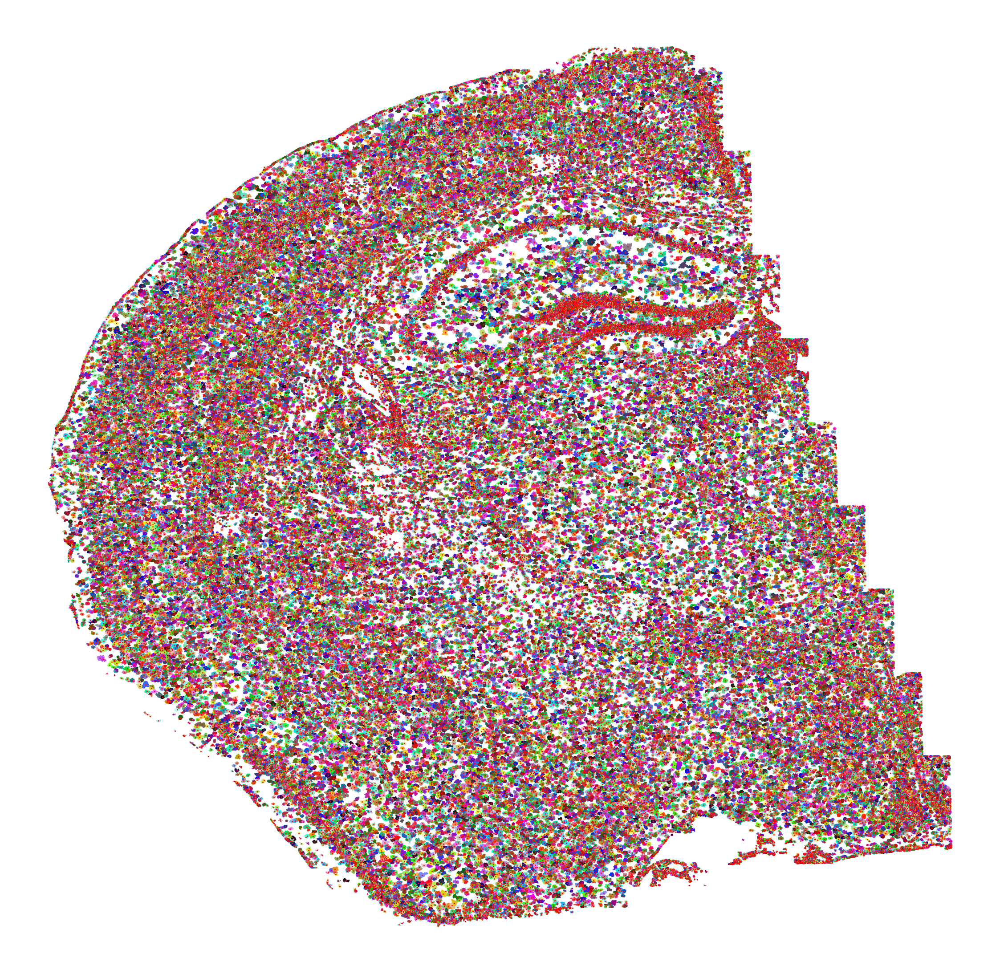

In [32]:
# plot spots
cell_ids = remain_reads['cell_barcode']
cells_unique = np.unique(cell_ids)
spots_repr = np.array(remain_reads[['spot_location_2', 'spot_location_1']])[cell_ids>=0]
cell_ids = cell_ids[cell_ids>=0]                
cmap = np.random.rand(int(max(cell_ids)+1), 3)
fig, ax = plt.subplots(figsize=(40,40))
ax.scatter(spots_repr[:,1], spots_repr[:,0], c=cmap[[int(x) for x in cell_ids]], s=1, alpha=.5)
ax.scatter(cell_center.loc[:,'column'], cell_center.loc[:,'row'], c='r', s=3)
plt.axis('off')
plt.show()

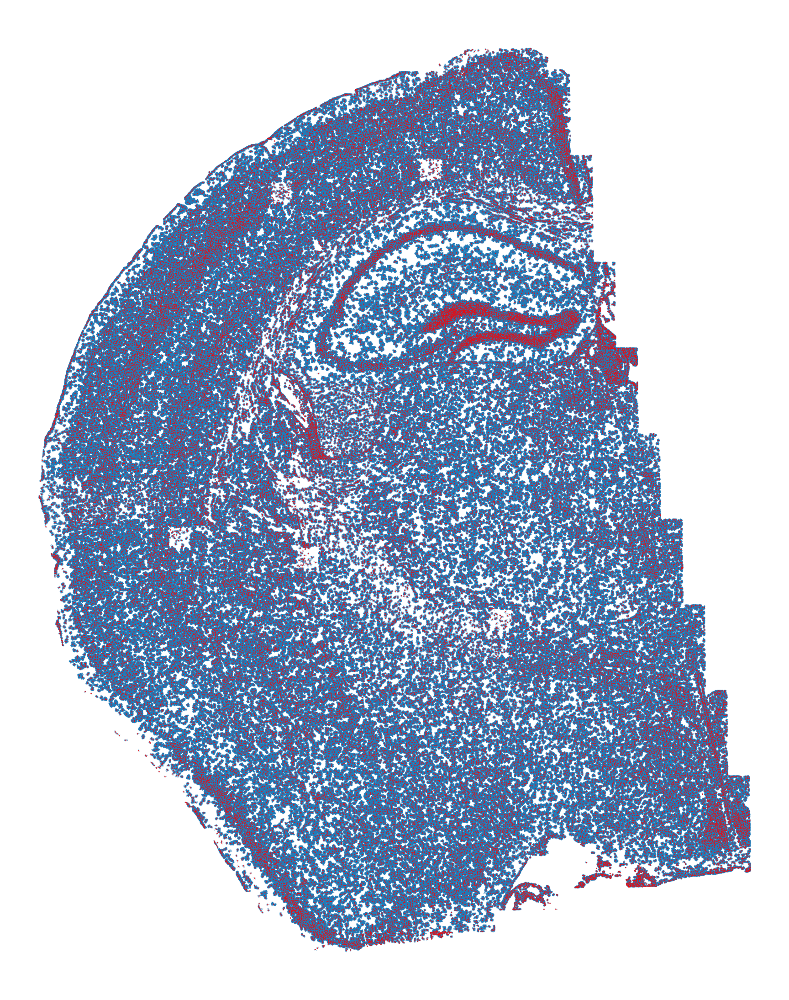

In [33]:
fig, ax = plt.subplots(figsize=[40,40])
plt.scatter(remain_reads.loc[:,'spot_location_1'], remain_reads.loc[:,'spot_location_2'], s=1, alpha=0.2)
plt.scatter(cell_center.loc[:,'column'], cell_center.loc[:,'row'], s=3, c='red', alpha = 0.7)

# plt.scatter(remain_reads.loc[:,'spot_location_1'], shape_row - remain_reads.loc[:,'spot_location_2'], s=1, alpha=0.2)
# plt.scatter(cell_center.loc[:,'column'], shape_row - cell_center.loc[:,'row'], s=3, c='red', alpha = 0.7)

ax.set_aspect('equal')
ax.axis('off')
plt.show()

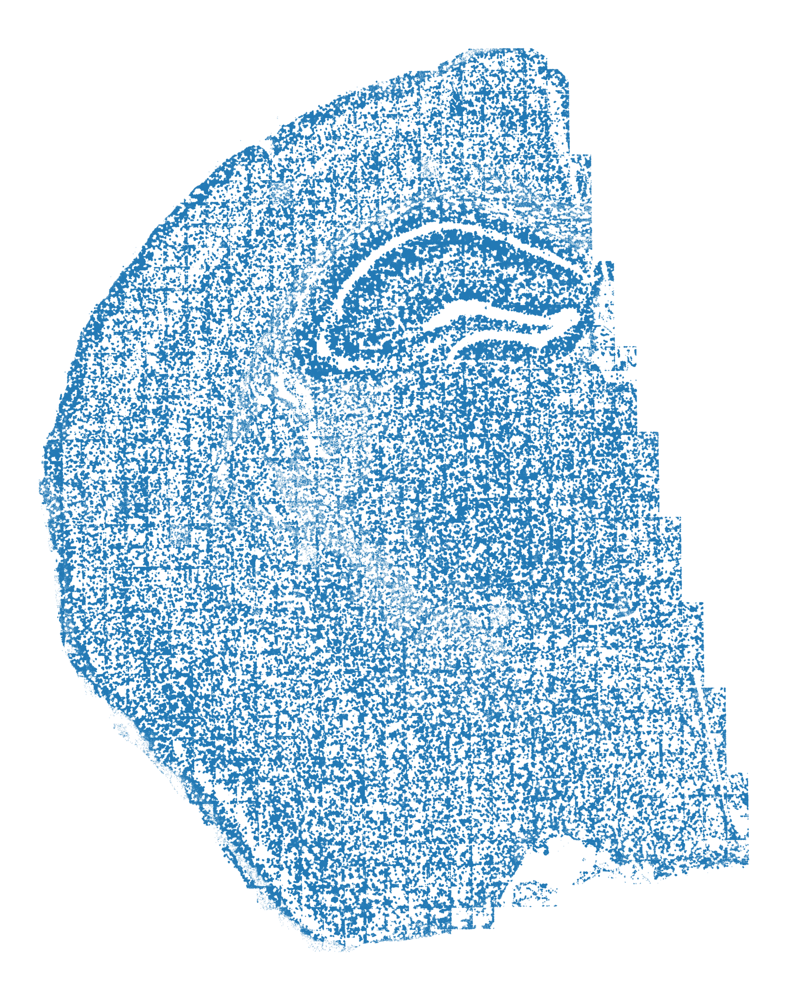

In [17]:
fig, ax = plt.subplots(figsize=[40,40])
plt.scatter(remain_reads.loc[:,'spot_location_1'], remain_reads.loc[:,'spot_location_2'], s=1, alpha=0.2)

ax.set_aspect('equal')
ax.axis('off')
plt.show()